In [1]:
import pandas as pd
import numpy as np
from keras.layers import LSTM
import keras
np.random.seed()

# load data

In [2]:
df1_ori=pd.read_csv('____newIdea_data.csv', low_memory=False)

In [3]:
df1_ori

,time_period,final_result,activity1,activity2,activity3,activity4,activity5,activity6,activity7,activity8,activity9,activity10,activity11,activity12,id1
0,0,0,12.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,1,0,9.0,0.0,5.0,7.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,2,0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,3,0,7.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,4,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
213635,35,1,7.0,1.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5340
213636,36,1,1.0,4.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5340
213637,37,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5340
213638,38,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5340


In [4]:
df1_sorted=df1_ori.sort_values(by=['id1','time_period'])
df1_sorted.head()

,time_period,final_result,activity1,activity2,activity3,activity4,activity5,activity6,activity7,activity8,activity9,activity10,activity11,activity12,id1
0,0,0,12.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,1,0,9.0,0.0,5.0,7.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,2,0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,3,0,7.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,4,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [5]:
df1_sorted.info() # final_result  is an object

<class 'pandas.core.frame.DataFrame'>
Int64Index: 213640 entries, 0 to 213639
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   time_period   213640 non-null  int64  
 1   final_result  213640 non-null  int64  
 2   activity1     213640 non-null  float64
 3   activity2     213640 non-null  float64
 4   activity3     213640 non-null  float64
 5   activity4     213640 non-null  float64
 6   activity5     213640 non-null  float64
 7   activity6     213640 non-null  float64
 8   activity7     213640 non-null  float64
 9   activity8     213640 non-null  float64
 10  activity9     213640 non-null  float64
 11  activity10    213640 non-null  float64
 12  activity11    213640 non-null  float64
 13  activity12    213640 non-null  float64
 14  id1           213640 non-null  int64  
dtypes: float64(12), int64(3)
memory usage: 26.1 MB


## factorizing the final result....pass=0, fail=1

########################### Same length window ########################

# prepare dataset for y

In [6]:
def make_labels(df):
    labels=[]
    for x in range(0,40):
        labels.append(list(df.iloc[0:x+1,1:2].values[x]))
    return labels

In [7]:
df_label=pd.DataFrame({})
for num in df1_sorted['id1'].unique():    #遍历id1这个列的每一个unique的值
    t=make_labels(df1_sorted[df1_sorted['id1']==num]) #make frame fr each unique id，赋值给t
    
    print("student",num,"label:",t) #打印出以上‘全过程’
    df_label=df_label.append(t) # the total df that has all the row for each id #每一个‘全过程’都尾部附加给df_label
                        # 0-37 for 1 id, 38-75 for 2nd id...(75+38=113)....
    


student 0 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 38 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 39 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 40 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 41 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 42 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 77 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 78 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 79 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 80 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 81 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 122 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 123 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 124 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 125 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 126 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 166 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 167 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 168 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 169 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 170 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 211 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 212 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 213 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 214 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 215 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 256 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 257 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 258 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 259 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 260 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 300 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 301 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 302 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 303 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 304 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 345 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 346 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 347 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 348 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 349 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 389 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 390 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 391 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 392 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 393 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 433 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 434 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 435 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 436 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 437 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 477 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 478 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 479 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 480 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 481 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 521 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 522 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 523 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 524 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 525 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 565 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 566 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 567 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 568 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 569 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 609 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 610 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 611 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 612 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 613 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 653 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 654 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 655 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 656 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 657 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 697 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 698 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 699 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 700 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 701 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 741 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 742 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 743 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 744 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 745 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 786 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 787 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 788 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 789 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 790 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 830 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 831 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 832 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 833 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 834 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 874 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 875 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 876 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 877 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 878 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 918 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 919 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 920 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 921 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 922 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 962 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 963 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 964 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 965 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 966 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 1008 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1009 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1010 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1011 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1012 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 1054 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1055 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1056 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1057 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1058 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 1098 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1099 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1100 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1101 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1102 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 1143 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1144 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1145 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1146 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1147 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 1187 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1188 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1189 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1190 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1191 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 1230 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1231 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1232 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1233 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1234 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 1273 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1274 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1275 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1276 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1277 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 1317 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1318 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1319 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1320 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1321 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 1361 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1362 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1363 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1364 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1365 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 1405 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1406 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1407 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1408 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1409 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 1449 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1450 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1451 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1452 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1453 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 1494 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1495 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1496 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1497 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1498 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 1538 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1539 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1540 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1541 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1542 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 1582 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1583 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1584 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1585 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1586 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 1626 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1627 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1628 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1629 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1630 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 1670 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1671 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1672 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1673 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1674 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 1713 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1714 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1715 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1716 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1717 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 1757 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1758 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1759 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1760 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1761 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 1801 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1802 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1803 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1804 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1805 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 1845 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1846 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1847 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1848 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1849 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 1889 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1890 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1891 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1892 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1893 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 1927 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1928 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1929 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1930 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1931 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 1969 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1970 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1971 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 1972 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 1973 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 2013 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2014 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2015 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2016 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2017 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 2056 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2057 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2058 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2059 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2060 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 2100 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2101 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2102 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2103 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2104 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 2143 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2144 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2145 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2146 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2147 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 2188 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2189 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2190 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2191 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2192 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 2232 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2233 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2234 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2235 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2236 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 2276 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2277 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2278 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2279 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2280 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 2320 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2321 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2322 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2323 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2324 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 2364 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2365 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2366 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2367 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2368 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 2408 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2409 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2410 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2411 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2412 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 2452 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2453 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2454 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2455 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2456 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 2496 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2497 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2498 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2499 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2500 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 2539 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2540 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2541 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2542 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2543 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 2584 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2585 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2586 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2587 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2588 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 2628 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2629 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2630 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2631 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2632 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 2672 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2673 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2674 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2675 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2676 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 2716 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2717 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2718 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2719 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2720 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 2759 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2760 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2761 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2762 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2763 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 2802 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2803 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2804 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2805 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2806 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 2843 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2844 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2845 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2846 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2847 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 2885 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2886 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2887 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2888 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2889 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 2929 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2930 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2931 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2932 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2933 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 2971 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2972 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2973 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 2974 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 2975 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 3014 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3015 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3016 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3017 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3018 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 3057 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3058 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3059 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3060 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3061 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 3096 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3097 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3098 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3099 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3100 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 3139 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3140 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3141 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3142 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3143 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 3181 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3182 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3183 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3184 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3185 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 3223 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3224 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3225 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3226 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3227 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 3265 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3266 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3267 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3268 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3269 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 3308 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3309 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3310 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3311 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3312 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 3351 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3352 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3353 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3354 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3355 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 3393 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3394 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3395 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3396 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3397 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 3435 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3436 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3437 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3438 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3439 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 3478 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3479 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3480 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3481 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3482 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 3519 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3520 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3521 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3522 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3523 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 3561 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3562 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3563 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3564 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3565 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 3603 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3604 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3605 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3606 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3607 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 3645 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3646 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3647 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3648 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3649 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 3687 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3688 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3689 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3690 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3691 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 3728 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3729 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3730 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3731 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3732 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 3770 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3771 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3772 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3773 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3774 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 3812 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3813 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3814 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3815 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3816 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 3853 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3854 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3855 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3856 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3857 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 3895 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3896 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3897 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3898 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3899 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 3937 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3938 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 3939 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3940 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3941 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 3979 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3980 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3981 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3982 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 3983 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 4021 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4022 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4023 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4024 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4025 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4063 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4064 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4065 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4066 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4067 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4105 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4106 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4107 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4108 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4109 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4152 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4153 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4154 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4155 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4156 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4191 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4192 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4193 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4194 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4195 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4231 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4232 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4233 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4234 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4235 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4280 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4281 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4282 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4283 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4284 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 4323 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4324 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4325 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4326 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4327 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4363 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4364 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4365 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4366 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4367 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4407 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4408 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4409 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4410 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4411 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4449 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4450 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4451 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4452 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4453 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 4491 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4492 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4493 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4494 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4495 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4533 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4534 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4535 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4536 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4537 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4572 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4573 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4574 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4575 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4576 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 4616 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4617 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4618 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4619 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4620 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4659 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4660 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4661 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4662 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4663 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4702 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4703 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4704 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4705 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4706 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4746 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4747 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4748 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4749 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4750 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4789 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4790 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4791 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4792 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4793 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 4827 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4828 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4829 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4830 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4831 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4870 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4871 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4872 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4873 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4874 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4914 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4915 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4916 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4917 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4918 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4956 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4957 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4958 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 4959 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4960 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 4998 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 4999 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5000 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 5001 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 5002 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 5042 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5043 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5044 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5045 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5046 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 5085 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5086 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5087 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5088 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 5089 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 5127 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5128 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5129 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5130 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5131 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 5169 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5170 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5171 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5172 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5173 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 5212 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 5213 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 5214 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5215 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5216 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], 

student 5254 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5255 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5256 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5257 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5258 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 5297 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5298 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5299 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 5300 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
student 5301 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], 

student 5339 label: [[0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0], [0]]
student 5340 label: [[1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]


In [8]:
print(df_label) # df_label 是所有 t 的合集 25 weeks * 25541 students = 638,525 rows

    0
0   0
1   0
2   0
3   0
4   0
.. ..
35  1
36  1
37  1
38  1
39  1

[213640 rows x 1 columns]


In [9]:
print(type(df_label))

<class 'pandas.core.frame.DataFrame'>


# prepare dataset for X

In [10]:
df1=df1_sorted.drop(['final_result'], axis=1)

In [11]:
df1.head()

,time_period,activity1,activity2,activity3,activity4,activity5,activity6,activity7,activity8,activity9,activity10,activity11,activity12,id1
0,0,12.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,1,9.0,0.0,5.0,7.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,2,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,3,7.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [12]:
def make_frames1(df):
    
    
    trys = []    # try是一个空list
    big_flat=[]  # big_flat也是一个空list

    for x in range(0,40):   # 在0至24之间遍历（week1至week25）
        
        trys.append(list(df.iloc[0:x+1,1:13].values[x])) # 1:21是所有activity type列（20列）
            # 第1次遍历（x=0），df.iloc[0:1,1:21].values[0] (将第1行的value提取出来放入trys的尾部)
            # 第2次遍历（x=1），df.iloc[0:2,1:21].values[1] (将第2行的value提取出来放入trys的尾部)
            # 第3次遍历（x=2），df.iloc[0:3,1:21].values[2] (将第3行的value提取出来放入trys的尾部)
            # ...
        flat_list=[]   # flat_list是一个空list
        for sublist in trys:        # 第1次遍历（x=0），trys contain 第1行的value
                                    # 第2次遍历（x=1），trys contain 第1,2行的value
                                    # 第25次遍历（x=24），trys contain 第1,2,...24,25行的value
            for item in sublist:    # 第1次遍历（x=0），trys contain 第1行的value: 20 items
                                    # 第2次遍历（x=1），trys contain 第1,2行的value: 40 items
                flat_list.append(item)  # 第1次遍历（x=0），20 items 放入 flat_list的尾部
                                        # 第2次遍历（x=1），40 items 放入 flat_list的尾部
        big_flat.append(flat_list)  # 第1次遍历（x=0），flat_list中的20 items放入big_flat的尾部
                                    # 第2次遍历（x=1），flat_list中的40 items放入big_flat的尾部
    #padding
    for i in range(0,40):  # 在0至24之间遍历（week1至week25）
        op=len(big_flat[i])
        for w in range(0,(480-op)):
            big_flat[i].append(-1)
    
    data_a=pd.DataFrame({"bigflat":big_flat}) 
    return data_a

r each unique id, it will create dataframes, <br>
appending 0-37 rows for each unique id 

In [13]:
dfnew=pd.DataFrame({})
for num in df1['id1'].unique():    
    t=make_frames1(df1[df1['id1']==num])# make frame fr each unique id
    #t=t.sort_values(by=['id1'])
    print("student",num,"features:",t)
    #print("t",t)
    dfnew=dfnew.append(t) # the total df that has all the row for each id
                        # 0-37 for 1 id, 38-75 for 2nd id...(75+38=113)....

student 0 features:                                               bigflat
0   [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
1   [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
2   [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
3   [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
4   [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
5   [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
6   [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
7   [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
8   [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
9   [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
10  [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
11  [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
12  [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
13  [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
14  [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
15  [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
16  [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
17  [12.

student 5 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0.0

student 11 features:                                               bigflat
0   [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
1   [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
2   [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
3   [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
4   [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
5   [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
6   [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
7   [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
8   [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
9   [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
10  [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
11  [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
12  [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
13  [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
14  [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
15  [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
16  [16.0, 1.0, 9.0, 7.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
17  [16

student 17 features:                                               bigflat
0   [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 6.0, 9.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
17  [0.

student 24 features:                                               bigflat
0   [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
1   [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
2   [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
3   [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
4   [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
5   [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
6   [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
7   [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
8   [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
9   [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
10  [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
11  [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
12  [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
13  [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
14  [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
15  [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
16  [11.0, 1.0, 1.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
17  [11

student 30 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0.

student 37 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0.

student 44 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0.

student 51 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0.

student 58 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0.

student 64 features:                                               bigflat
0   [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
1   [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
2   [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
3   [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
4   [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
5   [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
6   [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
7   [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
8   [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
9   [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
10  [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
11  [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
12  [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
13  [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
14  [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
15  [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
16  [7.0, 1.0, 12.0, 1.0, 1.0, 4.0, 5.0, 0.0, 0.0,...
17  [7.

student 71 features:                                               bigflat
0   [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
1   [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
2   [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
3   [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
4   [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
5   [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
6   [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
7   [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
8   [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
9   [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
10  [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
11  [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
12  [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
13  [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
14  [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
15  [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
16  [20.0, 1.0, 6.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
17  [20

39  [2.0, 1.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
student 78 features:                                               bigflat
0   [2.0, 1.0, 5.0, 5.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
1   [2.0, 1.0, 5.0, 5.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
2   [2.0, 1.0, 5.0, 5.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
3   [2.0, 1.0, 5.0, 5.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
4   [2.0, 1.0, 5.0, 5.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
5   [2.0, 1.0, 5.0, 5.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
6   [2.0, 1.0, 5.0, 5.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
7   [2.0, 1.0, 5.0, 5.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
8   [2.0, 1.0, 5.0, 5.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
9   [2.0, 1.0, 5.0, 5.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
10  [2.0, 1.0, 5.0, 5.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
11  [2.0, 1.0, 5.0, 5.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
12  [2.0, 1.0, 5.0, 5.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
13  [2.0, 1.0, 5.0, 5.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
14  [2.0, 1.0, 5.0, 5.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
15  [2.0, 1.0, 5.0, 5.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
16  [2.

student 84 features:                                               bigflat
0   [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
1   [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
2   [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
3   [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
4   [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
5   [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
6   [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
7   [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
8   [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
9   [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
10  [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
11  [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
12  [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
13  [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
14  [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
15  [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
16  [89.0, 1.0, 16.0, 28.0, 0.0, 3.0, 4.0, 0.0, 0....
17  [89

student 91 features:                                               bigflat
0   [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
1   [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
2   [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
3   [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
4   [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
5   [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
6   [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
7   [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
8   [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
9   [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
10  [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
11  [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
12  [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
13  [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
14  [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
15  [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
16  [24.0, 0.0, 5.0, 20.0, 1.0, 6.0, 5.0, 0.0, 0.0...
17  [24

student 98 features:                                               bigflat
0   [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
1   [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
2   [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
3   [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
4   [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
5   [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
6   [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
7   [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
8   [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
9   [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
10  [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
11  [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
12  [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
13  [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
14  [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
15  [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
16  [0.0, 0.0, 2.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
17  [0.

student 105 features:                                               bigflat
0   [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
1   [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
2   [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
3   [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
4   [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
5   [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
6   [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
7   [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
8   [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
9   [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
10  [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
11  [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
12  [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
13  [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
14  [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
15  [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
16  [6.0, 0.0, 3.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
17  [6

student 112 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 118 features:                                               bigflat
0   [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
1   [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
2   [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
3   [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
4   [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
5   [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
6   [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
7   [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
8   [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
9   [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
10  [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
11  [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
12  [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
13  [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
14  [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
15  [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
16  [4.0, 0.0, 4.0, 3.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
17  [4

student 125 features:                                               bigflat
0   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 132 features:                                               bigflat
0   [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
1   [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
2   [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
3   [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
4   [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
5   [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
6   [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
7   [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
8   [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
9   [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
10  [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
11  [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
12  [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
13  [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
14  [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
15  [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
16  [25.0, 0.0, 12.0, 33.0, 0.0, 6.0, 2.0, 0.0, 0....
17  [2

student 139 features:                                               bigflat
0   [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
1   [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
2   [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
3   [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
4   [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
5   [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
6   [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
7   [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
8   [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
9   [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
10  [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
11  [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
12  [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
13  [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
14  [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
15  [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
16  [22.0, 2.0, 8.0, 14.0, 0.0, 5.0, 2.0, 0.0, 0.0...
17  [2

student 146 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 153 features:                                               bigflat
0   [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
1   [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
2   [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
3   [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
4   [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
5   [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
6   [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
7   [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
8   [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
9   [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
10  [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
11  [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
12  [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
13  [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
14  [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
15  [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
16  [0.0, 1.0, 4.0, 9.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
17  [0

39  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 160 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0

student 166 features:                                               bigflat
0   [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
1   [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
2   [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
3   [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
4   [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
5   [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
6   [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
7   [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
8   [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
9   [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
10  [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
11  [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
12  [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
13  [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
14  [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
15  [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
16  [0.0, 0.0, 18.0, 31.0, 1.0, 44.0, 6.0, 0.0, 0....
17  [0

student 172 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 179 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 186 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

39  [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
student 193 features:                                               bigflat
0   [12.0, 4.0, 7.0, 16.0, 0.0, 2.0, 3.0, 0.0, 0.0...
1   [12.0, 4.0, 7.0, 16.0, 0.0, 2.0, 3.0, 0.0, 0.0...
2   [12.0, 4.0, 7.0, 16.0, 0.0, 2.0, 3.0, 0.0, 0.0...
3   [12.0, 4.0, 7.0, 16.0, 0.0, 2.0, 3.0, 0.0, 0.0...
4   [12.0, 4.0, 7.0, 16.0, 0.0, 2.0, 3.0, 0.0, 0.0...
5   [12.0, 4.0, 7.0, 16.0, 0.0, 2.0, 3.0, 0.0, 0.0...
6   [12.0, 4.0, 7.0, 16.0, 0.0, 2.0, 3.0, 0.0, 0.0...
7   [12.0, 4.0, 7.0, 16.0, 0.0, 2.0, 3.0, 0.0, 0.0...
8   [12.0, 4.0, 7.0, 16.0, 0.0, 2.0, 3.0, 0.0, 0.0...
9   [12.0, 4.0, 7.0, 16.0, 0.0, 2.0, 3.0, 0.0, 0.0...
10  [12.0, 4.0, 7.0, 16.0, 0.0, 2.0, 3.0, 0.0, 0.0...
11  [12.0, 4.0, 7.0, 16.0, 0.0, 2.0, 3.0, 0.0, 0.0...
12  [12.0, 4.0, 7.0, 16.0, 0.0, 2.0, 3.0, 0.0, 0.0...
13  [12.0, 4.0, 7.0, 16.0, 0.0, 2.0, 3.0, 0.0, 0.0...
14  [12.0, 4.0, 7.0, 16.0, 0.0, 2.0, 3.0, 0.0, 0.0...
15  [12.0, 4.0, 7.0, 16.0, 0.0, 2.0, 3.0, 0.0, 0.0...
16  [1

student 199 features:                                               bigflat
0   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 206 features:                                               bigflat
0   [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
1   [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
2   [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
3   [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
4   [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
5   [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
6   [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
7   [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
8   [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
9   [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
10  [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
11  [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
12  [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
13  [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
14  [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
15  [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
16  [87.0, 1.0, 7.0, 8.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
17  [8

student 212 features:                                               bigflat
0   [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
1   [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
2   [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
3   [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
4   [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
5   [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
6   [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
7   [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
8   [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
9   [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
10  [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
11  [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
12  [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
13  [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
14  [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
15  [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
16  [45.0, 1.0, 8.0, 38.0, 0.0, 8.0, 3.0, 0.0, 0.0...
17  [4

student 216 features:                                               bigflat
0   [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
1   [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
2   [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
3   [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
4   [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
5   [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
6   [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
7   [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
8   [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
9   [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
10  [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
11  [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
12  [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
13  [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
14  [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
15  [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
16  [0.0, 1.0, 9.0, 9.0, 0.0, 10.0, 3.0, 0.0, 0.0,...
17  [0

student 221 features:                                               bigflat
0   [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
1   [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
2   [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
3   [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
4   [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
5   [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
6   [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
7   [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
8   [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
9   [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
10  [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
11  [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
12  [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
13  [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
14  [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
15  [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
16  [70.0, 1.0, 3.0, 22.0, 0.0, 1.0, 4.0, 0.0, 0.0...
17  [7

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 226 features:                                               bigflat
0   [13.0, 1.0, 6.0, 11.0, 0.0, 3.0, 2.0, 0.0, 0.0...
1   [13.0, 1.0, 6.0, 11.0, 0.0, 3.0, 2.0, 0.0, 0.0...
2   [13.0, 1.0, 6.0, 11.0, 0.0, 3.0, 2.0, 0.0, 0.0...
3   [13.0, 1.0, 6.0, 11.0, 0.0, 3.0, 2.0, 0.0, 0.0...
4   [13.0, 1.0, 6.0, 11.0, 0.0, 3.0, 2.0, 0.0, 0.0...
5   [13.0, 1.0, 6.0, 11.0, 0.0, 3.0, 2.0, 0.0, 0.0...
6   [13.0, 1.0, 6.0, 11.0, 0.0, 3.0, 2.0, 0.0, 0.0...
7   [13.0, 1.0, 6.0, 11.0, 0.0, 3.0, 2.0, 0.0, 0.0...
8   [13.0, 1.0, 6.0, 11.0, 0.0, 3.0, 2.0, 0.0, 0.0...
9   [13.0, 1.0, 6.0, 11.0, 0.0, 3.0, 2.0, 0.0, 0.0...
10  [13.0, 1.0, 6.0, 11.0, 0.0, 3.0, 2.0, 0.0, 0.0...
11  [13.0, 1.0, 6.0, 11.0, 0.0, 3.0, 2.0, 0.0, 0.0...
12  [13.0, 1.0, 6.0, 11.0, 0.0, 3.0, 2.0, 0.0, 0.0...
13  [13.0, 1.0, 6.0, 11.0, 0.0, 3.0, 2.0, 0.0, 0.0...
14  [13.0, 1.0, 6.0, 11.0, 0.0, 3.0, 2.0, 0.0, 0.0...
15  [13.0, 1.0, 6.0, 11.0, 0.0, 3.0, 2.0, 0.0, 0.0...
16  [1

student 233 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 240 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 247 features:                                               bigflat
0   [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
16  [0.0, 0.0, 1.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
17  [0

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 254 features:                                               bigflat
0   [30.0, 1.0, 6.0, 23.0, 0.0, 5.0, 7.0, 0.0, 0.0...
1   [30.0, 1.0, 6.0, 23.0, 0.0, 5.0, 7.0, 0.0, 0.0...
2   [30.0, 1.0, 6.0, 23.0, 0.0, 5.0, 7.0, 0.0, 0.0...
3   [30.0, 1.0, 6.0, 23.0, 0.0, 5.0, 7.0, 0.0, 0.0...
4   [30.0, 1.0, 6.0, 23.0, 0.0, 5.0, 7.0, 0.0, 0.0...
5   [30.0, 1.0, 6.0, 23.0, 0.0, 5.0, 7.0, 0.0, 0.0...
6   [30.0, 1.0, 6.0, 23.0, 0.0, 5.0, 7.0, 0.0, 0.0...
7   [30.0, 1.0, 6.0, 23.0, 0.0, 5.0, 7.0, 0.0, 0.0...
8   [30.0, 1.0, 6.0, 23.0, 0.0, 5.0, 7.0, 0.0, 0.0...
9   [30.0, 1.0, 6.0, 23.0, 0.0, 5.0, 7.0, 0.0, 0.0...
10  [30.0, 1.0, 6.0, 23.0, 0.0, 5.0, 7.0, 0.0, 0.0...
11  [30.0, 1.0, 6.0, 23.0, 0.0, 5.0, 7.0, 0.0, 0.0...
12  [30.0, 1.0, 6.0, 23.0, 0.0, 5.0, 7.0, 0.0, 0.0...
13  [30.0, 1.0, 6.0, 23.0, 0.0, 5.0, 7.0, 0.0, 0.0...
14  [30.0, 1.0, 6.0, 23.0, 0.0, 5.0, 7.0, 0.0, 0.0...
15  [30.0, 1.0, 6.0, 23.0, 0.0, 5.0, 7.0, 0.0, 0.0...
16  [3

student 260 features:                                               bigflat
0   [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
1   [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
2   [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
3   [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
4   [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
5   [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
6   [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
7   [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
8   [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
9   [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
10  [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
11  [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
12  [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
13  [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
14  [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
15  [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
16  [8.0, 0.0, 5.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
17  [8

student 267 features:                                               bigflat
0   [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
1   [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
2   [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
3   [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
4   [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
5   [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
6   [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
7   [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
8   [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
9   [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
10  [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
11  [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
12  [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
13  [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
14  [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
15  [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
16  [3.0, 0.0, 7.0, 7.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
17  [3

student 273 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 280 features:                                               bigflat
0   [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
1   [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
2   [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
3   [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
4   [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
5   [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
6   [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
7   [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
8   [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
9   [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
10  [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
11  [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
12  [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
13  [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
14  [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
15  [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
16  [40.0, 0.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
17  [4

student 286 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

39  [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 293 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0

student 299 features:                                               bigflat
0   [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
1   [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
2   [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
3   [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
4   [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
5   [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
6   [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
7   [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
8   [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
9   [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
10  [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
11  [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
12  [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
13  [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
14  [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
15  [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
16  [16.0, 1.0, 2.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
17  [1

39  [0.0, 0.0, 2.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 306 features:                                               bigflat
0   [9.0, 3.0, 9.0, 17.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
1   [9.0, 3.0, 9.0, 17.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
2   [9.0, 3.0, 9.0, 17.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
3   [9.0, 3.0, 9.0, 17.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
4   [9.0, 3.0, 9.0, 17.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
5   [9.0, 3.0, 9.0, 17.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
6   [9.0, 3.0, 9.0, 17.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
7   [9.0, 3.0, 9.0, 17.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
8   [9.0, 3.0, 9.0, 17.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
9   [9.0, 3.0, 9.0, 17.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
10  [9.0, 3.0, 9.0, 17.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
11  [9.0, 3.0, 9.0, 17.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
12  [9.0, 3.0, 9.0, 17.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
13  [9.0, 3.0, 9.0, 17.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
14  [9.0, 3.0, 9.0, 17.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
15  [9.0, 3.0, 9.0, 17.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
16  [9

student 312 features:                                               bigflat
0   [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
1   [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
2   [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
3   [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
4   [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
5   [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
6   [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
7   [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
8   [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
9   [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
10  [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
11  [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
12  [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
13  [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
14  [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
15  [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
16  [26.0, 2.0, 46.0, 39.0, 0.0, 23.0, 2.0, 0.0, 0...
17  [2

student 318 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 322 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 327 features:                                               bigflat
0   [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
1   [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
2   [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
3   [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
4   [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
5   [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
6   [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
7   [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
8   [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
9   [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
10  [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
11  [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
12  [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
13  [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
14  [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
15  [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
16  [352.0, 0.0, 5.0, 82.0, 0.0, 2.0, 1.0, 0.0, 0....
17  [3

student 331 features:                                               bigflat
0   [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
1   [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
2   [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
3   [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
4   [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
5   [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
6   [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
7   [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
8   [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
9   [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
10  [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
11  [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
12  [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
13  [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
14  [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
15  [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
16  [10.0, 1.0, 13.0, 49.0, 0.0, 10.0, 5.0, 0.0, 0...
17  [1

student 338 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 344 features:                                               bigflat
0   [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
1   [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
2   [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
3   [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
4   [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
5   [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
6   [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
7   [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
8   [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
9   [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
10  [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
11  [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
12  [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
13  [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
14  [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
15  [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
16  [53.0, 1.0, 5.0, 25.0, 0.0, 7.0, 3.0, 0.0, 0.0...
17  [5

student 349 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 354 features:                                               bigflat
0   [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
1   [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
2   [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
3   [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
4   [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
5   [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
6   [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
7   [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
8   [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
9   [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
10  [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
11  [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
12  [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
13  [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
14  [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
15  [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
16  [3.0, 1.0, 3.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
17  [3

student 360 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 366 features:                                               bigflat
0   [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
1   [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
2   [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
3   [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
4   [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
5   [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
6   [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
7   [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
8   [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
9   [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
10  [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
11  [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
12  [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
13  [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
14  [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
15  [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
16  [185.0, 2.0, 24.0, 101.0, 0.0, 7.0, 12.0, 0.0,...
17  [1

student 373 features:                                               bigflat
0   [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
1   [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
2   [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
3   [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
4   [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
5   [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
6   [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
7   [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
8   [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
9   [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
10  [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
11  [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
12  [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
13  [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
14  [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
15  [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
16  [8.0, 1.0, 13.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
17  [8

39  [27.0, 1.0, 2.0, 11.0, 0.0, 2.0, 2.0, 0.0, 0.0...
student 380 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0

student 386 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 390 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 395 features:                                               bigflat
0   [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
1   [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
2   [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
3   [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
4   [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
5   [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
6   [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
7   [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
8   [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
9   [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
10  [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
11  [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
12  [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
13  [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
14  [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
15  [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
16  [0.0, 0.0, 10.0, 15.0, 0.0, 8.0, 2.0, 0.0, 0.0...
17  [0

student 399 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 403 features:                                               bigflat
0   [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
1   [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
2   [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
3   [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
4   [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
5   [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
6   [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
7   [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
8   [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
9   [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
10  [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
11  [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
12  [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
13  [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
14  [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
15  [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
16  [21.0, 0.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
17  [2

39  [63.0, 2.0, 14.0, 13.0, 0.0, 12.0, 4.0, 0.0, 0...
student 409 features:                                               bigflat
0   [33.0, 0.0, 3.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0...
1   [33.0, 0.0, 3.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0...
2   [33.0, 0.0, 3.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0...
3   [33.0, 0.0, 3.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0...
4   [33.0, 0.0, 3.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0...
5   [33.0, 0.0, 3.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0...
6   [33.0, 0.0, 3.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0...
7   [33.0, 0.0, 3.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0...
8   [33.0, 0.0, 3.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0...
9   [33.0, 0.0, 3.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0...
10  [33.0, 0.0, 3.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0...
11  [33.0, 0.0, 3.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0...
12  [33.0, 0.0, 3.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0...
13  [33.0, 0.0, 3.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0...
14  [33.0, 0.0, 3.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0...
15  [33.0, 0.0, 3.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0...
16  [3

student 413 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 417 features:                                               bigflat
0   [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
1   [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
2   [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
3   [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
4   [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
5   [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
6   [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
7   [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
8   [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
9   [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
10  [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
11  [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
12  [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
13  [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
14  [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
15  [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
16  [44.0, 2.0, 10.0, 40.0, 0.0, 8.0, 8.0, 0.0, 0....
17  [4

student 421 features:                                               bigflat
0   [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
1   [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
2   [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
3   [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
4   [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
5   [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
6   [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
7   [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
8   [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
9   [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
10  [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
11  [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
12  [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
13  [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
14  [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
15  [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
16  [0.0, 1.0, 12.0, 15.0, 1.0, 44.0, 15.0, 0.0, 0...
17  [0

student 426 features:                                               bigflat
0   [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
1   [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
2   [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
3   [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
4   [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
5   [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
6   [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
7   [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
8   [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
9   [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
10  [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
11  [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
12  [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
13  [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
14  [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
15  [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
16  [0.0, 2.0, 5.0, 10.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
17  [0

39  [6.0, 1.0, 2.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
student 431 features:                                               bigflat
0   [33.0, 0.0, 7.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
1   [33.0, 0.0, 7.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
2   [33.0, 0.0, 7.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
3   [33.0, 0.0, 7.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
4   [33.0, 0.0, 7.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
5   [33.0, 0.0, 7.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
6   [33.0, 0.0, 7.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
7   [33.0, 0.0, 7.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
8   [33.0, 0.0, 7.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
9   [33.0, 0.0, 7.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
10  [33.0, 0.0, 7.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
11  [33.0, 0.0, 7.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
12  [33.0, 0.0, 7.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
13  [33.0, 0.0, 7.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
14  [33.0, 0.0, 7.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
15  [33.0, 0.0, 7.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
16  [3

student 435 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

39  [8.0, 0.0, 2.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
student 440 features:                                               bigflat
0   [0.0, 1.0, 7.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 7.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 7.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 7.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 7.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 7.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 7.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 7.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 7.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 7.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 7.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 7.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 7.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 7.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 7.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 7.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [0

student 446 features:                                               bigflat
0   [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
1   [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
2   [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
3   [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
4   [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
5   [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
6   [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
7   [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
8   [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
9   [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
10  [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
11  [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
12  [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
13  [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
14  [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
15  [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
16  [17.0, 0.0, 3.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0.0...
17  [1

student 450 features:                                               bigflat
0   [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
1   [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
2   [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
3   [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
4   [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
5   [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
6   [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
7   [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
8   [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
9   [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
10  [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
11  [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
12  [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
13  [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
14  [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
15  [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
16  [1.0, 0.0, 5.0, 13.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
17  [1

student 455 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 460 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 467 features:                                               bigflat
0   [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [0

student 474 features:                                               bigflat
0   [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
1   [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
2   [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
3   [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
4   [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
5   [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
6   [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
7   [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
8   [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
9   [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
10  [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
11  [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
12  [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
13  [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
14  [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
15  [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
16  [30.0, 0.0, 9.0, 12.0, 0.0, 6.0, 4.0, 0.0, 0.0...
17  [3

student 481 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 486 features:                                               bigflat
0   [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
1   [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
2   [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
3   [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
4   [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
5   [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
6   [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
7   [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
8   [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
9   [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
10  [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
11  [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
12  [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
13  [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
14  [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
15  [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
16  [6.0, 0.0, 2.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
17  [6

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 493 features:                                               bigflat
0   [2.0, 1.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [2.0, 1.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [2.0, 1.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [2.0, 1.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [2.0, 1.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [2.0, 1.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [2.0, 1.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [2.0, 1.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [2.0, 1.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [2.0, 1.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [2.0, 1.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [2.0, 1.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [2.0, 1.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [2.0, 1.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [2.0, 1.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [2.0, 1.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [2

student 498 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 502 features:                                               bigflat
0   [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
1   [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
2   [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
3   [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
4   [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
5   [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
6   [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
7   [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
8   [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
9   [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
10  [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
11  [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
12  [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
13  [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
14  [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
15  [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
16  [2.0, 0.0, 9.0, 13.0, 0.0, 7.0, 3.0, 0.0, 0.0,...
17  [2

student 507 features:                                               bigflat
0   [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 3.0, 2.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
17  [0

student 511 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 516 features:                                               bigflat
0   [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
1   [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
2   [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
3   [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
4   [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
5   [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
6   [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
7   [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
8   [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
9   [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
10  [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
11  [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
12  [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
13  [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
14  [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
15  [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
16  [83.0, 1.0, 10.0, 36.0, 0.0, 5.0, 7.0, 0.0, 0....
17  [8

student 521 features:                                               bigflat
0   [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
1   [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
2   [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
3   [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
4   [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
5   [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
6   [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
7   [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
8   [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
9   [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
10  [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
11  [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
12  [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
13  [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
14  [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
15  [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
16  [19.0, 1.0, 10.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0....
17  [1

student 526 features:                                               bigflat
0   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [0

student 531 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 537 features:                                               bigflat
0   [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
1   [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
2   [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
3   [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
4   [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
5   [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
6   [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
7   [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
8   [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
9   [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
10  [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
11  [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
12  [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
13  [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
14  [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
15  [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
16  [0.0, 0.0, 11.0, 4.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
17  [0

student 543 features:                                               bigflat
0   [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
1   [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
2   [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
3   [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
4   [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
5   [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
6   [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
7   [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
8   [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
9   [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
10  [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
11  [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
12  [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
13  [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
14  [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
15  [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
16  [0.0, 1.0, 10.0, 10.0, 0.0, 7.0, 1.0, 0.0, 0.0...
17  [0

student 550 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

39  [35.0, 0.0, 8.0, 21.0, 0.0, 7.0, 7.0, 0.0, 0.0...
student 557 features:                                               bigflat
0   [39.0, 1.0, 7.0, 23.0, 0.0, 7.0, 4.0, 0.0, 0.0...
1   [39.0, 1.0, 7.0, 23.0, 0.0, 7.0, 4.0, 0.0, 0.0...
2   [39.0, 1.0, 7.0, 23.0, 0.0, 7.0, 4.0, 0.0, 0.0...
3   [39.0, 1.0, 7.0, 23.0, 0.0, 7.0, 4.0, 0.0, 0.0...
4   [39.0, 1.0, 7.0, 23.0, 0.0, 7.0, 4.0, 0.0, 0.0...
5   [39.0, 1.0, 7.0, 23.0, 0.0, 7.0, 4.0, 0.0, 0.0...
6   [39.0, 1.0, 7.0, 23.0, 0.0, 7.0, 4.0, 0.0, 0.0...
7   [39.0, 1.0, 7.0, 23.0, 0.0, 7.0, 4.0, 0.0, 0.0...
8   [39.0, 1.0, 7.0, 23.0, 0.0, 7.0, 4.0, 0.0, 0.0...
9   [39.0, 1.0, 7.0, 23.0, 0.0, 7.0, 4.0, 0.0, 0.0...
10  [39.0, 1.0, 7.0, 23.0, 0.0, 7.0, 4.0, 0.0, 0.0...
11  [39.0, 1.0, 7.0, 23.0, 0.0, 7.0, 4.0, 0.0, 0.0...
12  [39.0, 1.0, 7.0, 23.0, 0.0, 7.0, 4.0, 0.0, 0.0...
13  [39.0, 1.0, 7.0, 23.0, 0.0, 7.0, 4.0, 0.0, 0.0...
14  [39.0, 1.0, 7.0, 23.0, 0.0, 7.0, 4.0, 0.0, 0.0...
15  [39.0, 1.0, 7.0, 23.0, 0.0, 7.0, 4.0, 0.0, 0.0...
16  [3

student 563 features:                                               bigflat
0   [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
16  [0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
17  [0

39  [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
student 570 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 576 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0

student 582 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 589 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 595 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0

student 600 features:                                               bigflat
0   [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
1   [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
2   [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
3   [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
4   [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
5   [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
6   [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
7   [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
8   [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
9   [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
10  [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
11  [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
12  [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
13  [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
14  [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
15  [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
16  [80.0, 0.0, 8.0, 14.0, 0.0, 0.0, 0.0, 0.0, 0.0...
17  [8

39  [103.0, 1.0, 6.0, 82.0, 2.0, 4.0, 8.0, 0.0, 0....
student 604 features:                                               bigflat
0   [23.0, 0.0, 4.0, 13.0, 1.0, 1.0, 4.0, 0.0, 0.0...
1   [23.0, 0.0, 4.0, 13.0, 1.0, 1.0, 4.0, 0.0, 0.0...
2   [23.0, 0.0, 4.0, 13.0, 1.0, 1.0, 4.0, 0.0, 0.0...
3   [23.0, 0.0, 4.0, 13.0, 1.0, 1.0, 4.0, 0.0, 0.0...
4   [23.0, 0.0, 4.0, 13.0, 1.0, 1.0, 4.0, 0.0, 0.0...
5   [23.0, 0.0, 4.0, 13.0, 1.0, 1.0, 4.0, 0.0, 0.0...
6   [23.0, 0.0, 4.0, 13.0, 1.0, 1.0, 4.0, 0.0, 0.0...
7   [23.0, 0.0, 4.0, 13.0, 1.0, 1.0, 4.0, 0.0, 0.0...
8   [23.0, 0.0, 4.0, 13.0, 1.0, 1.0, 4.0, 0.0, 0.0...
9   [23.0, 0.0, 4.0, 13.0, 1.0, 1.0, 4.0, 0.0, 0.0...
10  [23.0, 0.0, 4.0, 13.0, 1.0, 1.0, 4.0, 0.0, 0.0...
11  [23.0, 0.0, 4.0, 13.0, 1.0, 1.0, 4.0, 0.0, 0.0...
12  [23.0, 0.0, 4.0, 13.0, 1.0, 1.0, 4.0, 0.0, 0.0...
13  [23.0, 0.0, 4.0, 13.0, 1.0, 1.0, 4.0, 0.0, 0.0...
14  [23.0, 0.0, 4.0, 13.0, 1.0, 1.0, 4.0, 0.0, 0.0...
15  [23.0, 0.0, 4.0, 13.0, 1.0, 1.0, 4.0, 0.0, 0.0...
16  [2

student 610 features:                                               bigflat
0   [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
1   [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
2   [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
3   [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
4   [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
5   [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
6   [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
7   [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
8   [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
9   [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
10  [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
11  [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
12  [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
13  [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
14  [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
15  [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
16  [95.0, 1.0, 15.0, 42.0, 1.0, 13.0, 6.0, 0.0, 0...
17  [9

student 617 features:                                               bigflat
0   [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
1   [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
2   [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
3   [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
4   [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
5   [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
6   [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
7   [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
8   [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
9   [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
10  [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
11  [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
12  [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
13  [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
14  [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
15  [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
16  [2.0, 1.0, 4.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
17  [2

student 624 features:                                               bigflat
0   [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
1   [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
2   [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
3   [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
4   [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
5   [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
6   [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
7   [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
8   [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
9   [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
10  [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
11  [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
12  [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
13  [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
14  [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
15  [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
16  [68.0, 2.0, 13.0, 34.0, 0.0, 11.0, 6.0, 0.0, 0...
17  [6

student 631 features:                                               bigflat
0   [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [4.0, 0.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
17  [4

student 637 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 644 features:                                               bigflat
0   [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
1   [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
2   [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
3   [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
4   [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
5   [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
6   [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
7   [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
8   [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
9   [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
10  [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
11  [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
12  [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
13  [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
14  [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
15  [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
16  [372.0, 2.0, 15.0, 45.0, 0.0, 11.0, 2.0, 0.0, ...
17  [3

student 650 features:                                               bigflat
0   [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
1   [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
2   [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
3   [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
4   [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
5   [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
6   [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
7   [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
8   [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
9   [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
10  [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
11  [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
12  [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
13  [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
14  [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
15  [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
16  [2.0, 1.0, 2.0, 4.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
17  [2

39  [0.0, 1.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
student 657 features:                                               bigflat
0   [39.0, 2.0, 7.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
1   [39.0, 2.0, 7.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
2   [39.0, 2.0, 7.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
3   [39.0, 2.0, 7.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
4   [39.0, 2.0, 7.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
5   [39.0, 2.0, 7.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
6   [39.0, 2.0, 7.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
7   [39.0, 2.0, 7.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
8   [39.0, 2.0, 7.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
9   [39.0, 2.0, 7.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
10  [39.0, 2.0, 7.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
11  [39.0, 2.0, 7.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
12  [39.0, 2.0, 7.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
13  [39.0, 2.0, 7.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
14  [39.0, 2.0, 7.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
15  [39.0, 2.0, 7.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
16  [3

39  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
student 663 features:                                               bigflat
0   [18.0, 1.0, 5.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
1   [18.0, 1.0, 5.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
2   [18.0, 1.0, 5.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
3   [18.0, 1.0, 5.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
4   [18.0, 1.0, 5.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
5   [18.0, 1.0, 5.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
6   [18.0, 1.0, 5.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
7   [18.0, 1.0, 5.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
8   [18.0, 1.0, 5.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
9   [18.0, 1.0, 5.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
10  [18.0, 1.0, 5.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
11  [18.0, 1.0, 5.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
12  [18.0, 1.0, 5.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
13  [18.0, 1.0, 5.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
14  [18.0, 1.0, 5.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
15  [18.0, 1.0, 5.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
16  [1

student 668 features:                                               bigflat
0   [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 2.0, 2.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
17  [0

student 675 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 681 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 688 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 695 features:                                               bigflat
0   [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
1   [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
2   [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
3   [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
4   [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
5   [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
6   [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
7   [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
8   [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
9   [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
10  [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
11  [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
12  [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
13  [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
14  [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
15  [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
16  [2.0, 0.0, 4.0, 12.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
17  [2

student 701 features:                                               bigflat
0   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [0

39  [0.0, 4.0, 11.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0,...
student 708 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0

student 713 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

39  [57.0, 0.0, 9.0, 52.0, 0.0, 4.0, 18.0, 0.0, 0....
student 720 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0

student 726 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 733 features:                                               bigflat
0   [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
1   [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
2   [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
3   [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
4   [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
5   [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
6   [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
7   [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
8   [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
9   [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
10  [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
11  [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
12  [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
13  [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
14  [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
15  [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
16  [0.0, 0.0, 5.0, 5.0, 1.0, 2.0, 1.0, 0.0, 0.0, ...
17  [0

student 740 features:                                               bigflat
0   [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
1   [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
2   [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
3   [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
4   [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
5   [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
6   [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
7   [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
8   [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
9   [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
10  [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
11  [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
12  [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
13  [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
14  [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
15  [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
16  [4.0, 0.0, 0.0, 15.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
17  [4

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 747 features:                                               bigflat
0   [11.0, 0.0, 11.0, 16.0, 1.0, 8.0, 3.0, 0.0, 0....
1   [11.0, 0.0, 11.0, 16.0, 1.0, 8.0, 3.0, 0.0, 0....
2   [11.0, 0.0, 11.0, 16.0, 1.0, 8.0, 3.0, 0.0, 0....
3   [11.0, 0.0, 11.0, 16.0, 1.0, 8.0, 3.0, 0.0, 0....
4   [11.0, 0.0, 11.0, 16.0, 1.0, 8.0, 3.0, 0.0, 0....
5   [11.0, 0.0, 11.0, 16.0, 1.0, 8.0, 3.0, 0.0, 0....
6   [11.0, 0.0, 11.0, 16.0, 1.0, 8.0, 3.0, 0.0, 0....
7   [11.0, 0.0, 11.0, 16.0, 1.0, 8.0, 3.0, 0.0, 0....
8   [11.0, 0.0, 11.0, 16.0, 1.0, 8.0, 3.0, 0.0, 0....
9   [11.0, 0.0, 11.0, 16.0, 1.0, 8.0, 3.0, 0.0, 0....
10  [11.0, 0.0, 11.0, 16.0, 1.0, 8.0, 3.0, 0.0, 0....
11  [11.0, 0.0, 11.0, 16.0, 1.0, 8.0, 3.0, 0.0, 0....
12  [11.0, 0.0, 11.0, 16.0, 1.0, 8.0, 3.0, 0.0, 0....
13  [11.0, 0.0, 11.0, 16.0, 1.0, 8.0, 3.0, 0.0, 0....
14  [11.0, 0.0, 11.0, 16.0, 1.0, 8.0, 3.0, 0.0, 0....
15  [11.0, 0.0, 11.0, 16.0, 1.0, 8.0, 3.0, 0.0, 0....
16  [1

39  [0.0, 1.0, 6.0, 8.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
student 753 features:                                               bigflat
0   [13.0, 0.0, 7.0, 11.0, 0.0, 5.0, 5.0, 0.0, 0.0...
1   [13.0, 0.0, 7.0, 11.0, 0.0, 5.0, 5.0, 0.0, 0.0...
2   [13.0, 0.0, 7.0, 11.0, 0.0, 5.0, 5.0, 0.0, 0.0...
3   [13.0, 0.0, 7.0, 11.0, 0.0, 5.0, 5.0, 0.0, 0.0...
4   [13.0, 0.0, 7.0, 11.0, 0.0, 5.0, 5.0, 0.0, 0.0...
5   [13.0, 0.0, 7.0, 11.0, 0.0, 5.0, 5.0, 0.0, 0.0...
6   [13.0, 0.0, 7.0, 11.0, 0.0, 5.0, 5.0, 0.0, 0.0...
7   [13.0, 0.0, 7.0, 11.0, 0.0, 5.0, 5.0, 0.0, 0.0...
8   [13.0, 0.0, 7.0, 11.0, 0.0, 5.0, 5.0, 0.0, 0.0...
9   [13.0, 0.0, 7.0, 11.0, 0.0, 5.0, 5.0, 0.0, 0.0...
10  [13.0, 0.0, 7.0, 11.0, 0.0, 5.0, 5.0, 0.0, 0.0...
11  [13.0, 0.0, 7.0, 11.0, 0.0, 5.0, 5.0, 0.0, 0.0...
12  [13.0, 0.0, 7.0, 11.0, 0.0, 5.0, 5.0, 0.0, 0.0...
13  [13.0, 0.0, 7.0, 11.0, 0.0, 5.0, 5.0, 0.0, 0.0...
14  [13.0, 0.0, 7.0, 11.0, 0.0, 5.0, 5.0, 0.0, 0.0...
15  [13.0, 0.0, 7.0, 11.0, 0.0, 5.0, 5.0, 0.0, 0.0...
16  [1

39  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
student 759 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0

student 765 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

39  [5.0, 2.0, 6.0, 26.0, 0.0, 9.0, 2.0, 0.0, 0.0,...
student 769 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 773 features:                                               bigflat
0   [24.0, 0.0, 4.0, 4.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
1   [24.0, 0.0, 4.0, 4.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
2   [24.0, 0.0, 4.0, 4.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
3   [24.0, 0.0, 4.0, 4.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
4   [24.0, 0.0, 4.0, 4.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
5   [24.0, 0.0, 4.0, 4.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
6   [24.0, 0.0, 4.0, 4.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
7   [24.0, 0.0, 4.0, 4.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
8   [24.0, 0.0, 4.0, 4.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
9   [24.0, 0.0, 4.0, 4.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
10  [24.0, 0.0, 4.0, 4.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
11  [24.0, 0.0, 4.0, 4.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
12  [24.0, 0.0, 4.0, 4.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
13  [24.0, 0.0, 4.0, 4.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
14  [24.0, 0.0, 4.0, 4.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
15  [24.0, 0.0, 4.0, 4.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
16  [2

39  [4.0, 1.0, 5.0, 12.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
student 778 features:                                               bigflat
0   [17.0, 1.0, 4.0, 6.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
1   [17.0, 1.0, 4.0, 6.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
2   [17.0, 1.0, 4.0, 6.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
3   [17.0, 1.0, 4.0, 6.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
4   [17.0, 1.0, 4.0, 6.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
5   [17.0, 1.0, 4.0, 6.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
6   [17.0, 1.0, 4.0, 6.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
7   [17.0, 1.0, 4.0, 6.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
8   [17.0, 1.0, 4.0, 6.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
9   [17.0, 1.0, 4.0, 6.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
10  [17.0, 1.0, 4.0, 6.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
11  [17.0, 1.0, 4.0, 6.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
12  [17.0, 1.0, 4.0, 6.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
13  [17.0, 1.0, 4.0, 6.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
14  [17.0, 1.0, 4.0, 6.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
15  [17.0, 1.0, 4.0, 6.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
16  [1

student 783 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 788 features:                                               bigflat
0   [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
1   [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
2   [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
3   [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
4   [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
5   [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
6   [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
7   [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
8   [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
9   [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
10  [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
11  [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
12  [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
13  [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
14  [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
15  [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
16  [3.0, 0.0, 4.0, 1.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
17  [3

student 792 features:                                               bigflat
0   [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
1   [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
2   [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
3   [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
4   [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
5   [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
6   [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
7   [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
8   [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
9   [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
10  [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
11  [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
12  [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
13  [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
14  [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
15  [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
16  [63.0, 1.0, 28.0, 39.0, 0.0, 22.0, 12.0, 0.0, ...
17  [6

student 796 features:                                               bigflat
0   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
1   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
2   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
3   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
4   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
5   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
6   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
7   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
8   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
9   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
10  [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
11  [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
12  [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
13  [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
14  [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
15  [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
16  [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
17  [0

student 801 features:                                               bigflat
0   [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
1   [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
2   [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
3   [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
4   [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
5   [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
6   [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
7   [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
8   [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
9   [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
10  [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
11  [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
12  [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
13  [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
14  [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
15  [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
16  [38.0, 3.0, 22.0, 29.0, 0.0, 12.0, 12.0, 0.0, ...
17  [3

student 805 features:                                               bigflat
0   [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [6.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [6

student 809 features:                                               bigflat
0   [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
1   [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
2   [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
3   [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
4   [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
5   [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
6   [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
7   [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
8   [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
9   [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
10  [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
11  [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
12  [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
13  [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
14  [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
15  [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
16  [59.0, 0.0, 11.0, 8.0, 0.0, 16.0, 5.0, 0.0, 0....
17  [5

student 814 features:                                               bigflat
0   [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
1   [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
2   [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
3   [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
4   [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
5   [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
6   [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
7   [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
8   [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
9   [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
10  [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
11  [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
12  [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
13  [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
14  [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
15  [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
16  [20.0, 0.0, 9.0, 33.0, 0.0, 5.0, 7.0, 0.0, 0.0...
17  [2

39  [2.0, 0.0, 2.0, 28.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
student 819 features:                                               bigflat
0   [5.0, 1.0, 6.0, 9.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
1   [5.0, 1.0, 6.0, 9.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
2   [5.0, 1.0, 6.0, 9.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
3   [5.0, 1.0, 6.0, 9.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
4   [5.0, 1.0, 6.0, 9.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
5   [5.0, 1.0, 6.0, 9.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
6   [5.0, 1.0, 6.0, 9.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
7   [5.0, 1.0, 6.0, 9.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
8   [5.0, 1.0, 6.0, 9.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
9   [5.0, 1.0, 6.0, 9.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
10  [5.0, 1.0, 6.0, 9.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
11  [5.0, 1.0, 6.0, 9.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
12  [5.0, 1.0, 6.0, 9.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
13  [5.0, 1.0, 6.0, 9.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
14  [5.0, 1.0, 6.0, 9.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
15  [5.0, 1.0, 6.0, 9.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
16  [5

39  [84.0, 1.0, 10.0, 33.0, 0.0, 10.0, 3.0, 0.0, 0...
student 823 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0

student 828 features:                                               bigflat
0   [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
1   [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
2   [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
3   [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
4   [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
5   [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
6   [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
7   [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
8   [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
9   [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
10  [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
11  [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
12  [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
13  [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
14  [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
15  [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
16  [3.0, 1.0, 4.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
17  [3

student 834 features:                                               bigflat
0   [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
1   [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
2   [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
3   [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
4   [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
5   [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
6   [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
7   [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
8   [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
9   [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
10  [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
11  [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
12  [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
13  [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
14  [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
15  [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
16  [0.0, 1.0, 2.0, 3.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
17  [0

student 841 features:                                               bigflat
0   [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
1   [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
2   [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
3   [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
4   [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
5   [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
6   [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
7   [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
8   [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
9   [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
10  [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
11  [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
12  [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
13  [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
14  [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
15  [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
16  [56.0, 5.0, 42.0, 58.0, 1.0, 50.0, 33.0, 0.0, ...
17  [5

39  [13.0, 2.0, 19.0, 32.0, 1.0, 6.0, 4.0, 0.0, 0....
student 848 features:                                               bigflat
0   [0.0, 1.0, 1.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
1   [0.0, 1.0, 1.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
2   [0.0, 1.0, 1.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
3   [0.0, 1.0, 1.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
4   [0.0, 1.0, 1.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
5   [0.0, 1.0, 1.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
6   [0.0, 1.0, 1.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
7   [0.0, 1.0, 1.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
8   [0.0, 1.0, 1.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
9   [0.0, 1.0, 1.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
10  [0.0, 1.0, 1.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
11  [0.0, 1.0, 1.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
12  [0.0, 1.0, 1.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
13  [0.0, 1.0, 1.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
14  [0.0, 1.0, 1.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
15  [0.0, 1.0, 1.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
16  [0

39  [41.0, 0.0, 16.0, 11.0, 0.0, 7.0, 8.0, 0.0, 0....
student 854 features:                                               bigflat
0   [5.0, 0.0, 9.0, 2.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
1   [5.0, 0.0, 9.0, 2.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
2   [5.0, 0.0, 9.0, 2.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
3   [5.0, 0.0, 9.0, 2.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
4   [5.0, 0.0, 9.0, 2.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
5   [5.0, 0.0, 9.0, 2.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
6   [5.0, 0.0, 9.0, 2.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
7   [5.0, 0.0, 9.0, 2.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
8   [5.0, 0.0, 9.0, 2.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
9   [5.0, 0.0, 9.0, 2.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
10  [5.0, 0.0, 9.0, 2.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
11  [5.0, 0.0, 9.0, 2.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
12  [5.0, 0.0, 9.0, 2.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
13  [5.0, 0.0, 9.0, 2.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
14  [5.0, 0.0, 9.0, 2.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
15  [5.0, 0.0, 9.0, 2.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
16  [5

student 860 features:                                               bigflat
0   [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
1   [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
2   [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
3   [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
4   [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
5   [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
6   [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
7   [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
8   [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
9   [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
10  [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
11  [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
12  [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
13  [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
14  [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
15  [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
16  [42.0, 1.0, 8.0, 20.0, 0.0, 2.0, 5.0, 0.0, 0.0...
17  [4

student 864 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

39  [24.0, 0.0, 3.0, 14.0, 0.0, 4.0, 1.0, 0.0, 0.0...
student 869 features:                                               bigflat
0   [16.0, 0.0, 6.0, 29.0, 0.0, 1.0, 6.0, 0.0, 0.0...
1   [16.0, 0.0, 6.0, 29.0, 0.0, 1.0, 6.0, 0.0, 0.0...
2   [16.0, 0.0, 6.0, 29.0, 0.0, 1.0, 6.0, 0.0, 0.0...
3   [16.0, 0.0, 6.0, 29.0, 0.0, 1.0, 6.0, 0.0, 0.0...
4   [16.0, 0.0, 6.0, 29.0, 0.0, 1.0, 6.0, 0.0, 0.0...
5   [16.0, 0.0, 6.0, 29.0, 0.0, 1.0, 6.0, 0.0, 0.0...
6   [16.0, 0.0, 6.0, 29.0, 0.0, 1.0, 6.0, 0.0, 0.0...
7   [16.0, 0.0, 6.0, 29.0, 0.0, 1.0, 6.0, 0.0, 0.0...
8   [16.0, 0.0, 6.0, 29.0, 0.0, 1.0, 6.0, 0.0, 0.0...
9   [16.0, 0.0, 6.0, 29.0, 0.0, 1.0, 6.0, 0.0, 0.0...
10  [16.0, 0.0, 6.0, 29.0, 0.0, 1.0, 6.0, 0.0, 0.0...
11  [16.0, 0.0, 6.0, 29.0, 0.0, 1.0, 6.0, 0.0, 0.0...
12  [16.0, 0.0, 6.0, 29.0, 0.0, 1.0, 6.0, 0.0, 0.0...
13  [16.0, 0.0, 6.0, 29.0, 0.0, 1.0, 6.0, 0.0, 0.0...
14  [16.0, 0.0, 6.0, 29.0, 0.0, 1.0, 6.0, 0.0, 0.0...
15  [16.0, 0.0, 6.0, 29.0, 0.0, 1.0, 6.0, 0.0, 0.0...
16  [1

student 873 features:                                               bigflat
0   [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
1   [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
2   [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
3   [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
4   [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
5   [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
6   [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
7   [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
8   [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
9   [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
10  [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
11  [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
12  [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
13  [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
14  [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
15  [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
16  [108.0, 1.0, 55.0, 33.0, 0.0, 29.0, 22.0, 0.0,...
17  [1

student 877 features:                                               bigflat
0   [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
1   [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
2   [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
3   [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
4   [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
5   [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
6   [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
7   [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
8   [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
9   [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
10  [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
11  [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
12  [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
13  [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
14  [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
15  [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
16  [55.0, 0.0, 11.0, 41.0, 2.0, 7.0, 4.0, 0.0, 0....
17  [5

student 882 features:                                               bigflat
0   [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
1   [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
2   [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
3   [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
4   [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
5   [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
6   [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
7   [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
8   [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
9   [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
10  [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
11  [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
12  [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
13  [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
14  [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
15  [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
16  [0.0, 1.0, 5.0, 9.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
17  [0

39  [0.0, 1.0, 2.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
student 887 features:                                               bigflat
0   [0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
1   [0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
2   [0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
3   [0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
4   [0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
5   [0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
6   [0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
7   [0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
8   [0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
9   [0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
10  [0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
11  [0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
12  [0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
13  [0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
14  [0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
15  [0.0, 1.0, 1.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
16  [0

student 893 features:                                               bigflat
0   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
1   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
2   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
3   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
4   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
5   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
6   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
7   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
8   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
9   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
10  [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
11  [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
12  [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
13  [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
14  [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
15  [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
16  [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
17  [2

student 897 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 901 features:                                               bigflat
0   [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
1   [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
2   [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
3   [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
4   [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
5   [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
6   [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
7   [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
8   [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
9   [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
10  [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
11  [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
12  [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
13  [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
14  [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
15  [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
16  [0.0, 1.0, 2.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
17  [0

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 907 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0

student 913 features:                                               bigflat
0   [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
1   [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
2   [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
3   [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
4   [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
5   [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
6   [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
7   [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
8   [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
9   [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
10  [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
11  [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
12  [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
13  [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
14  [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
15  [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
16  [0.0, 0.0, 3.0, 8.0, 0.0, 1.0, 4.0, 0.0, 0.0, ...
17  [0

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 920 features:                                               bigflat
0   [0.0, 1.0, 7.0, 12.0, 0.0, 8.0, 4.0, 0.0, 0.0,...
1   [0.0, 1.0, 7.0, 12.0, 0.0, 8.0, 4.0, 0.0, 0.0,...
2   [0.0, 1.0, 7.0, 12.0, 0.0, 8.0, 4.0, 0.0, 0.0,...
3   [0.0, 1.0, 7.0, 12.0, 0.0, 8.0, 4.0, 0.0, 0.0,...
4   [0.0, 1.0, 7.0, 12.0, 0.0, 8.0, 4.0, 0.0, 0.0,...
5   [0.0, 1.0, 7.0, 12.0, 0.0, 8.0, 4.0, 0.0, 0.0,...
6   [0.0, 1.0, 7.0, 12.0, 0.0, 8.0, 4.0, 0.0, 0.0,...
7   [0.0, 1.0, 7.0, 12.0, 0.0, 8.0, 4.0, 0.0, 0.0,...
8   [0.0, 1.0, 7.0, 12.0, 0.0, 8.0, 4.0, 0.0, 0.0,...
9   [0.0, 1.0, 7.0, 12.0, 0.0, 8.0, 4.0, 0.0, 0.0,...
10  [0.0, 1.0, 7.0, 12.0, 0.0, 8.0, 4.0, 0.0, 0.0,...
11  [0.0, 1.0, 7.0, 12.0, 0.0, 8.0, 4.0, 0.0, 0.0,...
12  [0.0, 1.0, 7.0, 12.0, 0.0, 8.0, 4.0, 0.0, 0.0,...
13  [0.0, 1.0, 7.0, 12.0, 0.0, 8.0, 4.0, 0.0, 0.0,...
14  [0.0, 1.0, 7.0, 12.0, 0.0, 8.0, 4.0, 0.0, 0.0,...
15  [0.0, 1.0, 7.0, 12.0, 0.0, 8.0, 4.0, 0.0, 0.0,...
16  [0

student 926 features:                                               bigflat
0   [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
1   [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
2   [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
3   [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
4   [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
5   [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
6   [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
7   [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
8   [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
9   [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
10  [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
11  [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
12  [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
13  [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
14  [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
15  [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
16  [5.0, 0.0, 12.0, 17.0, 0.0, 5.0, 2.0, 0.0, 0.0...
17  [5

39  [5.0, 0.0, 4.0, 5.0, 0.0, 5.0, 1.0, 0.0, 0.0, ...
student 933 features:                                               bigflat
0   [4.0, 1.0, 5.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
1   [4.0, 1.0, 5.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
2   [4.0, 1.0, 5.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
3   [4.0, 1.0, 5.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
4   [4.0, 1.0, 5.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
5   [4.0, 1.0, 5.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
6   [4.0, 1.0, 5.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
7   [4.0, 1.0, 5.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
8   [4.0, 1.0, 5.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
9   [4.0, 1.0, 5.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
10  [4.0, 1.0, 5.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
11  [4.0, 1.0, 5.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
12  [4.0, 1.0, 5.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
13  [4.0, 1.0, 5.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
14  [4.0, 1.0, 5.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
15  [4.0, 1.0, 5.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
16  [4

student 938 features:                                               bigflat
0   [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
1   [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
2   [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
3   [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
4   [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
5   [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
6   [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
7   [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
8   [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
9   [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
10  [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
11  [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
12  [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
13  [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
14  [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
15  [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
16  [19.0, 4.0, 99.0, 102.0, 2.0, 61.0, 20.0, 0.0,...
17  [1

student 942 features:                                               bigflat
0   [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
1   [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
2   [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
3   [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
4   [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
5   [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
6   [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
7   [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
8   [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
9   [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
10  [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
11  [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
12  [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
13  [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
14  [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
15  [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
16  [10.0, 0.0, 11.0, 13.0, 0.0, 15.0, 4.0, 0.0, 0...
17  [1

student 947 features:                                               bigflat
0   [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
1   [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
2   [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
3   [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
4   [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
5   [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
6   [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
7   [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
8   [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
9   [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
10  [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
11  [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
12  [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
13  [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
14  [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
15  [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
16  [3.0, 1.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
17  [3

student 951 features:                                               bigflat
0   [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
1   [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
2   [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
3   [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
4   [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
5   [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
6   [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
7   [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
8   [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
9   [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
10  [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
11  [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
12  [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
13  [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
14  [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
15  [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
16  [0.0, 0.0, 9.0, 15.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
17  [0

student 956 features:                                               bigflat
0   [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
1   [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
2   [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
3   [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
4   [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
5   [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
6   [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
7   [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
8   [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
9   [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
10  [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
11  [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
12  [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
13  [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
14  [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
15  [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
16  [0.0, 2.0, 9.0, 35.0, 0.0, 11.0, 12.0, 0.0, 0....
17  [0

student 960 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [0

student 964 features:                                               bigflat
0   [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
1   [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
2   [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
3   [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
4   [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
5   [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
6   [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
7   [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
8   [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
9   [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
10  [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
11  [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
12  [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
13  [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
14  [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
15  [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
16  [0.0, 1.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
17  [0

39  [0.0, 0.0, 3.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0, ...
student 969 features:                                               bigflat
0   [1.0, 1.0, 3.0, 4.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
1   [1.0, 1.0, 3.0, 4.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
2   [1.0, 1.0, 3.0, 4.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
3   [1.0, 1.0, 3.0, 4.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
4   [1.0, 1.0, 3.0, 4.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
5   [1.0, 1.0, 3.0, 4.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
6   [1.0, 1.0, 3.0, 4.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
7   [1.0, 1.0, 3.0, 4.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
8   [1.0, 1.0, 3.0, 4.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
9   [1.0, 1.0, 3.0, 4.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
10  [1.0, 1.0, 3.0, 4.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
11  [1.0, 1.0, 3.0, 4.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
12  [1.0, 1.0, 3.0, 4.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
13  [1.0, 1.0, 3.0, 4.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
14  [1.0, 1.0, 3.0, 4.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
15  [1.0, 1.0, 3.0, 4.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
16  [1

student 973 features:                                               bigflat
0   [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
1   [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
2   [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
3   [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
4   [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
5   [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
6   [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
7   [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
8   [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
9   [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
10  [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
11  [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
12  [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
13  [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
14  [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
15  [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
16  [24.0, 1.0, 11.0, 18.0, 0.0, 9.0, 5.0, 0.0, 0....
17  [2

39  [0.0, 1.0, 14.0, 21.0, 0.0, 10.0, 4.0, 0.0, 0....
student 978 features:                                               bigflat
0   [84.0, 1.0, 18.0, 30.0, 0.0, 7.0, 11.0, 0.0, 0...
1   [84.0, 1.0, 18.0, 30.0, 0.0, 7.0, 11.0, 0.0, 0...
2   [84.0, 1.0, 18.0, 30.0, 0.0, 7.0, 11.0, 0.0, 0...
3   [84.0, 1.0, 18.0, 30.0, 0.0, 7.0, 11.0, 0.0, 0...
4   [84.0, 1.0, 18.0, 30.0, 0.0, 7.0, 11.0, 0.0, 0...
5   [84.0, 1.0, 18.0, 30.0, 0.0, 7.0, 11.0, 0.0, 0...
6   [84.0, 1.0, 18.0, 30.0, 0.0, 7.0, 11.0, 0.0, 0...
7   [84.0, 1.0, 18.0, 30.0, 0.0, 7.0, 11.0, 0.0, 0...
8   [84.0, 1.0, 18.0, 30.0, 0.0, 7.0, 11.0, 0.0, 0...
9   [84.0, 1.0, 18.0, 30.0, 0.0, 7.0, 11.0, 0.0, 0...
10  [84.0, 1.0, 18.0, 30.0, 0.0, 7.0, 11.0, 0.0, 0...
11  [84.0, 1.0, 18.0, 30.0, 0.0, 7.0, 11.0, 0.0, 0...
12  [84.0, 1.0, 18.0, 30.0, 0.0, 7.0, 11.0, 0.0, 0...
13  [84.0, 1.0, 18.0, 30.0, 0.0, 7.0, 11.0, 0.0, 0...
14  [84.0, 1.0, 18.0, 30.0, 0.0, 7.0, 11.0, 0.0, 0...
15  [84.0, 1.0, 18.0, 30.0, 0.0, 7.0, 11.0, 0.0, 0...
16  [8

39  [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
student 984 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0

student 989 features:                                               bigflat
0   [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
1   [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
2   [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
3   [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
4   [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
5   [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
6   [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
7   [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
8   [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
9   [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
10  [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
11  [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
12  [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
13  [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
14  [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
15  [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
16  [22.0, 1.0, 4.0, 17.0, 0.0, 6.0, 2.0, 0.0, 0.0...
17  [2

student 994 features:                                               bigflat
0   [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
1   [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
2   [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
3   [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
4   [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
5   [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
6   [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
7   [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
8   [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
9   [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
10  [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
11  [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
12  [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
13  [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
14  [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
15  [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
16  [32.0, 0.0, 5.0, 25.0, 0.0, 3.0, 4.0, 0.0, 0.0...
17  [3

student 999 features:                                               bigflat
0   [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
1   [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
2   [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
3   [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
4   [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
5   [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
6   [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
7   [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
8   [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
9   [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
10  [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
11  [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
12  [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
13  [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
14  [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
15  [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
16  [254.0, 0.0, 6.0, 27.0, 0.0, 1.0, 4.0, 0.0, 0....
17  [2

student 1004 features:                                               bigflat
0   [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
1   [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
2   [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
3   [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
4   [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
5   [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
6   [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
7   [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
8   [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
9   [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
10  [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
11  [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
12  [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
13  [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
14  [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
15  [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
16  [36.0, 2.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0,...
17  [

student 1008 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1012 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1018 features:                                               bigflat
0   [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
1   [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
2   [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
3   [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
4   [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
5   [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
6   [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
7   [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
8   [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
9   [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
10  [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
11  [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
12  [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
13  [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
14  [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
15  [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
16  [16.0, 3.0, 30.0, 38.0, 0.0, 12.0, 4.0, 0.0, 0...
17  [

student 1025 features:                                               bigflat
0   [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
1   [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
2   [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
3   [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
4   [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
5   [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
6   [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
7   [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
8   [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
9   [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
10  [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
11  [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
12  [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
13  [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
14  [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
15  [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
16  [703.0, 0.0, 25.0, 23.0, 0.0, 8.0, 7.0, 0.0, 0...
17  [

student 1031 features:                                               bigflat
0   [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
1   [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
2   [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
3   [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
4   [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
5   [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
6   [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
7   [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
8   [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
9   [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
10  [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
11  [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
12  [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
13  [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
14  [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
15  [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
16  [68.0, 1.0, 6.0, 26.0, 1.0, 2.0, 3.0, 0.0, 0.0...
17  [

student 1037 features:                                               bigflat
0   [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
1   [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
2   [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
3   [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
4   [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
5   [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
6   [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
7   [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
8   [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
9   [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
10  [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
11  [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
12  [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
13  [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
14  [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
15  [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
16  [87.0, 2.0, 23.0, 15.0, 0.0, 15.0, 5.0, 0.0, 0...
17  [

student 1043 features:                                               bigflat
0   [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
1   [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
2   [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
3   [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
4   [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
5   [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
6   [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
7   [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
8   [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
9   [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
10  [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
11  [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
12  [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
13  [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
14  [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
15  [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
16  [0.0, 0.0, 3.0, 5.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
17  [

student 1047 features:                                               bigflat
0   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
1   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
2   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
3   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
4   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
5   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
6   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
7   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
8   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
9   [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
10  [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
11  [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
12  [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
13  [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
14  [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
15  [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
16  [22.0, 0.0, 0.0, 7.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
17  [

student 1051 features:                                               bigflat
0   [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
1   [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
2   [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
3   [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
4   [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
5   [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
6   [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
7   [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
8   [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
9   [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
10  [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
11  [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
12  [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
13  [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
14  [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
15  [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
16  [2.0, 0.0, 3.0, 11.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1056 features:                                               bigflat
0   [15.0, 1.0, 5.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
1   [15.0, 1.0, 5.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
2   [15.0, 1.0, 5.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
3   [15.0, 1.0, 5.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
4   [15.0, 1.0, 5.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
5   [15.0, 1.0, 5.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
6   [15.0, 1.0, 5.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
7   [15.0, 1.0, 5.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
8   [15.0, 1.0, 5.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
9   [15.0, 1.0, 5.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
10  [15.0, 1.0, 5.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
11  [15.0, 1.0, 5.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
12  [15.0, 1.0, 5.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
13  [15.0, 1.0, 5.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
14  [15.0, 1.0, 5.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
15  [15.0, 1.0, 5.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
16  [

39  [27.0, 0.0, 3.0, 9.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
student 1060 features:                                               bigflat
0   [26.0, 0.0, 3.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0.0...
1   [26.0, 0.0, 3.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0.0...
2   [26.0, 0.0, 3.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0.0...
3   [26.0, 0.0, 3.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0.0...
4   [26.0, 0.0, 3.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0.0...
5   [26.0, 0.0, 3.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0.0...
6   [26.0, 0.0, 3.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0.0...
7   [26.0, 0.0, 3.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0.0...
8   [26.0, 0.0, 3.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0.0...
9   [26.0, 0.0, 3.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0.0...
10  [26.0, 0.0, 3.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0.0...
11  [26.0, 0.0, 3.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0.0...
12  [26.0, 0.0, 3.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0.0...
13  [26.0, 0.0, 3.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0.0...
14  [26.0, 0.0, 3.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0.0...
15  [26.0, 0.0, 3.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0.0...
16  [

student 1064 features:                                               bigflat
0   [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
1   [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
2   [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
3   [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
4   [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
5   [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
6   [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
7   [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
8   [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
9   [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
10  [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
11  [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
12  [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
13  [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
14  [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
15  [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
16  [2.0, 1.0, 3.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
17  [

student 1068 features:                                               bigflat
0   [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
1   [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
2   [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
3   [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
4   [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
5   [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
6   [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
7   [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
8   [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
9   [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
10  [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
11  [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
12  [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
13  [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
14  [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
15  [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
16  [3.0, 0.0, 4.0, 5.0, 0.0, 7.0, 3.0, 0.0, 0.0, ...
17  [

student 1072 features:                                               bigflat
0   [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
1   [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
2   [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
3   [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
4   [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
5   [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
6   [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
7   [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
8   [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
9   [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
10  [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
11  [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
12  [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
13  [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
14  [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
15  [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
16  [0.0, 1.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
17  [

student 1077 features:                                               bigflat
0   [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 5.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1082 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 1088 features:                                               bigflat
0   [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
1   [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
2   [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
3   [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
4   [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
5   [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
6   [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
7   [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
8   [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
9   [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
10  [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
11  [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
12  [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
13  [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
14  [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
15  [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
16  [11.0, 0.0, 5.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
17  [

student 1094 features:                                               bigflat
0   [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
1   [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
2   [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
3   [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
4   [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
5   [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
6   [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
7   [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
8   [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
9   [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
10  [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
11  [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
12  [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
13  [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
14  [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
15  [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
16  [0.0, 3.0, 3.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1098 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 1102 features:                                               bigflat
0   [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 6.0, 18.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
student 1107 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 1113 features:                                               bigflat
0   [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
1   [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
2   [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
3   [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
4   [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
5   [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
6   [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
7   [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
8   [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
9   [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
10  [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
11  [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
12  [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
13  [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
14  [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
15  [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
16  [23.0, 1.0, 9.0, 12.0, 0.0, 10.0, 3.0, 0.0, 0....
17  [

student 1119 features:                                               bigflat
0   [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
1   [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
2   [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
3   [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
4   [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
5   [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
6   [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
7   [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
8   [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
9   [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
10  [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
11  [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
12  [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
13  [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
14  [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
15  [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
16  [35.0, 1.0, 8.0, 30.0, 0.0, 7.0, 2.0, 0.0, 0.0...
17  [

student 1125 features:                                               bigflat
0   [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
1   [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
2   [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
3   [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
4   [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
5   [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
6   [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
7   [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
8   [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
9   [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
10  [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
11  [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
12  [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
13  [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
14  [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
15  [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
16  [2.0, 0.0, 2.0, 9.0, 1.0, 6.0, 3.0, 0.0, 0.0, ...
17  [

student 1131 features:                                               bigflat
0   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1137 features:                                               bigflat
0   [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
1   [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
2   [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
3   [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
4   [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
5   [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
6   [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
7   [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
8   [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
9   [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
10  [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
11  [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
12  [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
13  [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
14  [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
15  [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
16  [19.0, 1.0, 14.0, 24.0, 0.0, 7.0, 4.0, 0.0, 0....
17  [

student 1143 features:                                               bigflat
0   [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
1   [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
2   [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
3   [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
4   [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
5   [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
6   [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
7   [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
8   [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
9   [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
10  [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
11  [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
12  [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
13  [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
14  [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
15  [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
16  [2.0, 0.0, 5.0, 29.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
17  [

student 1149 features:                                               bigflat
0   [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
1   [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
2   [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
3   [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
4   [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
5   [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
6   [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
7   [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
8   [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
9   [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
10  [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
11  [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
12  [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
13  [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
14  [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
15  [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
16  [35.0, 1.0, 14.0, 22.0, 0.0, 9.0, 11.0, 0.0, 0...
17  [

student 1155 features:                                               bigflat
0   [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
1   [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
2   [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
3   [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
4   [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
5   [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
6   [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
7   [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
8   [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
9   [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
10  [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
11  [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
12  [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
13  [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
14  [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
15  [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
16  [0.0, 0.0, 4.0, 7.0, 1.0, 6.0, 2.0, 0.0, 0.0, ...
17  [

student 1161 features:                                               bigflat
0   [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
1   [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
2   [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
3   [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
4   [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
5   [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
6   [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
7   [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
8   [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
9   [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
10  [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
11  [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
12  [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
13  [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
14  [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
15  [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
16  [126.0, 1.0, 5.0, 15.0, 0.0, 6.0, 1.0, 0.0, 0....
17  [

student 1167 features:                                               bigflat
0   [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
1   [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
2   [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
3   [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
4   [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
5   [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
6   [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
7   [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
8   [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
9   [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
10  [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
11  [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
12  [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
13  [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
14  [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
15  [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
16  [45.0, 2.0, 7.0, 20.0, 0.0, 4.0, 1.0, 0.0, 0.0...
17  [

student 1173 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1179 features:                                               bigflat
0   [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
1   [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
2   [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
3   [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
4   [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
5   [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
6   [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
7   [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
8   [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
9   [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
10  [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
11  [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
12  [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
13  [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
14  [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
15  [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
16  [3.0, 0.0, 2.0, 7.0, 1.0, 1.0, 2.0, 0.0, 0.0, ...
17  [

student 1185 features:                                               bigflat
0   [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
1   [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
2   [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
3   [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
4   [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
5   [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
6   [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
7   [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
8   [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
9   [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
10  [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
11  [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
12  [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
13  [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
14  [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
15  [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
16  [53.0, 0.0, 24.0, 25.0, 1.0, 18.0, 9.0, 0.0, 0...
17  [

student 1191 features:                                               bigflat
0   [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 1197 features:                                               bigflat
0   [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
1   [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
2   [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
3   [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
4   [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
5   [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
6   [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
7   [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
8   [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
9   [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
10  [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
11  [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
12  [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
13  [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
14  [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
15  [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
16  [8.0, 0.0, 3.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0, ...
17  [

student 1203 features:                                               bigflat
0   [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
1   [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
2   [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
3   [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
4   [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
5   [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
6   [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
7   [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
8   [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
9   [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
10  [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
11  [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
12  [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
13  [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
14  [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
15  [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
16  [3.0, 0.0, 5.0, 11.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
17  [

student 1209 features:                                               bigflat
0   [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
1   [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
2   [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
3   [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
4   [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
5   [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
6   [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
7   [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
8   [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
9   [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
10  [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
11  [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
12  [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
13  [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
14  [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
15  [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
16  [9.0, 3.0, 43.0, 31.0, 0.0, 35.0, 12.0, 0.0, 0...
17  [

student 1215 features:                                               bigflat
0   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
16  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
17  [

student 1221 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1227 features:                                               bigflat
0   [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
1   [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
2   [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
3   [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
4   [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
5   [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
6   [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
7   [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
8   [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
9   [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
10  [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
11  [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
12  [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
13  [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
14  [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
15  [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
16  [28.0, 1.0, 14.0, 20.0, 3.0, 2.0, 10.0, 0.0, 0...
17  [

student 1233 features:                                               bigflat
0   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1239 features:                                               bigflat
0   [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
1   [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
2   [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
3   [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
4   [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
5   [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
6   [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
7   [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
8   [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
9   [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
10  [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
11  [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
12  [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
13  [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
14  [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
15  [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
16  [42.0, 1.0, 16.0, 8.0, 0.0, 7.0, 3.0, 0.0, 0.0...
17  [

student 1245 features:                                               bigflat
0   [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
1   [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
2   [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
3   [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
4   [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
5   [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
6   [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
7   [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
8   [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
9   [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
10  [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
11  [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
12  [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
13  [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
14  [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
15  [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
16  [13.0, 1.0, 4.0, 21.0, 0.0, 9.0, 3.0, 0.0, 0.0...
17  [

student 1251 features:                                               bigflat
0   [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
1   [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
2   [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
3   [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
4   [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
5   [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
6   [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
7   [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
8   [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
9   [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
10  [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
11  [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
12  [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
13  [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
14  [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
15  [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
16  [27.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
17  [

student 1257 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1263 features:                                               bigflat
0   [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
1   [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
2   [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
3   [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
4   [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
5   [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
6   [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
7   [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
8   [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
9   [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
10  [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
11  [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
12  [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
13  [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
14  [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
15  [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
16  [44.0, 6.0, 23.0, 42.0, 0.0, 18.0, 16.0, 0.0, ...
17  [

student 1269 features:                                               bigflat
0   [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
1   [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
2   [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
3   [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
4   [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
5   [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
6   [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
7   [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
8   [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
9   [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
10  [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
11  [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
12  [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
13  [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
14  [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
15  [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
16  [0.0, 1.0, 7.0, 11.0, 0.0, 3.0, 5.0, 0.0, 0.0,...
17  [

student 1275 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1281 features:                                               bigflat
0   [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
1   [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
2   [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
3   [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
4   [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
5   [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
6   [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
7   [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
8   [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
9   [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
10  [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
11  [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
12  [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
13  [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
14  [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
15  [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
16  [43.0, 0.0, 4.0, 13.0, 0.0, 1.0, 2.0, 0.0, 0.0...
17  [

student 1287 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 1293 features:                                               bigflat
0   [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
1   [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
2   [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
3   [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
4   [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
5   [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
6   [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
7   [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
8   [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
9   [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
10  [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
11  [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
12  [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
13  [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
14  [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
15  [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
16  [10.0, 1.0, 5.0, 17.0, 0.0, 2.0, 8.0, 0.0, 0.0...
17  [

student 1299 features:                                               bigflat
0   [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
1   [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
2   [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
3   [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
4   [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
5   [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
6   [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
7   [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
8   [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
9   [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
10  [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
11  [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
12  [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
13  [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
14  [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
15  [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
16  [6.0, 0.0, 5.0, 10.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
17  [

student 1305 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1311 features:                                               bigflat
0   [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
1   [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
2   [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
3   [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
4   [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
5   [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
6   [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
7   [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
8   [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
9   [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
10  [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
11  [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
12  [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
13  [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
14  [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
15  [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
16  [3.0, 2.0, 10.0, 9.0, 0.0, 4.0, 4.0, 0.0, 0.0,...
17  [

student 1317 features:                                               bigflat
0   [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
16  [0.0, 0.0, 1.0, 5.0, 1.0, 0.0, 2.0, 0.0, 0.0, ...
17  [

student 1323 features:                                               bigflat
0   [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
1   [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
2   [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
3   [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
4   [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
5   [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
6   [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
7   [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
8   [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
9   [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
10  [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
11  [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
12  [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
13  [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
14  [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
15  [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
16  [15.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
17  [

student 1329 features:                                               bigflat
0   [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
1   [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
2   [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
3   [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
4   [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
5   [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
6   [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
7   [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
8   [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
9   [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
10  [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
11  [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
12  [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
13  [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
14  [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
15  [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
16  [4.0, 0.0, 3.0, 10.0, 0.0, 2.0, 2.0, 0.0, 0.0,...
17  [

student 1335 features:                                               bigflat
0   [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
1   [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
2   [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
3   [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
4   [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
5   [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
6   [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
7   [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
8   [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
9   [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
10  [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
11  [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
12  [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
13  [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
14  [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
15  [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
16  [13.0, 1.0, 7.0, 16.0, 0.0, 4.0, 3.0, 0.0, 0.0...
17  [

student 1341 features:                                               bigflat
0   [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
1   [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
2   [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
3   [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
4   [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
5   [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
6   [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
7   [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
8   [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
9   [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
10  [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
11  [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
12  [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
13  [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
14  [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
15  [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
16  [0.0, 0.0, 5.0, 4.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
17  [

student 1347 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1353 features:                                               bigflat
0   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1359 features:                                               bigflat
0   [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [1.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 1365 features:                                               bigflat
0   [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
1   [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
2   [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
3   [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
4   [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
5   [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
6   [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
7   [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
8   [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
9   [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
10  [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
11  [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
12  [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
13  [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
14  [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
15  [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
16  [0.0, 1.0, 5.0, 15.0, 0.0, 6.0, 5.0, 0.0, 0.0,...
17  [

39  [0.0, 0.0, 11.0, 11.0, 0.0, 4.0, 1.0, 0.0, 0.0...
student 1371 features:                                               bigflat
0   [0.0, 1.0, 12.0, 2.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
1   [0.0, 1.0, 12.0, 2.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
2   [0.0, 1.0, 12.0, 2.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
3   [0.0, 1.0, 12.0, 2.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
4   [0.0, 1.0, 12.0, 2.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
5   [0.0, 1.0, 12.0, 2.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
6   [0.0, 1.0, 12.0, 2.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
7   [0.0, 1.0, 12.0, 2.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
8   [0.0, 1.0, 12.0, 2.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
9   [0.0, 1.0, 12.0, 2.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
10  [0.0, 1.0, 12.0, 2.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
11  [0.0, 1.0, 12.0, 2.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
12  [0.0, 1.0, 12.0, 2.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
13  [0.0, 1.0, 12.0, 2.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
14  [0.0, 1.0, 12.0, 2.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
15  [0.0, 1.0, 12.0, 2.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
16  [

student 1376 features:                                               bigflat
0   [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
1   [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
2   [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
3   [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
4   [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
5   [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
6   [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
7   [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
8   [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
9   [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
10  [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
11  [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
12  [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
13  [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
14  [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
15  [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
16  [2.0, 0.0, 2.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0, ...
17  [

student 1383 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1389 features:                                               bigflat
0   [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
1   [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
2   [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
3   [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
4   [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
5   [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
6   [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
7   [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
8   [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
9   [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
10  [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
11  [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
12  [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
13  [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
14  [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
15  [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
16  [13.0, 5.0, 11.0, 14.0, 0.0, 11.0, 2.0, 0.0, 0...
17  [

student 1395 features:                                               bigflat
0   [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
1   [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
2   [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
3   [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
4   [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
5   [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
6   [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
7   [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
8   [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
9   [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
10  [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
11  [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
12  [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
13  [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
14  [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
15  [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
16  [10.0, 2.0, 8.0, 24.0, 0.0, 8.0, 9.0, 0.0, 0.0...
17  [

student 1401 features:                                               bigflat
0   [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [5.0, 0.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1407 features:                                               bigflat
0   [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
1   [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
2   [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
3   [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
4   [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
5   [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
6   [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
7   [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
8   [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
9   [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
10  [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
11  [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
12  [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
13  [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
14  [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
15  [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
16  [29.0, 0.0, 10.0, 40.0, 1.0, 6.0, 9.0, 0.0, 0....
17  [

student 1413 features:                                               bigflat
0   [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
1   [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
2   [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
3   [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
4   [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
5   [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
6   [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
7   [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
8   [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
9   [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
10  [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
11  [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
12  [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
13  [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
14  [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
15  [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
16  [12.0, 1.0, 19.0, 47.0, 0.0, 20.0, 23.0, 0.0, ...
17  [

student 1419 features:                                               bigflat
0   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [3.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1425 features:                                               bigflat
0   [3.0, 18.0, 34.0, 34.0, 2.0, 10.0, 15.0, 0.0, ...
1   [3.0, 18.0, 34.0, 34.0, 2.0, 10.0, 15.0, 0.0, ...
2   [3.0, 18.0, 34.0, 34.0, 2.0, 10.0, 15.0, 0.0, ...
3   [3.0, 18.0, 34.0, 34.0, 2.0, 10.0, 15.0, 0.0, ...
4   [3.0, 18.0, 34.0, 34.0, 2.0, 10.0, 15.0, 0.0, ...
5   [3.0, 18.0, 34.0, 34.0, 2.0, 10.0, 15.0, 0.0, ...
6   [3.0, 18.0, 34.0, 34.0, 2.0, 10.0, 15.0, 0.0, ...
7   [3.0, 18.0, 34.0, 34.0, 2.0, 10.0, 15.0, 0.0, ...
8   [3.0, 18.0, 34.0, 34.0, 2.0, 10.0, 15.0, 0.0, ...
9   [3.0, 18.0, 34.0, 34.0, 2.0, 10.0, 15.0, 0.0, ...
10  [3.0, 18.0, 34.0, 34.0, 2.0, 10.0, 15.0, 0.0, ...
11  [3.0, 18.0, 34.0, 34.0, 2.0, 10.0, 15.0, 0.0, ...
12  [3.0, 18.0, 34.0, 34.0, 2.0, 10.0, 15.0, 0.0, ...
13  [3.0, 18.0, 34.0, 34.0, 2.0, 10.0, 15.0, 0.0, ...
14  [3.0, 18.0, 34.0, 34.0, 2.0, 10.0, 15.0, 0.0, ...
15  [3.0, 18.0, 34.0, 34.0, 2.0, 10.0, 15.0, 0.0, ...
16  [

student 1429 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1434 features:                                               bigflat
0   [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
1   [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
2   [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
3   [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
4   [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
5   [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
6   [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
7   [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
8   [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
9   [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
10  [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
11  [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
12  [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
13  [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
14  [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
15  [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
16  [0.0, 0.0, 2.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
17  [

student 1438 features:                                               bigflat
0   [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
1   [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
2   [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
3   [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
4   [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
5   [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
6   [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
7   [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
8   [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
9   [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
10  [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
11  [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
12  [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
13  [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
14  [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
15  [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
16  [1.0, 1.0, 11.0, 12.0, 0.0, 7.0, 4.0, 0.0, 0.0...
17  [

student 1443 features:                                               bigflat
0   [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
1   [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
2   [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
3   [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
4   [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
5   [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
6   [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
7   [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
8   [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
9   [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
10  [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
11  [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
12  [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
13  [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
14  [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
15  [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
16  [79.0, 1.0, 3.0, 12.0, 0.0, 5.0, 0.0, 0.0, 0.0...
17  [

student 1449 features:                                               bigflat
0   [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
16  [0.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
17  [

student 1455 features:                                               bigflat
0   [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
1   [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
2   [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
3   [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
4   [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
5   [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
6   [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
7   [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
8   [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
9   [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
10  [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
11  [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
12  [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
13  [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
14  [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
15  [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
16  [6.0, 1.0, 15.0, 15.0, 0.0, 8.0, 4.0, 0.0, 0.0...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1459 features:                                               bigflat
0   [3.0, 0.0, 7.0, 22.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
1   [3.0, 0.0, 7.0, 22.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
2   [3.0, 0.0, 7.0, 22.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
3   [3.0, 0.0, 7.0, 22.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
4   [3.0, 0.0, 7.0, 22.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
5   [3.0, 0.0, 7.0, 22.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
6   [3.0, 0.0, 7.0, 22.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
7   [3.0, 0.0, 7.0, 22.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
8   [3.0, 0.0, 7.0, 22.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
9   [3.0, 0.0, 7.0, 22.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
10  [3.0, 0.0, 7.0, 22.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
11  [3.0, 0.0, 7.0, 22.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
12  [3.0, 0.0, 7.0, 22.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
13  [3.0, 0.0, 7.0, 22.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
14  [3.0, 0.0, 7.0, 22.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
15  [3.0, 0.0, 7.0, 22.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
16  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1463 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 1467 features:                                               bigflat
0   [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
1   [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
2   [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
3   [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
4   [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
5   [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
6   [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
7   [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
8   [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
9   [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
10  [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
11  [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
12  [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
13  [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
14  [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
15  [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
16  [57.0, 1.0, 17.0, 34.0, 0.0, 6.0, 7.0, 0.0, 0....
17  [

39  [15.0, 0.0, 13.0, 12.0, 0.0, 9.0, 4.0, 0.0, 0....
student 1474 features:                                               bigflat
0   [10.0, 0.0, 2.0, 8.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
1   [10.0, 0.0, 2.0, 8.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
2   [10.0, 0.0, 2.0, 8.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
3   [10.0, 0.0, 2.0, 8.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
4   [10.0, 0.0, 2.0, 8.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
5   [10.0, 0.0, 2.0, 8.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
6   [10.0, 0.0, 2.0, 8.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
7   [10.0, 0.0, 2.0, 8.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
8   [10.0, 0.0, 2.0, 8.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
9   [10.0, 0.0, 2.0, 8.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
10  [10.0, 0.0, 2.0, 8.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
11  [10.0, 0.0, 2.0, 8.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
12  [10.0, 0.0, 2.0, 8.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
13  [10.0, 0.0, 2.0, 8.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
14  [10.0, 0.0, 2.0, 8.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
15  [10.0, 0.0, 2.0, 8.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
16  [

39  [3.0, 1.0, 1.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1480 features:                                               bigflat
0   [2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [2.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

39  [0.0, 0.0, 3.0, 2.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
student 1486 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

39  [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
student 1492 features:                                               bigflat
0   [0.0, 2.0, 17.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0.0...
1   [0.0, 2.0, 17.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0.0...
2   [0.0, 2.0, 17.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0.0...
3   [0.0, 2.0, 17.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0.0...
4   [0.0, 2.0, 17.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0.0...
5   [0.0, 2.0, 17.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0.0...
6   [0.0, 2.0, 17.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0.0...
7   [0.0, 2.0, 17.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0.0...
8   [0.0, 2.0, 17.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0.0...
9   [0.0, 2.0, 17.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0.0...
10  [0.0, 2.0, 17.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0.0...
11  [0.0, 2.0, 17.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0.0...
12  [0.0, 2.0, 17.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0.0...
13  [0.0, 2.0, 17.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0.0...
14  [0.0, 2.0, 17.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0.0...
15  [0.0, 2.0, 17.0, 19.0, 0.0, 8.0, 6.0, 0.0, 0.0...
16  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1498 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1504 features:                                               bigflat
0   [10.0, 1.0, 4.0, 6.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
1   [10.0, 1.0, 4.0, 6.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
2   [10.0, 1.0, 4.0, 6.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
3   [10.0, 1.0, 4.0, 6.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
4   [10.0, 1.0, 4.0, 6.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
5   [10.0, 1.0, 4.0, 6.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
6   [10.0, 1.0, 4.0, 6.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
7   [10.0, 1.0, 4.0, 6.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
8   [10.0, 1.0, 4.0, 6.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
9   [10.0, 1.0, 4.0, 6.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
10  [10.0, 1.0, 4.0, 6.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
11  [10.0, 1.0, 4.0, 6.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
12  [10.0, 1.0, 4.0, 6.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
13  [10.0, 1.0, 4.0, 6.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
14  [10.0, 1.0, 4.0, 6.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
15  [10.0, 1.0, 4.0, 6.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
16  [

39  [59.0, 1.0, 3.0, 19.0, 0.0, 4.0, 2.0, 0.0, 0.0...
student 1510 features:                                               bigflat
0   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
16  [

39  [17.0, 0.0, 1.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0...
student 1516 features:                                               bigflat
0   [0.0, 1.0, 11.0, 14.0, 0.0, 5.0, 6.0, 0.0, 0.0...
1   [0.0, 1.0, 11.0, 14.0, 0.0, 5.0, 6.0, 0.0, 0.0...
2   [0.0, 1.0, 11.0, 14.0, 0.0, 5.0, 6.0, 0.0, 0.0...
3   [0.0, 1.0, 11.0, 14.0, 0.0, 5.0, 6.0, 0.0, 0.0...
4   [0.0, 1.0, 11.0, 14.0, 0.0, 5.0, 6.0, 0.0, 0.0...
5   [0.0, 1.0, 11.0, 14.0, 0.0, 5.0, 6.0, 0.0, 0.0...
6   [0.0, 1.0, 11.0, 14.0, 0.0, 5.0, 6.0, 0.0, 0.0...
7   [0.0, 1.0, 11.0, 14.0, 0.0, 5.0, 6.0, 0.0, 0.0...
8   [0.0, 1.0, 11.0, 14.0, 0.0, 5.0, 6.0, 0.0, 0.0...
9   [0.0, 1.0, 11.0, 14.0, 0.0, 5.0, 6.0, 0.0, 0.0...
10  [0.0, 1.0, 11.0, 14.0, 0.0, 5.0, 6.0, 0.0, 0.0...
11  [0.0, 1.0, 11.0, 14.0, 0.0, 5.0, 6.0, 0.0, 0.0...
12  [0.0, 1.0, 11.0, 14.0, 0.0, 5.0, 6.0, 0.0, 0.0...
13  [0.0, 1.0, 11.0, 14.0, 0.0, 5.0, 6.0, 0.0, 0.0...
14  [0.0, 1.0, 11.0, 14.0, 0.0, 5.0, 6.0, 0.0, 0.0...
15  [0.0, 1.0, 11.0, 14.0, 0.0, 5.0, 6.0, 0.0, 0.0...
16  [

student 1522 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1528 features:                                               bigflat
0   [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
1   [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
2   [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
3   [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
4   [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
5   [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
6   [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
7   [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
8   [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
9   [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
10  [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
11  [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
12  [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
13  [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
14  [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
15  [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
16  [7.0, 0.0, 3.0, 12.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
17  [

student 1534 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1540 features:                                               bigflat
0   [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
1   [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
2   [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
3   [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
4   [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
5   [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
6   [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
7   [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
8   [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
9   [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
10  [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
11  [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
12  [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
13  [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
14  [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
15  [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
16  [0.0, 1.0, 12.0, 9.0, 0.0, 12.0, 4.0, 0.0, 0.0...
17  [

student 1546 features:                                               bigflat
0   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1552 features:                                               bigflat
0   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1559 features:                                               bigflat
0   [0.0, 0.0, 6.0, 20.0, 2.0, 7.0, 5.0, 0.0, 0.0,...
1   [0.0, 0.0, 6.0, 20.0, 2.0, 7.0, 5.0, 0.0, 0.0,...
2   [0.0, 0.0, 6.0, 20.0, 2.0, 7.0, 5.0, 0.0, 0.0,...
3   [0.0, 0.0, 6.0, 20.0, 2.0, 7.0, 5.0, 0.0, 0.0,...
4   [0.0, 0.0, 6.0, 20.0, 2.0, 7.0, 5.0, 0.0, 0.0,...
5   [0.0, 0.0, 6.0, 20.0, 2.0, 7.0, 5.0, 0.0, 0.0,...
6   [0.0, 0.0, 6.0, 20.0, 2.0, 7.0, 5.0, 0.0, 0.0,...
7   [0.0, 0.0, 6.0, 20.0, 2.0, 7.0, 5.0, 0.0, 0.0,...
8   [0.0, 0.0, 6.0, 20.0, 2.0, 7.0, 5.0, 0.0, 0.0,...
9   [0.0, 0.0, 6.0, 20.0, 2.0, 7.0, 5.0, 0.0, 0.0,...
10  [0.0, 0.0, 6.0, 20.0, 2.0, 7.0, 5.0, 0.0, 0.0,...
11  [0.0, 0.0, 6.0, 20.0, 2.0, 7.0, 5.0, 0.0, 0.0,...
12  [0.0, 0.0, 6.0, 20.0, 2.0, 7.0, 5.0, 0.0, 0.0,...
13  [0.0, 0.0, 6.0, 20.0, 2.0, 7.0, 5.0, 0.0, 0.0,...
14  [0.0, 0.0, 6.0, 20.0, 2.0, 7.0, 5.0, 0.0, 0.0,...
15  [0.0, 0.0, 6.0, 20.0, 2.0, 7.0, 5.0, 0.0, 0.0,...
16  [

student 1564 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1570 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1576 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1583 features:                                               bigflat
0   [0.0, 1.0, 9.0, 10.0, 0.0, 3.0, 4.0, 0.0, 0.0,...
1   [0.0, 1.0, 9.0, 10.0, 0.0, 3.0, 4.0, 0.0, 0.0,...
2   [0.0, 1.0, 9.0, 10.0, 0.0, 3.0, 4.0, 0.0, 0.0,...
3   [0.0, 1.0, 9.0, 10.0, 0.0, 3.0, 4.0, 0.0, 0.0,...
4   [0.0, 1.0, 9.0, 10.0, 0.0, 3.0, 4.0, 0.0, 0.0,...
5   [0.0, 1.0, 9.0, 10.0, 0.0, 3.0, 4.0, 0.0, 0.0,...
6   [0.0, 1.0, 9.0, 10.0, 0.0, 3.0, 4.0, 0.0, 0.0,...
7   [0.0, 1.0, 9.0, 10.0, 0.0, 3.0, 4.0, 0.0, 0.0,...
8   [0.0, 1.0, 9.0, 10.0, 0.0, 3.0, 4.0, 0.0, 0.0,...
9   [0.0, 1.0, 9.0, 10.0, 0.0, 3.0, 4.0, 0.0, 0.0,...
10  [0.0, 1.0, 9.0, 10.0, 0.0, 3.0, 4.0, 0.0, 0.0,...
11  [0.0, 1.0, 9.0, 10.0, 0.0, 3.0, 4.0, 0.0, 0.0,...
12  [0.0, 1.0, 9.0, 10.0, 0.0, 3.0, 4.0, 0.0, 0.0,...
13  [0.0, 1.0, 9.0, 10.0, 0.0, 3.0, 4.0, 0.0, 0.0,...
14  [0.0, 1.0, 9.0, 10.0, 0.0, 3.0, 4.0, 0.0, 0.0,...
15  [0.0, 1.0, 9.0, 10.0, 0.0, 3.0, 4.0, 0.0, 0.0,...
16  [

student 1588 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1594 features:                                               bigflat
0   [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
1   [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
2   [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
3   [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
4   [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
5   [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
6   [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
7   [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
8   [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
9   [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
10  [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
11  [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
12  [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
13  [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
14  [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
15  [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
16  [0.0, 1.0, 8.0, 9.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1601 features:                                               bigflat
0   [7.0, 1.0, 9.0, 12.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
1   [7.0, 1.0, 9.0, 12.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
2   [7.0, 1.0, 9.0, 12.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
3   [7.0, 1.0, 9.0, 12.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
4   [7.0, 1.0, 9.0, 12.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
5   [7.0, 1.0, 9.0, 12.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
6   [7.0, 1.0, 9.0, 12.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
7   [7.0, 1.0, 9.0, 12.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
8   [7.0, 1.0, 9.0, 12.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
9   [7.0, 1.0, 9.0, 12.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
10  [7.0, 1.0, 9.0, 12.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
11  [7.0, 1.0, 9.0, 12.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
12  [7.0, 1.0, 9.0, 12.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
13  [7.0, 1.0, 9.0, 12.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
14  [7.0, 1.0, 9.0, 12.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
15  [7.0, 1.0, 9.0, 12.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
16  [

39  [19.0, 2.0, 10.0, 28.0, 0.0, 14.0, 8.0, 0.0, 0...
student 1607 features:                                               bigflat
0   [25.0, 3.0, 17.0, 21.0, 1.0, 6.0, 5.0, 0.0, 0....
1   [25.0, 3.0, 17.0, 21.0, 1.0, 6.0, 5.0, 0.0, 0....
2   [25.0, 3.0, 17.0, 21.0, 1.0, 6.0, 5.0, 0.0, 0....
3   [25.0, 3.0, 17.0, 21.0, 1.0, 6.0, 5.0, 0.0, 0....
4   [25.0, 3.0, 17.0, 21.0, 1.0, 6.0, 5.0, 0.0, 0....
5   [25.0, 3.0, 17.0, 21.0, 1.0, 6.0, 5.0, 0.0, 0....
6   [25.0, 3.0, 17.0, 21.0, 1.0, 6.0, 5.0, 0.0, 0....
7   [25.0, 3.0, 17.0, 21.0, 1.0, 6.0, 5.0, 0.0, 0....
8   [25.0, 3.0, 17.0, 21.0, 1.0, 6.0, 5.0, 0.0, 0....
9   [25.0, 3.0, 17.0, 21.0, 1.0, 6.0, 5.0, 0.0, 0....
10  [25.0, 3.0, 17.0, 21.0, 1.0, 6.0, 5.0, 0.0, 0....
11  [25.0, 3.0, 17.0, 21.0, 1.0, 6.0, 5.0, 0.0, 0....
12  [25.0, 3.0, 17.0, 21.0, 1.0, 6.0, 5.0, 0.0, 0....
13  [25.0, 3.0, 17.0, 21.0, 1.0, 6.0, 5.0, 0.0, 0....
14  [25.0, 3.0, 17.0, 21.0, 1.0, 6.0, 5.0, 0.0, 0....
15  [25.0, 3.0, 17.0, 21.0, 1.0, 6.0, 5.0, 0.0, 0....
16  [

39  [7.0, 1.0, 2.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
student 1613 features:                                               bigflat
0   [58.0, 1.0, 5.0, 21.0, 0.0, 13.0, 3.0, 0.0, 0....
1   [58.0, 1.0, 5.0, 21.0, 0.0, 13.0, 3.0, 0.0, 0....
2   [58.0, 1.0, 5.0, 21.0, 0.0, 13.0, 3.0, 0.0, 0....
3   [58.0, 1.0, 5.0, 21.0, 0.0, 13.0, 3.0, 0.0, 0....
4   [58.0, 1.0, 5.0, 21.0, 0.0, 13.0, 3.0, 0.0, 0....
5   [58.0, 1.0, 5.0, 21.0, 0.0, 13.0, 3.0, 0.0, 0....
6   [58.0, 1.0, 5.0, 21.0, 0.0, 13.0, 3.0, 0.0, 0....
7   [58.0, 1.0, 5.0, 21.0, 0.0, 13.0, 3.0, 0.0, 0....
8   [58.0, 1.0, 5.0, 21.0, 0.0, 13.0, 3.0, 0.0, 0....
9   [58.0, 1.0, 5.0, 21.0, 0.0, 13.0, 3.0, 0.0, 0....
10  [58.0, 1.0, 5.0, 21.0, 0.0, 13.0, 3.0, 0.0, 0....
11  [58.0, 1.0, 5.0, 21.0, 0.0, 13.0, 3.0, 0.0, 0....
12  [58.0, 1.0, 5.0, 21.0, 0.0, 13.0, 3.0, 0.0, 0....
13  [58.0, 1.0, 5.0, 21.0, 0.0, 13.0, 3.0, 0.0, 0....
14  [58.0, 1.0, 5.0, 21.0, 0.0, 13.0, 3.0, 0.0, 0....
15  [58.0, 1.0, 5.0, 21.0, 0.0, 13.0, 3.0, 0.0, 0....
16  [

student 1618 features:                                               bigflat
0   [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
1   [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
2   [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
3   [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
4   [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
5   [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
6   [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
7   [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
8   [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
9   [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
10  [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
11  [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
12  [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
13  [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
14  [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
15  [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
16  [2.0, 0.0, 7.0, 17.0, 1.0, 15.0, 8.0, 0.0, 0.0...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1625 features:                                               bigflat
0   [2.0, 3.0, 4.0, 10.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
1   [2.0, 3.0, 4.0, 10.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
2   [2.0, 3.0, 4.0, 10.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
3   [2.0, 3.0, 4.0, 10.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
4   [2.0, 3.0, 4.0, 10.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
5   [2.0, 3.0, 4.0, 10.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
6   [2.0, 3.0, 4.0, 10.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
7   [2.0, 3.0, 4.0, 10.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
8   [2.0, 3.0, 4.0, 10.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
9   [2.0, 3.0, 4.0, 10.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
10  [2.0, 3.0, 4.0, 10.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
11  [2.0, 3.0, 4.0, 10.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
12  [2.0, 3.0, 4.0, 10.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
13  [2.0, 3.0, 4.0, 10.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
14  [2.0, 3.0, 4.0, 10.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
15  [2.0, 3.0, 4.0, 10.0, 0.0, 1.0, 2.0, 0.0, 0.0,...
16  [

student 1629 features:                                               bigflat
0   [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
1   [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
2   [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
3   [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
4   [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
5   [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
6   [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
7   [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
8   [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
9   [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
10  [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
11  [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
12  [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
13  [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
14  [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
15  [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
16  [154.0, 1.0, 18.0, 52.0, 0.0, 11.0, 19.0, 0.0,...
17  [

39  [0.0, 0.0, 2.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1634 features:                                               bigflat
0   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
16  [

student 1639 features:                                               bigflat
0   [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
1   [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
2   [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
3   [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
4   [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
5   [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
6   [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
7   [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
8   [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
9   [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
10  [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
11  [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
12  [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
13  [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
14  [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
15  [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
16  [4.0, 4.0, 5.0, 12.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
17  [

39  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1643 features:                                               bigflat
0   [0.0, 0.0, 9.0, 15.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
1   [0.0, 0.0, 9.0, 15.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
2   [0.0, 0.0, 9.0, 15.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
3   [0.0, 0.0, 9.0, 15.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
4   [0.0, 0.0, 9.0, 15.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
5   [0.0, 0.0, 9.0, 15.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
6   [0.0, 0.0, 9.0, 15.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
7   [0.0, 0.0, 9.0, 15.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
8   [0.0, 0.0, 9.0, 15.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
9   [0.0, 0.0, 9.0, 15.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
10  [0.0, 0.0, 9.0, 15.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
11  [0.0, 0.0, 9.0, 15.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
12  [0.0, 0.0, 9.0, 15.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
13  [0.0, 0.0, 9.0, 15.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
14  [0.0, 0.0, 9.0, 15.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
15  [0.0, 0.0, 9.0, 15.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
16  [

student 1648 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [83.0, 1.0, 37.0, 32.0, 1.0, 26.0, 4.0, 0.0, 0...
student 1652 features:                                               bigflat
0   [8.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [8.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [8.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [8.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [8.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [8.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [8.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [8.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [8.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [8.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [8.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [8.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [8.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [8.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [8.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [8.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

39  [70.0, 1.0, 17.0, 29.0, 0.0, 6.0, 3.0, 0.0, 0....
student 1656 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 1660 features:                                               bigflat
0   [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
1   [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
2   [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
3   [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
4   [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
5   [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
6   [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
7   [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
8   [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
9   [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
10  [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
11  [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
12  [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
13  [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
14  [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
15  [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
16  [12.0, 0.0, 0.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1667 features:                                               bigflat
0   [0.0, 1.0, 3.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
1   [0.0, 1.0, 3.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
2   [0.0, 1.0, 3.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
3   [0.0, 1.0, 3.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
4   [0.0, 1.0, 3.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
5   [0.0, 1.0, 3.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
6   [0.0, 1.0, 3.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
7   [0.0, 1.0, 3.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
8   [0.0, 1.0, 3.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
9   [0.0, 1.0, 3.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
10  [0.0, 1.0, 3.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
11  [0.0, 1.0, 3.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
12  [0.0, 1.0, 3.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
13  [0.0, 1.0, 3.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
14  [0.0, 1.0, 3.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
15  [0.0, 1.0, 3.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
16  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1673 features:                                               bigflat
0   [27.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
1   [27.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
2   [27.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
3   [27.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
4   [27.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
5   [27.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
6   [27.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
7   [27.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
8   [27.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
9   [27.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
10  [27.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
11  [27.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
12  [27.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
13  [27.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
14  [27.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
15  [27.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
16  [

student 1678 features:                                               bigflat
0   [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
1   [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
2   [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
3   [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
4   [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
5   [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
6   [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
7   [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
8   [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
9   [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
10  [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
11  [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
12  [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
13  [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
14  [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
15  [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
16  [2.0, 2.0, 3.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
17  [

student 1682 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1686 features:                                               bigflat
0   [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
1   [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
2   [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
3   [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
4   [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
5   [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
6   [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
7   [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
8   [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
9   [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
10  [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
11  [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
12  [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
13  [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
14  [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
15  [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
16  [6.0, 1.0, 5.0, 4.0, 0.0, 2.0, 3.0, 0.0, 0.0, ...
17  [

student 1691 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1697 features:                                               bigflat
0   [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
1   [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
2   [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
3   [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
4   [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
5   [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
6   [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
7   [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
8   [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
9   [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
10  [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
11  [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
12  [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
13  [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
14  [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
15  [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
16  [7.0, 1.0, 5.0, 8.0, 0.0, 2.0, 4.0, 0.0, 0.0, ...
17  [

student 1703 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1707 features:                                               bigflat
0   [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
1   [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
2   [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
3   [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
4   [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
5   [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
6   [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
7   [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
8   [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
9   [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
10  [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
11  [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
12  [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
13  [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
14  [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
15  [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
16  [0.0, 1.0, 1.0, 4.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
17  [

student 1711 features:                                               bigflat
0   [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
1   [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
2   [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
3   [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
4   [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
5   [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
6   [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
7   [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
8   [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
9   [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
10  [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
11  [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
12  [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
13  [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
14  [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
15  [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
16  [16.0, 0.0, 2.0, 14.0, 0.0, 0.0, 4.0, 0.0, 0.0...
17  [

student 1715 features:                                               bigflat
0   [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
1   [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
2   [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
3   [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
4   [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
5   [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
6   [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
7   [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
8   [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
9   [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
10  [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
11  [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
12  [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
13  [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
14  [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
15  [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
16  [0.0, 1.0, 7.0, 5.0, 0.0, 7.0, 1.0, 0.0, 0.0, ...
17  [

student 1719 features:                                               bigflat
0   [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
1   [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
2   [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
3   [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
4   [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
5   [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
6   [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
7   [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
8   [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
9   [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
10  [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
11  [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
12  [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
13  [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
14  [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
15  [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
16  [3.0, 1.0, 9.0, 7.0, 0.0, 3.0, 5.0, 0.0, 0.0, ...
17  [

student 1723 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1728 features:                                               bigflat
0   [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 2.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1732 features:                                               bigflat
0   [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
1   [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
2   [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
3   [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
4   [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
5   [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
6   [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
7   [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
8   [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
9   [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
10  [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
11  [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
12  [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
13  [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
14  [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
15  [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
16  [11.0, 0.0, 6.0, 8.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
17  [

student 1736 features:                                               bigflat
0   [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
1   [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
2   [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
3   [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
4   [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
5   [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
6   [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
7   [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
8   [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
9   [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
10  [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
11  [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
12  [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
13  [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
14  [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
15  [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
16  [0.0, 2.0, 8.0, 5.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
17  [

student 1740 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [179.0, 2.0, 37.0, 52.0, 1.0, 17.0, 12.0, 0.0,...
student 1745 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 1749 features:                                               bigflat
0   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1755 features:                                               bigflat
0   [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
1   [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
2   [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
3   [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
4   [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
5   [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
6   [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
7   [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
8   [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
9   [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
10  [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
11  [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
12  [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
13  [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
14  [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
15  [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
16  [10.0, 2.0, 65.0, 49.0, 2.0, 29.0, 10.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 15.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
student 1762 features:                                               bigflat
0   [156.0, 3.0, 9.0, 41.0, 0.0, 7.0, 2.0, 0.0, 0....
1   [156.0, 3.0, 9.0, 41.0, 0.0, 7.0, 2.0, 0.0, 0....
2   [156.0, 3.0, 9.0, 41.0, 0.0, 7.0, 2.0, 0.0, 0....
3   [156.0, 3.0, 9.0, 41.0, 0.0, 7.0, 2.0, 0.0, 0....
4   [156.0, 3.0, 9.0, 41.0, 0.0, 7.0, 2.0, 0.0, 0....
5   [156.0, 3.0, 9.0, 41.0, 0.0, 7.0, 2.0, 0.0, 0....
6   [156.0, 3.0, 9.0, 41.0, 0.0, 7.0, 2.0, 0.0, 0....
7   [156.0, 3.0, 9.0, 41.0, 0.0, 7.0, 2.0, 0.0, 0....
8   [156.0, 3.0, 9.0, 41.0, 0.0, 7.0, 2.0, 0.0, 0....
9   [156.0, 3.0, 9.0, 41.0, 0.0, 7.0, 2.0, 0.0, 0....
10  [156.0, 3.0, 9.0, 41.0, 0.0, 7.0, 2.0, 0.0, 0....
11  [156.0, 3.0, 9.0, 41.0, 0.0, 7.0, 2.0, 0.0, 0....
12  [156.0, 3.0, 9.0, 41.0, 0.0, 7.0, 2.0, 0.0, 0....
13  [156.0, 3.0, 9.0, 41.0, 0.0, 7.0, 2.0, 0.0, 0....
14  [156.0, 3.0, 9.0, 41.0, 0.0, 7.0, 2.0, 0.0, 0....
15  [156.0, 3.0, 9.0, 41.0, 0.0, 7.0, 2.0, 0.0, 0....
16  [

student 1767 features:                                               bigflat
0   [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
1   [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
2   [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
3   [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
4   [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
5   [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
6   [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
7   [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
8   [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
9   [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
10  [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
11  [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
12  [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
13  [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
14  [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
15  [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
16  [0.0, 1.0, 5.0, 9.0, 0.0, 8.0, 5.0, 0.0, 0.0, ...
17  [

student 1773 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 1.0, 3.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
student 1777 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 1782 features:                                               bigflat
0   [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
1   [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
2   [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
3   [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
4   [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
5   [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
6   [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
7   [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
8   [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
9   [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
10  [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
11  [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
12  [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
13  [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
14  [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
15  [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
16  [2.0, 1.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
17  [

student 1786 features:                                               bigflat
0   [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
1   [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
2   [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
3   [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
4   [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
5   [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
6   [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
7   [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
8   [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
9   [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
10  [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
11  [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
12  [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
13  [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
14  [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
15  [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
16  [16.0, 1.0, 1.0, 2.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
17  [

student 1791 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [3.0, 1.0, 4.0, 7.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
student 1798 features:                                               bigflat
0   [30.0, 2.0, 5.0, 9.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
1   [30.0, 2.0, 5.0, 9.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
2   [30.0, 2.0, 5.0, 9.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
3   [30.0, 2.0, 5.0, 9.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
4   [30.0, 2.0, 5.0, 9.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
5   [30.0, 2.0, 5.0, 9.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
6   [30.0, 2.0, 5.0, 9.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
7   [30.0, 2.0, 5.0, 9.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
8   [30.0, 2.0, 5.0, 9.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
9   [30.0, 2.0, 5.0, 9.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
10  [30.0, 2.0, 5.0, 9.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
11  [30.0, 2.0, 5.0, 9.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
12  [30.0, 2.0, 5.0, 9.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
13  [30.0, 2.0, 5.0, 9.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
14  [30.0, 2.0, 5.0, 9.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
15  [30.0, 2.0, 5.0, 9.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
16  [

39  [4.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
student 1804 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 1809 features:                                               bigflat
0   [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
1   [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
2   [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
3   [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
4   [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
5   [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
6   [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
7   [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
8   [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
9   [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
10  [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
11  [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
12  [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
13  [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
14  [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
15  [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
16  [25.0, 0.0, 6.0, 18.0, 0.0, 7.0, 4.0, 0.0, 0.0...
17  [

39  [66.0, 0.0, 13.0, 37.0, 0.0, 1.0, 9.0, 0.0, 0....
student 1814 features:                                               bigflat
0   [27.0, 1.0, 6.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
1   [27.0, 1.0, 6.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
2   [27.0, 1.0, 6.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
3   [27.0, 1.0, 6.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
4   [27.0, 1.0, 6.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
5   [27.0, 1.0, 6.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
6   [27.0, 1.0, 6.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
7   [27.0, 1.0, 6.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
8   [27.0, 1.0, 6.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
9   [27.0, 1.0, 6.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
10  [27.0, 1.0, 6.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
11  [27.0, 1.0, 6.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
12  [27.0, 1.0, 6.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
13  [27.0, 1.0, 6.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
14  [27.0, 1.0, 6.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
15  [27.0, 1.0, 6.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
16  [

student 1819 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1823 features:                                               bigflat
0   [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
1   [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
2   [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
3   [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
4   [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
5   [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
6   [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
7   [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
8   [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
9   [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
10  [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
11  [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
12  [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
13  [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
14  [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
15  [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
16  [0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
17  [

student 1827 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1832 features:                                               bigflat
0   [17.0, 1.0, 4.0, 8.0, 0.0, 4.0, 3.0, 0.0, 0.0,...
1   [17.0, 1.0, 4.0, 8.0, 0.0, 4.0, 3.0, 0.0, 0.0,...
2   [17.0, 1.0, 4.0, 8.0, 0.0, 4.0, 3.0, 0.0, 0.0,...
3   [17.0, 1.0, 4.0, 8.0, 0.0, 4.0, 3.0, 0.0, 0.0,...
4   [17.0, 1.0, 4.0, 8.0, 0.0, 4.0, 3.0, 0.0, 0.0,...
5   [17.0, 1.0, 4.0, 8.0, 0.0, 4.0, 3.0, 0.0, 0.0,...
6   [17.0, 1.0, 4.0, 8.0, 0.0, 4.0, 3.0, 0.0, 0.0,...
7   [17.0, 1.0, 4.0, 8.0, 0.0, 4.0, 3.0, 0.0, 0.0,...
8   [17.0, 1.0, 4.0, 8.0, 0.0, 4.0, 3.0, 0.0, 0.0,...
9   [17.0, 1.0, 4.0, 8.0, 0.0, 4.0, 3.0, 0.0, 0.0,...
10  [17.0, 1.0, 4.0, 8.0, 0.0, 4.0, 3.0, 0.0, 0.0,...
11  [17.0, 1.0, 4.0, 8.0, 0.0, 4.0, 3.0, 0.0, 0.0,...
12  [17.0, 1.0, 4.0, 8.0, 0.0, 4.0, 3.0, 0.0, 0.0,...
13  [17.0, 1.0, 4.0, 8.0, 0.0, 4.0, 3.0, 0.0, 0.0,...
14  [17.0, 1.0, 4.0, 8.0, 0.0, 4.0, 3.0, 0.0, 0.0,...
15  [17.0, 1.0, 4.0, 8.0, 0.0, 4.0, 3.0, 0.0, 0.0,...
16  [

student 1837 features:                                               bigflat
0   [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
1   [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
2   [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
3   [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
4   [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
5   [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
6   [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
7   [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
8   [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
9   [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
10  [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
11  [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
12  [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
13  [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
14  [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
15  [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
16  [7.0, 1.0, 5.0, 17.0, 0.0, 2.0, 5.0, 0.0, 0.0,...
17  [

student 1842 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1846 features:                                               bigflat
0   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
17  [

student 1852 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1856 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 1860 features:                                               bigflat
0   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
16  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
17  [

student 1864 features:                                               bigflat
0   [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [5.0, 0.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

39  [12.0, 1.0, 4.0, 22.0, 1.0, 3.0, 2.0, 0.0, 0.0...
student 1871 features:                                               bigflat
0   [0.0, 0.0, 9.0, 5.0, 0.0, 6.0, 2.0, 0.0, 0.0, ...
1   [0.0, 0.0, 9.0, 5.0, 0.0, 6.0, 2.0, 0.0, 0.0, ...
2   [0.0, 0.0, 9.0, 5.0, 0.0, 6.0, 2.0, 0.0, 0.0, ...
3   [0.0, 0.0, 9.0, 5.0, 0.0, 6.0, 2.0, 0.0, 0.0, ...
4   [0.0, 0.0, 9.0, 5.0, 0.0, 6.0, 2.0, 0.0, 0.0, ...
5   [0.0, 0.0, 9.0, 5.0, 0.0, 6.0, 2.0, 0.0, 0.0, ...
6   [0.0, 0.0, 9.0, 5.0, 0.0, 6.0, 2.0, 0.0, 0.0, ...
7   [0.0, 0.0, 9.0, 5.0, 0.0, 6.0, 2.0, 0.0, 0.0, ...
8   [0.0, 0.0, 9.0, 5.0, 0.0, 6.0, 2.0, 0.0, 0.0, ...
9   [0.0, 0.0, 9.0, 5.0, 0.0, 6.0, 2.0, 0.0, 0.0, ...
10  [0.0, 0.0, 9.0, 5.0, 0.0, 6.0, 2.0, 0.0, 0.0, ...
11  [0.0, 0.0, 9.0, 5.0, 0.0, 6.0, 2.0, 0.0, 0.0, ...
12  [0.0, 0.0, 9.0, 5.0, 0.0, 6.0, 2.0, 0.0, 0.0, ...
13  [0.0, 0.0, 9.0, 5.0, 0.0, 6.0, 2.0, 0.0, 0.0, ...
14  [0.0, 0.0, 9.0, 5.0, 0.0, 6.0, 2.0, 0.0, 0.0, ...
15  [0.0, 0.0, 9.0, 5.0, 0.0, 6.0, 2.0, 0.0, 0.0, ...
16  [

student 1876 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1881 features:                                               bigflat
0   [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
1   [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
2   [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
3   [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
4   [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
5   [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
6   [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
7   [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
8   [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
9   [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
10  [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
11  [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
12  [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
13  [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
14  [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
15  [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
16  [24.0, 1.0, 5.0, 10.0, 0.0, 1.0, 5.0, 0.0, 0.0...
17  [

student 1885 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1890 features:                                               bigflat
0   [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
1   [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
2   [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
3   [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
4   [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
5   [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
6   [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
7   [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
8   [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
9   [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
10  [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
11  [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
12  [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
13  [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
14  [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
15  [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
16  [11.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
17  [

student 1895 features:                                               bigflat
0   [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
1   [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
2   [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
3   [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
4   [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
5   [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
6   [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
7   [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
8   [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
9   [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
10  [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
11  [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
12  [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
13  [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
14  [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
15  [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
16  [2.0, 2.0, 5.0, 32.0, 0.0, 5.0, 9.0, 0.0, 0.0,...
17  [

student 1901 features:                                               bigflat
0   [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
1   [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
2   [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
3   [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
4   [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
5   [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
6   [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
7   [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
8   [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
9   [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
10  [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
11  [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
12  [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
13  [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
14  [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
15  [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
16  [56.0, 1.0, 4.0, 24.0, 0.0, 3.0, 4.0, 0.0, 0.0...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1908 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 1913 features:                                               bigflat
0   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 5.0, 13.0, 1.0, 5.0, 1.0, 0.0, 0.0,...
student 1920 features:                                               bigflat
0   [1.0, 2.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
1   [1.0, 2.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
2   [1.0, 2.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
3   [1.0, 2.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
4   [1.0, 2.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
5   [1.0, 2.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
6   [1.0, 2.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
7   [1.0, 2.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
8   [1.0, 2.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
9   [1.0, 2.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
10  [1.0, 2.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
11  [1.0, 2.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
12  [1.0, 2.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
13  [1.0, 2.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
14  [1.0, 2.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
15  [1.0, 2.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
16  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1926 features:                                               bigflat
0   [0.0, 1.0, 4.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
1   [0.0, 1.0, 4.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
2   [0.0, 1.0, 4.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
3   [0.0, 1.0, 4.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
4   [0.0, 1.0, 4.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
5   [0.0, 1.0, 4.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
6   [0.0, 1.0, 4.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
7   [0.0, 1.0, 4.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
8   [0.0, 1.0, 4.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
9   [0.0, 1.0, 4.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
10  [0.0, 1.0, 4.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
11  [0.0, 1.0, 4.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
12  [0.0, 1.0, 4.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
13  [0.0, 1.0, 4.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
14  [0.0, 1.0, 4.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
15  [0.0, 1.0, 4.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
16  [

student 1931 features:                                               bigflat
0   [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
1   [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
2   [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
3   [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
4   [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
5   [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
6   [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
7   [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
8   [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
9   [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
10  [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
11  [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
12  [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
13  [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
14  [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
15  [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
16  [0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
17  [

student 1938 features:                                               bigflat
0   [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
1   [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
2   [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
3   [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
4   [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
5   [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
6   [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
7   [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
8   [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
9   [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
10  [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
11  [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
12  [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
13  [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
14  [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
15  [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
16  [57.0, 4.0, 10.0, 30.0, 0.0, 10.0, 3.0, 0.0, 0...
17  [

student 1944 features:                                               bigflat
0   [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
1   [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
2   [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
3   [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
4   [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
5   [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
6   [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
7   [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
8   [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
9   [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
10  [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
11  [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
12  [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
13  [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
14  [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
15  [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
16  [11.0, 1.0, 7.0, 14.0, 0.0, 8.0, 3.0, 0.0, 0.0...
17  [

student 1950 features:                                               bigflat
0   [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
1   [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
2   [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
3   [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
4   [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
5   [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
6   [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
7   [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
8   [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
9   [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
10  [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
11  [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
12  [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
13  [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
14  [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
15  [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
16  [27.0, 1.0, 15.0, 19.0, 0.0, 5.0, 7.0, 0.0, 0....
17  [

student 1956 features:                                               bigflat
0   [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
1   [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
2   [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
3   [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
4   [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
5   [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
6   [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
7   [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
8   [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
9   [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
10  [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
11  [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
12  [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
13  [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
14  [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
15  [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
16  [1.0, 1.0, 15.0, 10.0, 1.0, 20.0, 4.0, 0.0, 0....
17  [

student 1962 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 1968 features:                                               bigflat
0   [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
1   [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
2   [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
3   [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
4   [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
5   [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
6   [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
7   [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
8   [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
9   [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
10  [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
11  [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
12  [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
13  [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
14  [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
15  [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
16  [0.0, 0.0, 5.0, 2.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
17  [

student 1974 features:                                               bigflat
0   [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
1   [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
2   [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
3   [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
4   [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
5   [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
6   [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
7   [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
8   [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
9   [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
10  [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
11  [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
12  [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
13  [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
14  [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
15  [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
16  [0.0, 2.0, 25.0, 19.0, 1.0, 23.0, 5.0, 0.0, 0....
17  [

39  [8.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 1981 features:                                               bigflat
0   [11.0, 2.0, 3.0, 7.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
1   [11.0, 2.0, 3.0, 7.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
2   [11.0, 2.0, 3.0, 7.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
3   [11.0, 2.0, 3.0, 7.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
4   [11.0, 2.0, 3.0, 7.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
5   [11.0, 2.0, 3.0, 7.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
6   [11.0, 2.0, 3.0, 7.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
7   [11.0, 2.0, 3.0, 7.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
8   [11.0, 2.0, 3.0, 7.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
9   [11.0, 2.0, 3.0, 7.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
10  [11.0, 2.0, 3.0, 7.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
11  [11.0, 2.0, 3.0, 7.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
12  [11.0, 2.0, 3.0, 7.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
13  [11.0, 2.0, 3.0, 7.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
14  [11.0, 2.0, 3.0, 7.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
15  [11.0, 2.0, 3.0, 7.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
16  [

39  [27.0, 1.0, 13.0, 8.0, 0.0, 6.0, 2.0, 0.0, 0.0...
student 1987 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 1991 features:                                               bigflat
0   [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
1   [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
2   [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
3   [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
4   [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
5   [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
6   [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
7   [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
8   [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
9   [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
10  [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
11  [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
12  [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
13  [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
14  [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
15  [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
16  [45.0, 0.0, 1.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
17  [

student 1995 features:                                               bigflat
0   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
1   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
2   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
3   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
4   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
5   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
6   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
7   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
8   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
9   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
10  [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
11  [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
12  [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
13  [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
14  [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
15  [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
16  [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
17  [

student 1999 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2004 features:                                               bigflat
0   [0.0, 0.0, 16.0, 14.0, 2.0, 8.0, 5.0, 0.0, 0.0...
1   [0.0, 0.0, 16.0, 14.0, 2.0, 8.0, 5.0, 0.0, 0.0...
2   [0.0, 0.0, 16.0, 14.0, 2.0, 8.0, 5.0, 0.0, 0.0...
3   [0.0, 0.0, 16.0, 14.0, 2.0, 8.0, 5.0, 0.0, 0.0...
4   [0.0, 0.0, 16.0, 14.0, 2.0, 8.0, 5.0, 0.0, 0.0...
5   [0.0, 0.0, 16.0, 14.0, 2.0, 8.0, 5.0, 0.0, 0.0...
6   [0.0, 0.0, 16.0, 14.0, 2.0, 8.0, 5.0, 0.0, 0.0...
7   [0.0, 0.0, 16.0, 14.0, 2.0, 8.0, 5.0, 0.0, 0.0...
8   [0.0, 0.0, 16.0, 14.0, 2.0, 8.0, 5.0, 0.0, 0.0...
9   [0.0, 0.0, 16.0, 14.0, 2.0, 8.0, 5.0, 0.0, 0.0...
10  [0.0, 0.0, 16.0, 14.0, 2.0, 8.0, 5.0, 0.0, 0.0...
11  [0.0, 0.0, 16.0, 14.0, 2.0, 8.0, 5.0, 0.0, 0.0...
12  [0.0, 0.0, 16.0, 14.0, 2.0, 8.0, 5.0, 0.0, 0.0...
13  [0.0, 0.0, 16.0, 14.0, 2.0, 8.0, 5.0, 0.0, 0.0...
14  [0.0, 0.0, 16.0, 14.0, 2.0, 8.0, 5.0, 0.0, 0.0...
15  [0.0, 0.0, 16.0, 14.0, 2.0, 8.0, 5.0, 0.0, 0.0...
16  [

student 2009 features:                                               bigflat
0   [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [7.0, 1.0, 2.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 2013 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [23.0, 16.0, 17.0, 39.0, 0.0, 11.0, 6.0, 0.0, ...
student 2018 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

39  [21.0, 2.0, 12.0, 28.0, 0.0, 12.0, 7.0, 0.0, 0...
student 2022 features:                                               bigflat
0   [37.0, 2.0, 4.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0...
1   [37.0, 2.0, 4.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0...
2   [37.0, 2.0, 4.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0...
3   [37.0, 2.0, 4.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0...
4   [37.0, 2.0, 4.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0...
5   [37.0, 2.0, 4.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0...
6   [37.0, 2.0, 4.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0...
7   [37.0, 2.0, 4.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0...
8   [37.0, 2.0, 4.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0...
9   [37.0, 2.0, 4.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0...
10  [37.0, 2.0, 4.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0...
11  [37.0, 2.0, 4.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0...
12  [37.0, 2.0, 4.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0...
13  [37.0, 2.0, 4.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0...
14  [37.0, 2.0, 4.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0...
15  [37.0, 2.0, 4.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0...
16  [

student 2027 features:                                               bigflat
0   [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
1   [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
2   [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
3   [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
4   [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
5   [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
6   [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
7   [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
8   [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
9   [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
10  [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
11  [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
12  [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
13  [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
14  [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
15  [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
16  [32.0, 1.0, 15.0, 10.0, 0.0, 6.0, 4.0, 0.0, 0....
17  [

student 2032 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [137.0, 0.0, 8.0, 39.0, 0.0, 1.0, 3.0, 0.0, 0....
student 2037 features:                                               bigflat
0   [10.0, 0.0, 29.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
1   [10.0, 0.0, 29.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
2   [10.0, 0.0, 29.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
3   [10.0, 0.0, 29.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
4   [10.0, 0.0, 29.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
5   [10.0, 0.0, 29.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
6   [10.0, 0.0, 29.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
7   [10.0, 0.0, 29.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
8   [10.0, 0.0, 29.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
9   [10.0, 0.0, 29.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
10  [10.0, 0.0, 29.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
11  [10.0, 0.0, 29.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
12  [10.0, 0.0, 29.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
13  [10.0, 0.0, 29.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
14  [10.0, 0.0, 29.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
15  [10.0, 0.0, 29.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
16  [

student 2043 features:                                               bigflat
0   [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
1   [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
2   [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
3   [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
4   [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
5   [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
6   [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
7   [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
8   [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
9   [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
10  [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
11  [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
12  [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
13  [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
14  [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
15  [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
16  [154.0, 2.0, 16.0, 45.0, 0.0, 5.0, 5.0, 0.0, 0...
17  [

student 2049 features:                                               bigflat
0   [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
1   [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
2   [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
3   [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
4   [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
5   [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
6   [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
7   [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
8   [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
9   [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
10  [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
11  [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
12  [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
13  [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
14  [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
15  [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
16  [5.0, 0.0, 5.0, 9.0, 1.0, 3.0, 3.0, 0.0, 0.0, ...
17  [

student 2055 features:                                               bigflat
0   [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
1   [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
2   [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
3   [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
4   [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
5   [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
6   [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
7   [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
8   [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
9   [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
10  [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
11  [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
12  [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
13  [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
14  [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
15  [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
16  [0.0, 1.0, 3.0, 4.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2062 features:                                               bigflat
0   [0.0, 0.0, 2.0, 10.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
1   [0.0, 0.0, 2.0, 10.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
2   [0.0, 0.0, 2.0, 10.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
3   [0.0, 0.0, 2.0, 10.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
4   [0.0, 0.0, 2.0, 10.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
5   [0.0, 0.0, 2.0, 10.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
6   [0.0, 0.0, 2.0, 10.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
7   [0.0, 0.0, 2.0, 10.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
8   [0.0, 0.0, 2.0, 10.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
9   [0.0, 0.0, 2.0, 10.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
10  [0.0, 0.0, 2.0, 10.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
11  [0.0, 0.0, 2.0, 10.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
12  [0.0, 0.0, 2.0, 10.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
13  [0.0, 0.0, 2.0, 10.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
14  [0.0, 0.0, 2.0, 10.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
15  [0.0, 0.0, 2.0, 10.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
16  [

student 2067 features:                                               bigflat
0   [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [2.0, 1.0, 1.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2073 features:                                               bigflat
0   [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
1   [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
2   [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
3   [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
4   [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
5   [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
6   [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
7   [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
8   [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
9   [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
10  [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
11  [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
12  [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
13  [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
14  [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
15  [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
16  [9.0, 0.0, 12.0, 16.0, 0.0, 15.0, 7.0, 0.0, 0....
17  [

39  [63.0, 1.0, 3.0, 16.0, 0.0, 5.0, 2.0, 0.0, 0.0...
student 2077 features:                                               bigflat
0   [63.0, 1.0, 11.0, 30.0, 0.0, 4.0, 12.0, 0.0, 0...
1   [63.0, 1.0, 11.0, 30.0, 0.0, 4.0, 12.0, 0.0, 0...
2   [63.0, 1.0, 11.0, 30.0, 0.0, 4.0, 12.0, 0.0, 0...
3   [63.0, 1.0, 11.0, 30.0, 0.0, 4.0, 12.0, 0.0, 0...
4   [63.0, 1.0, 11.0, 30.0, 0.0, 4.0, 12.0, 0.0, 0...
5   [63.0, 1.0, 11.0, 30.0, 0.0, 4.0, 12.0, 0.0, 0...
6   [63.0, 1.0, 11.0, 30.0, 0.0, 4.0, 12.0, 0.0, 0...
7   [63.0, 1.0, 11.0, 30.0, 0.0, 4.0, 12.0, 0.0, 0...
8   [63.0, 1.0, 11.0, 30.0, 0.0, 4.0, 12.0, 0.0, 0...
9   [63.0, 1.0, 11.0, 30.0, 0.0, 4.0, 12.0, 0.0, 0...
10  [63.0, 1.0, 11.0, 30.0, 0.0, 4.0, 12.0, 0.0, 0...
11  [63.0, 1.0, 11.0, 30.0, 0.0, 4.0, 12.0, 0.0, 0...
12  [63.0, 1.0, 11.0, 30.0, 0.0, 4.0, 12.0, 0.0, 0...
13  [63.0, 1.0, 11.0, 30.0, 0.0, 4.0, 12.0, 0.0, 0...
14  [63.0, 1.0, 11.0, 30.0, 0.0, 4.0, 12.0, 0.0, 0...
15  [63.0, 1.0, 11.0, 30.0, 0.0, 4.0, 12.0, 0.0, 0...
16  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2083 features:                                               bigflat
0   [0.0, 1.0, 2.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
1   [0.0, 1.0, 2.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
2   [0.0, 1.0, 2.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
3   [0.0, 1.0, 2.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
4   [0.0, 1.0, 2.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
5   [0.0, 1.0, 2.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
6   [0.0, 1.0, 2.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
7   [0.0, 1.0, 2.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
8   [0.0, 1.0, 2.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
9   [0.0, 1.0, 2.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
10  [0.0, 1.0, 2.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
11  [0.0, 1.0, 2.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
12  [0.0, 1.0, 2.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
13  [0.0, 1.0, 2.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
14  [0.0, 1.0, 2.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
15  [0.0, 1.0, 2.0, 6.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
16  [

student 2088 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2092 features:                                               bigflat
0   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
1   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
2   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
3   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
4   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
5   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
6   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
7   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
8   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
9   [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
10  [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
11  [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
12  [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
13  [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
14  [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
15  [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
16  [

39  [23.0, 1.0, 7.0, 13.0, 0.0, 4.0, 3.0, 0.0, 0.0...
student 2098 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 2103 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [76.0, 5.0, 24.0, 46.0, 0.0, 11.0, 7.0, 0.0, 0...
student 2110 features:                                               bigflat
0   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2116 features:                                               bigflat
0   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [

39  [69.0, 1.0, 5.0, 73.0, 0.0, 3.0, 1.0, 0.0, 0.0...
student 2122 features:                                               bigflat
0   [6.0, 1.0, 4.0, 10.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
1   [6.0, 1.0, 4.0, 10.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
2   [6.0, 1.0, 4.0, 10.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
3   [6.0, 1.0, 4.0, 10.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
4   [6.0, 1.0, 4.0, 10.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
5   [6.0, 1.0, 4.0, 10.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
6   [6.0, 1.0, 4.0, 10.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
7   [6.0, 1.0, 4.0, 10.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
8   [6.0, 1.0, 4.0, 10.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
9   [6.0, 1.0, 4.0, 10.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
10  [6.0, 1.0, 4.0, 10.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
11  [6.0, 1.0, 4.0, 10.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
12  [6.0, 1.0, 4.0, 10.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
13  [6.0, 1.0, 4.0, 10.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
14  [6.0, 1.0, 4.0, 10.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
15  [6.0, 1.0, 4.0, 10.0, 0.0, 2.0, 3.0, 0.0, 0.0,...
16  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2128 features:                                               bigflat
0   [27.0, 1.0, 5.0, 26.0, 0.0, 3.0, 4.0, 0.0, 0.0...
1   [27.0, 1.0, 5.0, 26.0, 0.0, 3.0, 4.0, 0.0, 0.0...
2   [27.0, 1.0, 5.0, 26.0, 0.0, 3.0, 4.0, 0.0, 0.0...
3   [27.0, 1.0, 5.0, 26.0, 0.0, 3.0, 4.0, 0.0, 0.0...
4   [27.0, 1.0, 5.0, 26.0, 0.0, 3.0, 4.0, 0.0, 0.0...
5   [27.0, 1.0, 5.0, 26.0, 0.0, 3.0, 4.0, 0.0, 0.0...
6   [27.0, 1.0, 5.0, 26.0, 0.0, 3.0, 4.0, 0.0, 0.0...
7   [27.0, 1.0, 5.0, 26.0, 0.0, 3.0, 4.0, 0.0, 0.0...
8   [27.0, 1.0, 5.0, 26.0, 0.0, 3.0, 4.0, 0.0, 0.0...
9   [27.0, 1.0, 5.0, 26.0, 0.0, 3.0, 4.0, 0.0, 0.0...
10  [27.0, 1.0, 5.0, 26.0, 0.0, 3.0, 4.0, 0.0, 0.0...
11  [27.0, 1.0, 5.0, 26.0, 0.0, 3.0, 4.0, 0.0, 0.0...
12  [27.0, 1.0, 5.0, 26.0, 0.0, 3.0, 4.0, 0.0, 0.0...
13  [27.0, 1.0, 5.0, 26.0, 0.0, 3.0, 4.0, 0.0, 0.0...
14  [27.0, 1.0, 5.0, 26.0, 0.0, 3.0, 4.0, 0.0, 0.0...
15  [27.0, 1.0, 5.0, 26.0, 0.0, 3.0, 4.0, 0.0, 0.0...
16  [

student 2133 features:                                               bigflat
0   [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
1   [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
2   [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
3   [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
4   [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
5   [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
6   [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
7   [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
8   [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
9   [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
10  [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
11  [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
12  [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
13  [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
14  [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
15  [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
16  [1.0, 1.0, 7.0, 1.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
17  [

39  [3.0, 2.0, 14.0, 9.0, 1.0, 8.0, 2.0, 0.0, 0.0,...
student 2137 features:                                               bigflat
0   [5.0, 1.0, 9.0, 7.0, 1.0, 3.0, 4.0, 0.0, 0.0, ...
1   [5.0, 1.0, 9.0, 7.0, 1.0, 3.0, 4.0, 0.0, 0.0, ...
2   [5.0, 1.0, 9.0, 7.0, 1.0, 3.0, 4.0, 0.0, 0.0, ...
3   [5.0, 1.0, 9.0, 7.0, 1.0, 3.0, 4.0, 0.0, 0.0, ...
4   [5.0, 1.0, 9.0, 7.0, 1.0, 3.0, 4.0, 0.0, 0.0, ...
5   [5.0, 1.0, 9.0, 7.0, 1.0, 3.0, 4.0, 0.0, 0.0, ...
6   [5.0, 1.0, 9.0, 7.0, 1.0, 3.0, 4.0, 0.0, 0.0, ...
7   [5.0, 1.0, 9.0, 7.0, 1.0, 3.0, 4.0, 0.0, 0.0, ...
8   [5.0, 1.0, 9.0, 7.0, 1.0, 3.0, 4.0, 0.0, 0.0, ...
9   [5.0, 1.0, 9.0, 7.0, 1.0, 3.0, 4.0, 0.0, 0.0, ...
10  [5.0, 1.0, 9.0, 7.0, 1.0, 3.0, 4.0, 0.0, 0.0, ...
11  [5.0, 1.0, 9.0, 7.0, 1.0, 3.0, 4.0, 0.0, 0.0, ...
12  [5.0, 1.0, 9.0, 7.0, 1.0, 3.0, 4.0, 0.0, 0.0, ...
13  [5.0, 1.0, 9.0, 7.0, 1.0, 3.0, 4.0, 0.0, 0.0, ...
14  [5.0, 1.0, 9.0, 7.0, 1.0, 3.0, 4.0, 0.0, 0.0, ...
15  [5.0, 1.0, 9.0, 7.0, 1.0, 3.0, 4.0, 0.0, 0.0, ...
16  [

student 2142 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2146 features:                                               bigflat
0   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
17  [

student 2152 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2159 features:                                               bigflat
0   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
16  [

student 2164 features:                                               bigflat
0   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [2.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2170 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [2.0, 0.0, 6.0, 4.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
student 2174 features:                                               bigflat
0   [1.0, 0.0, 8.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0,...
1   [1.0, 0.0, 8.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0,...
2   [1.0, 0.0, 8.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0,...
3   [1.0, 0.0, 8.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0,...
4   [1.0, 0.0, 8.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0,...
5   [1.0, 0.0, 8.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0,...
6   [1.0, 0.0, 8.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0,...
7   [1.0, 0.0, 8.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0,...
8   [1.0, 0.0, 8.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0,...
9   [1.0, 0.0, 8.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0,...
10  [1.0, 0.0, 8.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0,...
11  [1.0, 0.0, 8.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0,...
12  [1.0, 0.0, 8.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0,...
13  [1.0, 0.0, 8.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0,...
14  [1.0, 0.0, 8.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0,...
15  [1.0, 0.0, 8.0, 21.0, 0.0, 3.0, 3.0, 0.0, 0.0,...
16  [

student 2179 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2183 features:                                               bigflat
0   [0.0, 2.0, 4.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
1   [0.0, 2.0, 4.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
2   [0.0, 2.0, 4.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
3   [0.0, 2.0, 4.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
4   [0.0, 2.0, 4.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
5   [0.0, 2.0, 4.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
6   [0.0, 2.0, 4.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
7   [0.0, 2.0, 4.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
8   [0.0, 2.0, 4.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
9   [0.0, 2.0, 4.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
10  [0.0, 2.0, 4.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
11  [0.0, 2.0, 4.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
12  [0.0, 2.0, 4.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
13  [0.0, 2.0, 4.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
14  [0.0, 2.0, 4.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
15  [0.0, 2.0, 4.0, 5.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
16  [

student 2188 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2194 features:                                               bigflat
0   [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
1   [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
2   [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
3   [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
4   [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
5   [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
6   [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
7   [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
8   [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
9   [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
10  [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
11  [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
12  [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
13  [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
14  [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
15  [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
16  [5.0, 2.0, 6.0, 11.0, 0.0, 5.0, 3.0, 0.0, 0.0,...
17  [

39  [0.0, 1.0, 9.0, 6.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
student 2198 features:                                               bigflat
0   [69.0, 1.0, 11.0, 29.0, 1.0, 10.0, 9.0, 0.0, 0...
1   [69.0, 1.0, 11.0, 29.0, 1.0, 10.0, 9.0, 0.0, 0...
2   [69.0, 1.0, 11.0, 29.0, 1.0, 10.0, 9.0, 0.0, 0...
3   [69.0, 1.0, 11.0, 29.0, 1.0, 10.0, 9.0, 0.0, 0...
4   [69.0, 1.0, 11.0, 29.0, 1.0, 10.0, 9.0, 0.0, 0...
5   [69.0, 1.0, 11.0, 29.0, 1.0, 10.0, 9.0, 0.0, 0...
6   [69.0, 1.0, 11.0, 29.0, 1.0, 10.0, 9.0, 0.0, 0...
7   [69.0, 1.0, 11.0, 29.0, 1.0, 10.0, 9.0, 0.0, 0...
8   [69.0, 1.0, 11.0, 29.0, 1.0, 10.0, 9.0, 0.0, 0...
9   [69.0, 1.0, 11.0, 29.0, 1.0, 10.0, 9.0, 0.0, 0...
10  [69.0, 1.0, 11.0, 29.0, 1.0, 10.0, 9.0, 0.0, 0...
11  [69.0, 1.0, 11.0, 29.0, 1.0, 10.0, 9.0, 0.0, 0...
12  [69.0, 1.0, 11.0, 29.0, 1.0, 10.0, 9.0, 0.0, 0...
13  [69.0, 1.0, 11.0, 29.0, 1.0, 10.0, 9.0, 0.0, 0...
14  [69.0, 1.0, 11.0, 29.0, 1.0, 10.0, 9.0, 0.0, 0...
15  [69.0, 1.0, 11.0, 29.0, 1.0, 10.0, 9.0, 0.0, 0...
16  [

student 2202 features:                                               bigflat
0   [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
1   [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
2   [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
3   [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
4   [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
5   [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
6   [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
7   [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
8   [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
9   [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
10  [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
11  [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
12  [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
13  [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
14  [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
15  [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
16  [7.0, 2.0, 7.0, 24.0, 0.0, 6.0, 4.0, 0.0, 0.0,...
17  [

student 2206 features:                                               bigflat
0   [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
1   [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
2   [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
3   [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
4   [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
5   [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
6   [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
7   [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
8   [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
9   [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
10  [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
11  [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
12  [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
13  [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
14  [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
15  [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
16  [0.0, 2.0, 3.0, 3.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
17  [

student 2211 features:                                               bigflat
0   [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
1   [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
2   [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
3   [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
4   [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
5   [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
6   [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
7   [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
8   [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
9   [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
10  [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
11  [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
12  [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
13  [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
14  [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
15  [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
16  [0.0, 0.0, 4.0, 6.0, 0.0, 3.0, 8.0, 0.0, 0.0, ...
17  [

student 2217 features:                                               bigflat
0   [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [0.0, 2.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 6.0, 16.0, 0.0, 2.0, 1.0, 0.0, 0.0,...
student 2224 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 2228 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2234 features:                                               bigflat
0   [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
1   [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
2   [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
3   [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
4   [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
5   [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
6   [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
7   [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
8   [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
9   [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
10  [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
11  [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
12  [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
13  [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
14  [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
15  [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
16  [7.0, 1.0, 13.0, 21.0, 0.0, 6.0, 6.0, 0.0, 0.0...
17  [

student 2240 features:                                               bigflat
0   [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
1   [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
2   [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
3   [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
4   [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
5   [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
6   [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
7   [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
8   [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
9   [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
10  [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
11  [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
12  [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
13  [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
14  [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
15  [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
16  [13.0, 1.0, 20.0, 13.0, 0.0, 6.0, 2.0, 0.0, 0....
17  [

student 2246 features:                                               bigflat
0   [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
1   [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
2   [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
3   [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
4   [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
5   [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
6   [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
7   [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
8   [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
9   [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
10  [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
11  [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
12  [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
13  [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
14  [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
15  [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
16  [1.0, 0.0, 7.0, 3.0, 0.0, 3.0, 2.0, 0.0, 0.0, ...
17  [

student 2252 features:                                               bigflat
0   [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [8.0, 1.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 2258 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2264 features:                                               bigflat
0   [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
1   [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
2   [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
3   [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
4   [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
5   [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
6   [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
7   [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
8   [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
9   [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
10  [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
11  [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
12  [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
13  [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
14  [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
15  [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
16  [78.0, 1.0, 5.0, 26.0, 0.0, 2.0, 2.0, 0.0, 0.0...
17  [

student 2270 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2277 features:                                               bigflat
0   [3.0, 1.0, 2.0, 7.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
1   [3.0, 1.0, 2.0, 7.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
2   [3.0, 1.0, 2.0, 7.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
3   [3.0, 1.0, 2.0, 7.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
4   [3.0, 1.0, 2.0, 7.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
5   [3.0, 1.0, 2.0, 7.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
6   [3.0, 1.0, 2.0, 7.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
7   [3.0, 1.0, 2.0, 7.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
8   [3.0, 1.0, 2.0, 7.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
9   [3.0, 1.0, 2.0, 7.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
10  [3.0, 1.0, 2.0, 7.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
11  [3.0, 1.0, 2.0, 7.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
12  [3.0, 1.0, 2.0, 7.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
13  [3.0, 1.0, 2.0, 7.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
14  [3.0, 1.0, 2.0, 7.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
15  [3.0, 1.0, 2.0, 7.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
16  [

student 2282 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2288 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2292 features:                                               bigflat
0   [0.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
1   [0.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
2   [0.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
3   [0.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
4   [0.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
5   [0.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
6   [0.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
7   [0.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
8   [0.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
9   [0.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
10  [0.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
11  [0.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
12  [0.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
13  [0.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
14  [0.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
15  [0.0, 1.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
16  [

student 2296 features:                                               bigflat
0   [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
1   [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
2   [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
3   [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
4   [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
5   [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
6   [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
7   [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
8   [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
9   [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
10  [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
11  [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
12  [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
13  [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
14  [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
15  [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
16  [231.0, 5.0, 9.0, 56.0, 0.0, 8.0, 9.0, 0.0, 0....
17  [

student 2300 features:                                               bigflat
0   [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
1   [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
2   [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
3   [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
4   [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
5   [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
6   [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
7   [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
8   [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
9   [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
10  [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
11  [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
12  [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
13  [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
14  [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
15  [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
16  [9.0, 1.0, 6.0, 7.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
17  [

39  [6.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2304 features:                                               bigflat
0   [1.0, 1.0, 14.0, 25.0, 0.0, 24.0, 7.0, 0.0, 0....
1   [1.0, 1.0, 14.0, 25.0, 0.0, 24.0, 7.0, 0.0, 0....
2   [1.0, 1.0, 14.0, 25.0, 0.0, 24.0, 7.0, 0.0, 0....
3   [1.0, 1.0, 14.0, 25.0, 0.0, 24.0, 7.0, 0.0, 0....
4   [1.0, 1.0, 14.0, 25.0, 0.0, 24.0, 7.0, 0.0, 0....
5   [1.0, 1.0, 14.0, 25.0, 0.0, 24.0, 7.0, 0.0, 0....
6   [1.0, 1.0, 14.0, 25.0, 0.0, 24.0, 7.0, 0.0, 0....
7   [1.0, 1.0, 14.0, 25.0, 0.0, 24.0, 7.0, 0.0, 0....
8   [1.0, 1.0, 14.0, 25.0, 0.0, 24.0, 7.0, 0.0, 0....
9   [1.0, 1.0, 14.0, 25.0, 0.0, 24.0, 7.0, 0.0, 0....
10  [1.0, 1.0, 14.0, 25.0, 0.0, 24.0, 7.0, 0.0, 0....
11  [1.0, 1.0, 14.0, 25.0, 0.0, 24.0, 7.0, 0.0, 0....
12  [1.0, 1.0, 14.0, 25.0, 0.0, 24.0, 7.0, 0.0, 0....
13  [1.0, 1.0, 14.0, 25.0, 0.0, 24.0, 7.0, 0.0, 0....
14  [1.0, 1.0, 14.0, 25.0, 0.0, 24.0, 7.0, 0.0, 0....
15  [1.0, 1.0, 14.0, 25.0, 0.0, 24.0, 7.0, 0.0, 0....
16  [

student 2308 features:                                               bigflat
0   [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
1   [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
2   [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
3   [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
4   [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
5   [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
6   [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
7   [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
8   [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
9   [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
10  [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
11  [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
12  [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
13  [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
14  [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
15  [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
16  [45.0, 1.0, 6.0, 23.0, 0.0, 1.0, 2.0, 0.0, 0.0...
17  [

student 2312 features:                                               bigflat
0   [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
1   [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
2   [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
3   [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
4   [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
5   [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
6   [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
7   [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
8   [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
9   [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
10  [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
11  [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
12  [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
13  [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
14  [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
15  [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
16  [13.0, 1.0, 2.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
17  [

39  [0.0, 1.0, 3.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
student 2316 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 2320 features:                                               bigflat
0   [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
1   [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
2   [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
3   [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
4   [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
5   [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
6   [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
7   [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
8   [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
9   [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
10  [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
11  [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
12  [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
13  [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
14  [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
15  [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
16  [422.0, 2.0, 43.0, 50.0, 0.0, 21.0, 5.0, 0.0, ...
17  [

student 2324 features:                                               bigflat
0   [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
1   [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
2   [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
3   [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
4   [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
5   [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
6   [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
7   [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
8   [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
9   [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
10  [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
11  [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
12  [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
13  [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
14  [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
15  [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
16  [3.0, 3.0, 9.0, 30.0, 0.0, 4.0, 9.0, 0.0, 0.0,...
17  [

student 2330 features:                                               bigflat
0   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
16  [0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
17  [

student 2336 features:                                               bigflat
0   [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
1   [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
2   [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
3   [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
4   [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
5   [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
6   [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
7   [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
8   [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
9   [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
10  [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
11  [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
12  [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
13  [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
14  [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
15  [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
16  [19.0, 1.0, 10.0, 23.0, 1.0, 8.0, 6.0, 0.0, 0....
17  [

student 2342 features:                                               bigflat
0   [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 8.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
17  [

student 2348 features:                                               bigflat
0   [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
1   [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
2   [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
3   [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
4   [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
5   [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
6   [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
7   [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
8   [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
9   [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
10  [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
11  [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
12  [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
13  [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
14  [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
15  [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
16  [7.0, 0.0, 3.0, 13.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
17  [

student 2354 features:                                               bigflat
0   [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
1   [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
2   [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
3   [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
4   [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
5   [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
6   [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
7   [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
8   [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
9   [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
10  [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
11  [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
12  [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
13  [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
14  [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
15  [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
16  [2.0, 0.0, 4.0, 11.0, 0.0, 1.0, 3.0, 0.0, 0.0,...
17  [

student 2360 features:                                               bigflat
0   [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
1   [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
2   [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
3   [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
4   [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
5   [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
6   [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
7   [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
8   [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
9   [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
10  [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
11  [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
12  [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
13  [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
14  [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
15  [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
16  [37.0, 0.0, 1.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0...
17  [

39  [53.0, 9.0, 32.0, 81.0, 0.0, 25.0, 21.0, 0.0, ...
student 2364 features:                                               bigflat
0   [9.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [9.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [9.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [9.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [9.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [9.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [9.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [9.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [9.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [9.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [9.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [9.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [9.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [9.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [9.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [9.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 2368 features:                                               bigflat
0   [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
1   [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
2   [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
3   [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
4   [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
5   [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
6   [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
7   [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
8   [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
9   [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
10  [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
11  [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
12  [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
13  [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
14  [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
15  [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
16  [42.0, 1.0, 10.0, 3.0, 0.0, 6.0, 4.0, 0.0, 0.0...
17  [

student 2372 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2378 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2384 features:                                               bigflat
0   [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
1   [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
2   [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
3   [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
4   [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
5   [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
6   [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
7   [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
8   [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
9   [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
10  [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
11  [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
12  [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
13  [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
14  [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
15  [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
16  [0.0, 1.0, 8.0, 8.0, 0.0, 14.0, 3.0, 0.0, 0.0,...
17  [

student 2390 features:                                               bigflat
0   [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
1   [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
2   [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
3   [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
4   [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
5   [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
6   [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
7   [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
8   [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
9   [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
10  [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
11  [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
12  [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
13  [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
14  [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
15  [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
16  [156.0, 5.0, 40.0, 41.0, 0.0, 10.0, 12.0, 0.0,...
17  [

student 2396 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2402 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2408 features:                                               bigflat
0   [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
1   [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
2   [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
3   [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
4   [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
5   [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
6   [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
7   [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
8   [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
9   [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
10  [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
11  [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
12  [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
13  [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
14  [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
15  [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
16  [0.0, 1.0, 6.0, 16.0, 0.0, 2.0, 4.0, 0.0, 0.0,...
17  [

student 2414 features:                                               bigflat
0   [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
1   [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
2   [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
3   [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
4   [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
5   [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
6   [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
7   [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
8   [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
9   [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
10  [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
11  [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
12  [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
13  [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
14  [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
15  [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
16  [1.0, 2.0, 22.0, 28.0, 1.0, 13.0, 6.0, 0.0, 0....
17  [

student 2420 features:                                               bigflat
0   [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
1   [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
2   [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
3   [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
4   [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
5   [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
6   [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
7   [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
8   [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
9   [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
10  [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
11  [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
12  [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
13  [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
14  [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
15  [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
16  [3.0, 0.0, 9.0, 10.0, 1.0, 2.0, 3.0, 0.0, 0.0,...
17  [

student 2426 features:                                               bigflat
0   [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
1   [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
2   [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
3   [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
4   [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
5   [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
6   [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
7   [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
8   [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
9   [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
10  [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
11  [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
12  [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
13  [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
14  [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
15  [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
16  [0.0, 0.0, 4.0, 17.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
17  [

student 2432 features:                                               bigflat
0   [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
1   [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
2   [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
3   [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
4   [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
5   [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
6   [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
7   [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
8   [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
9   [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
10  [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
11  [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
12  [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
13  [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
14  [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
15  [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
16  [43.0, 6.0, 37.0, 11.0, 0.0, 17.0, 11.0, 0.0, ...
17  [

student 2438 features:                                               bigflat
0   [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2444 features:                                               bigflat
0   [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
1   [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
2   [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
3   [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
4   [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
5   [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
6   [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
7   [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
8   [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
9   [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
10  [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
11  [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
12  [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
13  [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
14  [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
15  [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
16  [4.0, 0.0, 8.0, 8.0, 1.0, 5.0, 1.0, 0.0, 0.0, ...
17  [

student 2449 features:                                               bigflat
0   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
1   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
2   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
3   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
4   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
5   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
6   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
7   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
8   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
9   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
10  [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
11  [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
12  [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
13  [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
14  [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
15  [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
16  [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
17  [

student 2454 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2460 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2466 features:                                               bigflat
0   [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
1   [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
2   [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
3   [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
4   [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
5   [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
6   [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
7   [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
8   [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
9   [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
10  [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
11  [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
12  [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
13  [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
14  [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
15  [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
16  [5.0, 1.0, 2.0, 6.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
17  [

student 2472 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [24.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
student 2476 features:                                               bigflat
0   [8.0, 2.0, 3.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
1   [8.0, 2.0, 3.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
2   [8.0, 2.0, 3.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
3   [8.0, 2.0, 3.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
4   [8.0, 2.0, 3.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
5   [8.0, 2.0, 3.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
6   [8.0, 2.0, 3.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
7   [8.0, 2.0, 3.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
8   [8.0, 2.0, 3.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
9   [8.0, 2.0, 3.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
10  [8.0, 2.0, 3.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
11  [8.0, 2.0, 3.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
12  [8.0, 2.0, 3.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
13  [8.0, 2.0, 3.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
14  [8.0, 2.0, 3.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
15  [8.0, 2.0, 3.0, 5.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
16  [

student 2480 features:                                               bigflat
0   [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
1   [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
2   [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
3   [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
4   [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
5   [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
6   [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
7   [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
8   [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
9   [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
10  [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
11  [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
12  [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
13  [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
14  [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
15  [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
16  [0.0, 0.0, 2.0, 6.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
17  [

student 2484 features:                                               bigflat
0   [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
1   [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
2   [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
3   [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
4   [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
5   [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
6   [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
7   [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
8   [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
9   [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
10  [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
11  [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
12  [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
13  [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
14  [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
15  [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
16  [0.0, 1.0, 15.0, 28.0, 0.0, 34.0, 3.0, 0.0, 0....
17  [

student 2490 features:                                               bigflat
0   [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
1   [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
2   [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
3   [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
4   [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
5   [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
6   [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
7   [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
8   [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
9   [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
10  [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
11  [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
12  [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
13  [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
14  [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
15  [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
16  [6.0, 2.0, 10.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0,...
17  [

student 2496 features:                                               bigflat
0   [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
1   [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
2   [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
3   [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
4   [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
5   [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
6   [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
7   [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
8   [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
9   [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
10  [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
11  [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
12  [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
13  [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
14  [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
15  [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
16  [53.0, 0.0, 11.0, 53.0, 0.0, 9.0, 20.0, 0.0, 0...
17  [

student 2500 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [10.0, 1.0, 8.0, 17.0, 3.0, 4.0, 5.0, 0.0, 0.0...
student 2505 features:                                               bigflat
0   [41.0, 0.0, 11.0, 23.0, 0.0, 3.0, 12.0, 0.0, 0...
1   [41.0, 0.0, 11.0, 23.0, 0.0, 3.0, 12.0, 0.0, 0...
2   [41.0, 0.0, 11.0, 23.0, 0.0, 3.0, 12.0, 0.0, 0...
3   [41.0, 0.0, 11.0, 23.0, 0.0, 3.0, 12.0, 0.0, 0...
4   [41.0, 0.0, 11.0, 23.0, 0.0, 3.0, 12.0, 0.0, 0...
5   [41.0, 0.0, 11.0, 23.0, 0.0, 3.0, 12.0, 0.0, 0...
6   [41.0, 0.0, 11.0, 23.0, 0.0, 3.0, 12.0, 0.0, 0...
7   [41.0, 0.0, 11.0, 23.0, 0.0, 3.0, 12.0, 0.0, 0...
8   [41.0, 0.0, 11.0, 23.0, 0.0, 3.0, 12.0, 0.0, 0...
9   [41.0, 0.0, 11.0, 23.0, 0.0, 3.0, 12.0, 0.0, 0...
10  [41.0, 0.0, 11.0, 23.0, 0.0, 3.0, 12.0, 0.0, 0...
11  [41.0, 0.0, 11.0, 23.0, 0.0, 3.0, 12.0, 0.0, 0...
12  [41.0, 0.0, 11.0, 23.0, 0.0, 3.0, 12.0, 0.0, 0...
13  [41.0, 0.0, 11.0, 23.0, 0.0, 3.0, 12.0, 0.0, 0...
14  [41.0, 0.0, 11.0, 23.0, 0.0, 3.0, 12.0, 0.0, 0...
15  [41.0, 0.0, 11.0, 23.0, 0.0, 3.0, 12.0, 0.0, 0...
16  [

student 2509 features:                                               bigflat
0   [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
1   [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
2   [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
3   [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
4   [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
5   [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
6   [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
7   [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
8   [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
9   [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
10  [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
11  [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
12  [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
13  [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
14  [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
15  [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
16  [0.0, 0.0, 8.0, 9.0, 0.0, 3.0, 3.0, 0.0, 0.0, ...
17  [

student 2513 features:                                               bigflat
0   [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
1   [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
2   [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
3   [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
4   [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
5   [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
6   [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
7   [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
8   [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
9   [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
10  [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
11  [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
12  [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
13  [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
14  [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
15  [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
16  [7.0, 0.0, 4.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 1.0, 3.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
student 2519 features:                                               bigflat
0   [2.0, 1.0, 18.0, 28.0, 1.0, 29.0, 5.0, 0.0, 0....
1   [2.0, 1.0, 18.0, 28.0, 1.0, 29.0, 5.0, 0.0, 0....
2   [2.0, 1.0, 18.0, 28.0, 1.0, 29.0, 5.0, 0.0, 0....
3   [2.0, 1.0, 18.0, 28.0, 1.0, 29.0, 5.0, 0.0, 0....
4   [2.0, 1.0, 18.0, 28.0, 1.0, 29.0, 5.0, 0.0, 0....
5   [2.0, 1.0, 18.0, 28.0, 1.0, 29.0, 5.0, 0.0, 0....
6   [2.0, 1.0, 18.0, 28.0, 1.0, 29.0, 5.0, 0.0, 0....
7   [2.0, 1.0, 18.0, 28.0, 1.0, 29.0, 5.0, 0.0, 0....
8   [2.0, 1.0, 18.0, 28.0, 1.0, 29.0, 5.0, 0.0, 0....
9   [2.0, 1.0, 18.0, 28.0, 1.0, 29.0, 5.0, 0.0, 0....
10  [2.0, 1.0, 18.0, 28.0, 1.0, 29.0, 5.0, 0.0, 0....
11  [2.0, 1.0, 18.0, 28.0, 1.0, 29.0, 5.0, 0.0, 0....
12  [2.0, 1.0, 18.0, 28.0, 1.0, 29.0, 5.0, 0.0, 0....
13  [2.0, 1.0, 18.0, 28.0, 1.0, 29.0, 5.0, 0.0, 0....
14  [2.0, 1.0, 18.0, 28.0, 1.0, 29.0, 5.0, 0.0, 0....
15  [2.0, 1.0, 18.0, 28.0, 1.0, 29.0, 5.0, 0.0, 0....
16  [

student 2524 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2528 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2533 features:                                               bigflat
0   [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
1   [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
2   [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
3   [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
4   [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
5   [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
6   [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
7   [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
8   [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
9   [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
10  [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
11  [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
12  [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
13  [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
14  [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
15  [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
16  [3.0, 1.0, 7.0, 19.0, 0.0, 4.0, 7.0, 0.0, 0.0,...
17  [

student 2539 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2545 features:                                               bigflat
0   [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
1   [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
2   [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
3   [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
4   [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
5   [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
6   [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
7   [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
8   [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
9   [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
10  [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
11  [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
12  [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
13  [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
14  [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
15  [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
16  [2.0, 0.0, 4.0, 9.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
17  [

student 2549 features:                                               bigflat
0   [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
1   [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
2   [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
3   [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
4   [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
5   [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
6   [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
7   [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
8   [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
9   [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
10  [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
11  [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
12  [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
13  [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
14  [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
15  [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
16  [0.0, 0.0, 7.0, 9.0, 0.0, 4.0, 3.0, 0.0, 0.0, ...
17  [

student 2553 features:                                               bigflat
0   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
17  [

39  [1.0, 2.0, 11.0, 6.0, 2.0, 9.0, 6.0, 0.0, 0.0,...
student 2557 features:                                               bigflat
0   [0.0, 1.0, 7.0, 6.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
1   [0.0, 1.0, 7.0, 6.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
2   [0.0, 1.0, 7.0, 6.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
3   [0.0, 1.0, 7.0, 6.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
4   [0.0, 1.0, 7.0, 6.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
5   [0.0, 1.0, 7.0, 6.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
6   [0.0, 1.0, 7.0, 6.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
7   [0.0, 1.0, 7.0, 6.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
8   [0.0, 1.0, 7.0, 6.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
9   [0.0, 1.0, 7.0, 6.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
10  [0.0, 1.0, 7.0, 6.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
11  [0.0, 1.0, 7.0, 6.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
12  [0.0, 1.0, 7.0, 6.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
13  [0.0, 1.0, 7.0, 6.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
14  [0.0, 1.0, 7.0, 6.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
15  [0.0, 1.0, 7.0, 6.0, 0.0, 3.0, 4.0, 0.0, 0.0, ...
16  [

student 2561 features:                                               bigflat
0   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

39  [4.0, 1.0, 29.0, 28.0, 2.0, 19.0, 8.0, 0.0, 0....
student 2566 features:                                               bigflat
0   [2.0, 1.0, 4.0, 5.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
1   [2.0, 1.0, 4.0, 5.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
2   [2.0, 1.0, 4.0, 5.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
3   [2.0, 1.0, 4.0, 5.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
4   [2.0, 1.0, 4.0, 5.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
5   [2.0, 1.0, 4.0, 5.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
6   [2.0, 1.0, 4.0, 5.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
7   [2.0, 1.0, 4.0, 5.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
8   [2.0, 1.0, 4.0, 5.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
9   [2.0, 1.0, 4.0, 5.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
10  [2.0, 1.0, 4.0, 5.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
11  [2.0, 1.0, 4.0, 5.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
12  [2.0, 1.0, 4.0, 5.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
13  [2.0, 1.0, 4.0, 5.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
14  [2.0, 1.0, 4.0, 5.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
15  [2.0, 1.0, 4.0, 5.0, 0.0, 5.0, 2.0, 0.0, 0.0, ...
16  [

student 2570 features:                                               bigflat
0   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2576 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2581 features:                                               bigflat
0   [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
1   [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
2   [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
3   [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
4   [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
5   [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
6   [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
7   [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
8   [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
9   [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
10  [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
11  [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
12  [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
13  [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
14  [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
15  [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
16  [77.0, 2.0, 9.0, 22.0, 0.0, 15.0, 4.0, 0.0, 0....
17  [

student 2585 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2589 features:                                               bigflat
0   [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 4.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
17  [

student 2593 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2598 features:                                               bigflat
0   [19.0, 2.0, 18.0, 39.0, 0.0, 7.0, 9.0, 0.0, 0....
1   [19.0, 2.0, 18.0, 39.0, 0.0, 7.0, 9.0, 0.0, 0....
2   [19.0, 2.0, 18.0, 39.0, 0.0, 7.0, 9.0, 0.0, 0....
3   [19.0, 2.0, 18.0, 39.0, 0.0, 7.0, 9.0, 0.0, 0....
4   [19.0, 2.0, 18.0, 39.0, 0.0, 7.0, 9.0, 0.0, 0....
5   [19.0, 2.0, 18.0, 39.0, 0.0, 7.0, 9.0, 0.0, 0....
6   [19.0, 2.0, 18.0, 39.0, 0.0, 7.0, 9.0, 0.0, 0....
7   [19.0, 2.0, 18.0, 39.0, 0.0, 7.0, 9.0, 0.0, 0....
8   [19.0, 2.0, 18.0, 39.0, 0.0, 7.0, 9.0, 0.0, 0....
9   [19.0, 2.0, 18.0, 39.0, 0.0, 7.0, 9.0, 0.0, 0....
10  [19.0, 2.0, 18.0, 39.0, 0.0, 7.0, 9.0, 0.0, 0....
11  [19.0, 2.0, 18.0, 39.0, 0.0, 7.0, 9.0, 0.0, 0....
12  [19.0, 2.0, 18.0, 39.0, 0.0, 7.0, 9.0, 0.0, 0....
13  [19.0, 2.0, 18.0, 39.0, 0.0, 7.0, 9.0, 0.0, 0....
14  [19.0, 2.0, 18.0, 39.0, 0.0, 7.0, 9.0, 0.0, 0....
15  [19.0, 2.0, 18.0, 39.0, 0.0, 7.0, 9.0, 0.0, 0....
16  [

student 2603 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2608 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 2613 features:                                               bigflat
0   [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
1   [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
2   [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
3   [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
4   [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
5   [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
6   [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
7   [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
8   [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
9   [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
10  [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
11  [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
12  [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
13  [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
14  [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
15  [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
16  [16.0, 0.0, 10.0, 38.0, 0.0, 12.0, 16.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2618 features:                                               bigflat
0   [10.0, 2.0, 9.0, 5.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
1   [10.0, 2.0, 9.0, 5.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
2   [10.0, 2.0, 9.0, 5.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
3   [10.0, 2.0, 9.0, 5.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
4   [10.0, 2.0, 9.0, 5.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
5   [10.0, 2.0, 9.0, 5.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
6   [10.0, 2.0, 9.0, 5.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
7   [10.0, 2.0, 9.0, 5.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
8   [10.0, 2.0, 9.0, 5.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
9   [10.0, 2.0, 9.0, 5.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
10  [10.0, 2.0, 9.0, 5.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
11  [10.0, 2.0, 9.0, 5.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
12  [10.0, 2.0, 9.0, 5.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
13  [10.0, 2.0, 9.0, 5.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
14  [10.0, 2.0, 9.0, 5.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
15  [10.0, 2.0, 9.0, 5.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
16  [

student 2623 features:                                               bigflat
0   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
17  [

student 2627 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2631 features:                                               bigflat
0   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
1   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
2   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
3   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
4   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
5   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
6   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
7   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
8   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
9   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
10  [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
11  [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
12  [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
13  [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
14  [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
15  [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
16  [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
17  [

39  [29.0, 1.0, 8.0, 20.0, 0.0, 2.0, 4.0, 0.0, 0.0...
student 2636 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 2641 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [9.0, 1.0, 5.0, 17.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
student 2646 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

39  [16.0, 0.0, 0.0, 3.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
student 2650 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 2655 features:                                               bigflat
0   [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 9.0, 7.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 4.0, 6.0, 1.0, 5.0, 2.0, 0.0, 0.0, ...
student 2660 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 2665 features:                                               bigflat
0   [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
1   [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
2   [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
3   [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
4   [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
5   [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
6   [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
7   [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
8   [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
9   [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
10  [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
11  [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
12  [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
13  [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
14  [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
15  [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
16  [4.0, 1.0, 6.0, 21.0, 0.0, 3.0, 1.0, 0.0, 0.0,...
17  [

student 2669 features:                                               bigflat
0   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
17  [

student 2673 features:                                               bigflat
0   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2677 features:                                               bigflat
0   [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
1   [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
2   [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
3   [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
4   [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
5   [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
6   [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
7   [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
8   [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
9   [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
10  [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
11  [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
12  [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
13  [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
14  [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
15  [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
16  [17.0, 0.0, 11.0, 16.0, 0.0, 13.0, 6.0, 0.0, 0...
17  [

student 2681 features:                                               bigflat
0   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
16  [0.0, 0.0, 1.0, 6.0, 0.0, 0.0, 2.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2686 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 2691 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2696 features:                                               bigflat
0   [8.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [8.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [8.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [8.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [8.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [8.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [8.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [8.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [8.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [8.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [8.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [8.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [8.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [8.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [8.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [8.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 2701 features:                                               bigflat
0   [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
16  [0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
17  [

student 2705 features:                                               bigflat
0   [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
1   [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
2   [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
3   [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
4   [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
5   [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
6   [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
7   [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
8   [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
9   [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
10  [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
11  [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
12  [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
13  [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
14  [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
15  [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
16  [377.0, 2.0, 18.0, 114.0, 1.0, 4.0, 6.0, 0.0, ...
17  [

student 2709 features:                                               bigflat
0   [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
1   [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
2   [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
3   [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
4   [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
5   [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
6   [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
7   [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
8   [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
9   [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
10  [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
11  [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
12  [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
13  [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
14  [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
15  [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
16  [0.0, 2.0, 7.0, 3.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
17  [

student 2713 features:                                               bigflat
0   [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
1   [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
2   [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
3   [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
4   [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
5   [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
6   [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
7   [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
8   [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
9   [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
10  [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
11  [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
12  [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
13  [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
14  [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
15  [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
16  [0.0, 2.0, 13.0, 10.0, 0.0, 4.0, 4.0, 0.0, 0.0...
17  [

student 2717 features:                                               bigflat
0   [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
1   [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
2   [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
3   [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
4   [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
5   [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
6   [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
7   [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
8   [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
9   [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
10  [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
11  [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
12  [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
13  [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
14  [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
15  [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
16  [62.0, 2.0, 11.0, 22.0, 1.0, 5.0, 4.0, 0.0, 0....
17  [

student 2721 features:                                               bigflat
0   [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
1   [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
2   [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
3   [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
4   [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
5   [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
6   [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
7   [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
8   [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
9   [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
10  [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
11  [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
12  [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
13  [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
14  [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
15  [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
16  [17.0, 0.0, 16.0, 39.0, 1.0, 13.0, 8.0, 0.0, 0...
17  [

student 2725 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2729 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2733 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2737 features:                                               bigflat
0   [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
1   [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
2   [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
3   [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
4   [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
5   [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
6   [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
7   [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
8   [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
9   [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
10  [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
11  [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
12  [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
13  [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
14  [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
15  [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
16  [71.0, 0.0, 11.0, 50.0, 0.0, 6.0, 11.0, 0.0, 0...
17  [

student 2741 features:                                               bigflat
0   [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
1   [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
2   [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
3   [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
4   [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
5   [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
6   [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
7   [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
8   [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
9   [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
10  [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
11  [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
12  [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
13  [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
14  [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
15  [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
16  [105.0, 0.0, 8.0, 47.0, 0.0, 5.0, 3.0, 0.0, 0....
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2746 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

39  [18.0, 0.0, 8.0, 9.0, 1.0, 4.0, 0.0, 0.0, 0.0,...
student 2750 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 2755 features:                                               bigflat
0   [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
1   [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
2   [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
3   [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
4   [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
5   [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
6   [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
7   [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
8   [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
9   [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
10  [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
11  [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
12  [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
13  [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
14  [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
15  [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
16  [9.0, 0.0, 10.0, 13.0, 0.0, 3.0, 5.0, 0.0, 0.0...
17  [

student 2759 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2763 features:                                               bigflat
0   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2767 features:                                               bigflat
0   [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
1   [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
2   [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
3   [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
4   [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
5   [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
6   [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
7   [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
8   [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
9   [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
10  [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
11  [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
12  [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
13  [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
14  [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
15  [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
16  [2.0, 0.0, 12.0, 18.0, 1.0, 6.0, 1.0, 0.0, 0.0...
17  [

student 2772 features:                                               bigflat
0   [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
1   [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
2   [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
3   [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
4   [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
5   [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
6   [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
7   [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
8   [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
9   [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
10  [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
11  [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
12  [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
13  [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
14  [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
15  [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
16  [16.0, 1.0, 12.0, 11.0, 0.0, 7.0, 2.0, 0.0, 0....
17  [

student 2776 features:                                               bigflat
0   [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 4.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
17  [

student 2780 features:                                               bigflat
0   [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
1   [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
2   [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
3   [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
4   [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
5   [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
6   [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
7   [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
8   [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
9   [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
10  [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
11  [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
12  [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
13  [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
14  [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
15  [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
16  [5.0, 2.0, 6.0, 7.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
17  [

student 2784 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2788 features:                                               bigflat
0   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2792 features:                                               bigflat
0   [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
1   [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
2   [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
3   [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
4   [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
5   [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
6   [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
7   [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
8   [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
9   [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
10  [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
11  [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
12  [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
13  [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
14  [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
15  [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
16  [4.0, 1.0, 6.0, 13.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
17  [

student 2796 features:                                               bigflat
0   [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
1   [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
2   [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
3   [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
4   [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
5   [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
6   [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
7   [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
8   [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
9   [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
10  [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
11  [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
12  [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
13  [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
14  [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
15  [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
16  [88.0, 1.0, 6.0, 16.0, 0.0, 5.0, 1.0, 0.0, 0.0...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2801 features:                                               bigflat
0   [0.0, 1.0, 3.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 3.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 3.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 3.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 3.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 3.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 3.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 3.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 3.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 3.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 3.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 3.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 3.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 3.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 3.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 3.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
16  [

student 2806 features:                                               bigflat
0   [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
1   [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
2   [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
3   [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
4   [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
5   [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
6   [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
7   [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
8   [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
9   [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
10  [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
11  [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
12  [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
13  [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
14  [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
15  [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
16  [30.0, 5.0, 22.0, 20.0, 1.0, 10.0, 8.0, 0.0, 0...
17  [

student 2810 features:                                               bigflat
0   [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
1   [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
2   [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
3   [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
4   [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
5   [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
6   [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
7   [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
8   [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
9   [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
10  [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
11  [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
12  [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
13  [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
14  [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
15  [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
16  [20.0, 1.0, 11.0, 14.0, 0.0, 6.0, 2.0, 0.0, 0....
17  [

student 2814 features:                                               bigflat
0   [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [8.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2818 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2822 features:                                               bigflat
0   [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
1   [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
2   [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
3   [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
4   [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
5   [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
6   [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
7   [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
8   [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
9   [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
10  [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
11  [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
12  [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
13  [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
14  [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
15  [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
16  [0.0, 1.0, 21.0, 31.0, 0.0, 16.0, 7.0, 0.0, 0....
17  [

student 2826 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2830 features:                                               bigflat
0   [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
1   [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
2   [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
3   [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
4   [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
5   [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
6   [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
7   [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
8   [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
9   [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
10  [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
11  [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
12  [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
13  [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
14  [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
15  [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
16  [0.0, 2.0, 15.0, 22.0, 1.0, 11.0, 10.0, 0.0, 0...
17  [

student 2834 features:                                               bigflat
0   [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
1   [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
2   [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
3   [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
4   [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
5   [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
6   [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
7   [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
8   [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
9   [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
10  [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
11  [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
12  [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
13  [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
14  [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
15  [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
16  [40.0, 0.0, 1.0, 8.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
17  [

student 2838 features:                                               bigflat
0   [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
1   [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
2   [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
3   [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
4   [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
5   [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
6   [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
7   [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
8   [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
9   [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
10  [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
11  [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
12  [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
13  [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
14  [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
15  [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
16  [8.0, 0.0, 1.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
17  [

student 2842 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2848 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [14.0, 0.0, 4.0, 11.0, 0.0, 2.0, 4.0, 0.0, 0.0...
student 2852 features:                                               bigflat
0   [124.0, 0.0, 3.0, 24.0, 0.0, 4.0, 2.0, 0.0, 0....
1   [124.0, 0.0, 3.0, 24.0, 0.0, 4.0, 2.0, 0.0, 0....
2   [124.0, 0.0, 3.0, 24.0, 0.0, 4.0, 2.0, 0.0, 0....
3   [124.0, 0.0, 3.0, 24.0, 0.0, 4.0, 2.0, 0.0, 0....
4   [124.0, 0.0, 3.0, 24.0, 0.0, 4.0, 2.0, 0.0, 0....
5   [124.0, 0.0, 3.0, 24.0, 0.0, 4.0, 2.0, 0.0, 0....
6   [124.0, 0.0, 3.0, 24.0, 0.0, 4.0, 2.0, 0.0, 0....
7   [124.0, 0.0, 3.0, 24.0, 0.0, 4.0, 2.0, 0.0, 0....
8   [124.0, 0.0, 3.0, 24.0, 0.0, 4.0, 2.0, 0.0, 0....
9   [124.0, 0.0, 3.0, 24.0, 0.0, 4.0, 2.0, 0.0, 0....
10  [124.0, 0.0, 3.0, 24.0, 0.0, 4.0, 2.0, 0.0, 0....
11  [124.0, 0.0, 3.0, 24.0, 0.0, 4.0, 2.0, 0.0, 0....
12  [124.0, 0.0, 3.0, 24.0, 0.0, 4.0, 2.0, 0.0, 0....
13  [124.0, 0.0, 3.0, 24.0, 0.0, 4.0, 2.0, 0.0, 0....
14  [124.0, 0.0, 3.0, 24.0, 0.0, 4.0, 2.0, 0.0, 0....
15  [124.0, 0.0, 3.0, 24.0, 0.0, 4.0, 2.0, 0.0, 0....
16  [

student 2856 features:                                               bigflat
0   [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
1   [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
2   [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
3   [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
4   [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
5   [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
6   [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
7   [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
8   [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
9   [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
10  [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
11  [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
12  [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
13  [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
14  [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
15  [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
16  [0.0, 2.0, 1.0, 5.0, 0.0, 1.0, 2.0, 0.0, 0.0, ...
17  [

student 2860 features:                                               bigflat
0   [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
1   [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
2   [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
3   [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
4   [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
5   [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
6   [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
7   [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
8   [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
9   [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
10  [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
11  [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
12  [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
13  [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
14  [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
15  [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
16  [25.0, 25.0, 12.0, 35.0, 0.0, 4.0, 3.0, 0.0, 0...
17  [

student 2866 features:                                               bigflat
0   [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
1   [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
2   [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
3   [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
4   [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
5   [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
6   [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
7   [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
8   [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
9   [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
10  [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
11  [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
12  [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
13  [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
14  [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
15  [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
16  [12.0, 0.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
17  [

student 2872 features:                                               bigflat
0   [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
1   [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
2   [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
3   [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
4   [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
5   [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
6   [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
7   [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
8   [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
9   [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
10  [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
11  [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
12  [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
13  [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
14  [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
15  [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
16  [40.0, 2.0, 11.0, 26.0, 1.0, 15.0, 1.0, 0.0, 0...
17  [

student 2878 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [2.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2884 features:                                               bigflat
0   [34.0, 5.0, 22.0, 27.0, 2.0, 21.0, 7.0, 0.0, 0...
1   [34.0, 5.0, 22.0, 27.0, 2.0, 21.0, 7.0, 0.0, 0...
2   [34.0, 5.0, 22.0, 27.0, 2.0, 21.0, 7.0, 0.0, 0...
3   [34.0, 5.0, 22.0, 27.0, 2.0, 21.0, 7.0, 0.0, 0...
4   [34.0, 5.0, 22.0, 27.0, 2.0, 21.0, 7.0, 0.0, 0...
5   [34.0, 5.0, 22.0, 27.0, 2.0, 21.0, 7.0, 0.0, 0...
6   [34.0, 5.0, 22.0, 27.0, 2.0, 21.0, 7.0, 0.0, 0...
7   [34.0, 5.0, 22.0, 27.0, 2.0, 21.0, 7.0, 0.0, 0...
8   [34.0, 5.0, 22.0, 27.0, 2.0, 21.0, 7.0, 0.0, 0...
9   [34.0, 5.0, 22.0, 27.0, 2.0, 21.0, 7.0, 0.0, 0...
10  [34.0, 5.0, 22.0, 27.0, 2.0, 21.0, 7.0, 0.0, 0...
11  [34.0, 5.0, 22.0, 27.0, 2.0, 21.0, 7.0, 0.0, 0...
12  [34.0, 5.0, 22.0, 27.0, 2.0, 21.0, 7.0, 0.0, 0...
13  [34.0, 5.0, 22.0, 27.0, 2.0, 21.0, 7.0, 0.0, 0...
14  [34.0, 5.0, 22.0, 27.0, 2.0, 21.0, 7.0, 0.0, 0...
15  [34.0, 5.0, 22.0, 27.0, 2.0, 21.0, 7.0, 0.0, 0...
16  [

student 2889 features:                                               bigflat
0   [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
1   [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
2   [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
3   [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
4   [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
5   [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
6   [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
7   [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
8   [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
9   [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
10  [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
11  [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
12  [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
13  [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
14  [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
15  [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
16  [153.0, 3.0, 14.0, 32.0, 1.0, 5.0, 4.0, 0.0, 0...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2895 features:                                               bigflat
0   [0.0, 1.0, 19.0, 11.0, 0.0, 8.0, 5.0, 0.0, 0.0...
1   [0.0, 1.0, 19.0, 11.0, 0.0, 8.0, 5.0, 0.0, 0.0...
2   [0.0, 1.0, 19.0, 11.0, 0.0, 8.0, 5.0, 0.0, 0.0...
3   [0.0, 1.0, 19.0, 11.0, 0.0, 8.0, 5.0, 0.0, 0.0...
4   [0.0, 1.0, 19.0, 11.0, 0.0, 8.0, 5.0, 0.0, 0.0...
5   [0.0, 1.0, 19.0, 11.0, 0.0, 8.0, 5.0, 0.0, 0.0...
6   [0.0, 1.0, 19.0, 11.0, 0.0, 8.0, 5.0, 0.0, 0.0...
7   [0.0, 1.0, 19.0, 11.0, 0.0, 8.0, 5.0, 0.0, 0.0...
8   [0.0, 1.0, 19.0, 11.0, 0.0, 8.0, 5.0, 0.0, 0.0...
9   [0.0, 1.0, 19.0, 11.0, 0.0, 8.0, 5.0, 0.0, 0.0...
10  [0.0, 1.0, 19.0, 11.0, 0.0, 8.0, 5.0, 0.0, 0.0...
11  [0.0, 1.0, 19.0, 11.0, 0.0, 8.0, 5.0, 0.0, 0.0...
12  [0.0, 1.0, 19.0, 11.0, 0.0, 8.0, 5.0, 0.0, 0.0...
13  [0.0, 1.0, 19.0, 11.0, 0.0, 8.0, 5.0, 0.0, 0.0...
14  [0.0, 1.0, 19.0, 11.0, 0.0, 8.0, 5.0, 0.0, 0.0...
15  [0.0, 1.0, 19.0, 11.0, 0.0, 8.0, 5.0, 0.0, 0.0...
16  [

student 2900 features:                                               bigflat
0   [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
1   [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
2   [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
3   [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
4   [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
5   [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
6   [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
7   [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
8   [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
9   [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
10  [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
11  [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
12  [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
13  [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
14  [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
15  [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
16  [6.0, 6.0, 32.0, 22.0, 1.0, 19.0, 5.0, 0.0, 0....
17  [

student 2904 features:                                               bigflat
0   [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
1   [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
2   [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
3   [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
4   [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
5   [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
6   [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
7   [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
8   [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
9   [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
10  [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
11  [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
12  [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
13  [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
14  [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
15  [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
16  [0.0, 0.0, 14.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
17  [

student 2908 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2912 features:                                               bigflat
0   [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [1.0, 0.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 2916 features:                                               bigflat
0   [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
1   [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
2   [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
3   [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
4   [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
5   [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
6   [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
7   [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
8   [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
9   [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
10  [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
11  [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
12  [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
13  [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
14  [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
15  [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
16  [16.0, 1.0, 4.0, 24.0, 0.0, 5.0, 5.0, 0.0, 0.0...
17  [

student 2920 features:                                               bigflat
0   [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
1   [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
2   [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
3   [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
4   [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
5   [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
6   [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
7   [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
8   [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
9   [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
10  [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
11  [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
12  [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
13  [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
14  [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
15  [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
16  [29.0, 0.0, 24.0, 13.0, 1.0, 11.0, 6.0, 0.0, 0...
17  [

student 2924 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2928 features:                                               bigflat
0   [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
1   [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
2   [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
3   [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
4   [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
5   [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
6   [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
7   [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
8   [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
9   [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
10  [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
11  [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
12  [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
13  [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
14  [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
15  [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
16  [13.0, 0.0, 2.0, 5.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
17  [

39  [55.0, 0.0, 3.0, 34.0, 0.0, 46.0, 12.0, 0.0, 0...
student 2933 features:                                               bigflat
0   [0.0, 4.0, 27.0, 7.0, 0.0, 12.0, 3.0, 0.0, 0.0...
1   [0.0, 4.0, 27.0, 7.0, 0.0, 12.0, 3.0, 0.0, 0.0...
2   [0.0, 4.0, 27.0, 7.0, 0.0, 12.0, 3.0, 0.0, 0.0...
3   [0.0, 4.0, 27.0, 7.0, 0.0, 12.0, 3.0, 0.0, 0.0...
4   [0.0, 4.0, 27.0, 7.0, 0.0, 12.0, 3.0, 0.0, 0.0...
5   [0.0, 4.0, 27.0, 7.0, 0.0, 12.0, 3.0, 0.0, 0.0...
6   [0.0, 4.0, 27.0, 7.0, 0.0, 12.0, 3.0, 0.0, 0.0...
7   [0.0, 4.0, 27.0, 7.0, 0.0, 12.0, 3.0, 0.0, 0.0...
8   [0.0, 4.0, 27.0, 7.0, 0.0, 12.0, 3.0, 0.0, 0.0...
9   [0.0, 4.0, 27.0, 7.0, 0.0, 12.0, 3.0, 0.0, 0.0...
10  [0.0, 4.0, 27.0, 7.0, 0.0, 12.0, 3.0, 0.0, 0.0...
11  [0.0, 4.0, 27.0, 7.0, 0.0, 12.0, 3.0, 0.0, 0.0...
12  [0.0, 4.0, 27.0, 7.0, 0.0, 12.0, 3.0, 0.0, 0.0...
13  [0.0, 4.0, 27.0, 7.0, 0.0, 12.0, 3.0, 0.0, 0.0...
14  [0.0, 4.0, 27.0, 7.0, 0.0, 12.0, 3.0, 0.0, 0.0...
15  [0.0, 4.0, 27.0, 7.0, 0.0, 12.0, 3.0, 0.0, 0.0...
16  [

39  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 2937 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

39  [38.0, 1.0, 14.0, 18.0, 0.0, 4.0, 7.0, 0.0, 0....
student 2941 features:                                               bigflat
0   [10.0, 1.0, 21.0, 17.0, 0.0, 14.0, 2.0, 0.0, 0...
1   [10.0, 1.0, 21.0, 17.0, 0.0, 14.0, 2.0, 0.0, 0...
2   [10.0, 1.0, 21.0, 17.0, 0.0, 14.0, 2.0, 0.0, 0...
3   [10.0, 1.0, 21.0, 17.0, 0.0, 14.0, 2.0, 0.0, 0...
4   [10.0, 1.0, 21.0, 17.0, 0.0, 14.0, 2.0, 0.0, 0...
5   [10.0, 1.0, 21.0, 17.0, 0.0, 14.0, 2.0, 0.0, 0...
6   [10.0, 1.0, 21.0, 17.0, 0.0, 14.0, 2.0, 0.0, 0...
7   [10.0, 1.0, 21.0, 17.0, 0.0, 14.0, 2.0, 0.0, 0...
8   [10.0, 1.0, 21.0, 17.0, 0.0, 14.0, 2.0, 0.0, 0...
9   [10.0, 1.0, 21.0, 17.0, 0.0, 14.0, 2.0, 0.0, 0...
10  [10.0, 1.0, 21.0, 17.0, 0.0, 14.0, 2.0, 0.0, 0...
11  [10.0, 1.0, 21.0, 17.0, 0.0, 14.0, 2.0, 0.0, 0...
12  [10.0, 1.0, 21.0, 17.0, 0.0, 14.0, 2.0, 0.0, 0...
13  [10.0, 1.0, 21.0, 17.0, 0.0, 14.0, 2.0, 0.0, 0...
14  [10.0, 1.0, 21.0, 17.0, 0.0, 14.0, 2.0, 0.0, 0...
15  [10.0, 1.0, 21.0, 17.0, 0.0, 14.0, 2.0, 0.0, 0...
16  [

student 2945 features:                                               bigflat
0   [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
1   [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
2   [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
3   [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
4   [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
5   [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
6   [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
7   [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
8   [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
9   [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
10  [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
11  [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
12  [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
13  [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
14  [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
15  [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
16  [15.0, 2.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
17  [

student 2951 features:                                               bigflat
0   [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
1   [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
2   [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
3   [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
4   [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
5   [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
6   [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
7   [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
8   [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
9   [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
10  [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
11  [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
12  [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
13  [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
14  [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
15  [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
16  [22.0, 3.0, 17.0, 26.0, 0.0, 13.0, 4.0, 0.0, 0...
17  [

student 2957 features:                                               bigflat
0   [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
1   [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
2   [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
3   [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
4   [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
5   [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
6   [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
7   [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
8   [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
9   [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
10  [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
11  [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
12  [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
13  [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
14  [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
15  [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
16  [387.0, 28.0, 45.0, 60.0, 1.0, 15.0, 16.0, 0.0...
17  [

student 2962 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 2968 features:                                               bigflat
0   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 3.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 2974 features:                                               bigflat
0   [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
1   [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
2   [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
3   [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
4   [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
5   [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
6   [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
7   [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
8   [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
9   [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
10  [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
11  [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
12  [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
13  [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
14  [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
15  [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
16  [10.0, 4.0, 9.0, 14.0, 1.0, 2.0, 4.0, 0.0, 0.0...
17  [

student 2980 features:                                               bigflat
0   [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
1   [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
2   [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
3   [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
4   [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
5   [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
6   [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
7   [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
8   [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
9   [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
10  [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
11  [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
12  [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
13  [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
14  [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
15  [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
16  [103.0, 1.0, 18.0, 22.0, 2.0, 20.0, 8.0, 0.0, ...
17  [

student 2986 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
17  [

student 2992 features:                                               bigflat
0   [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
1   [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
2   [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
3   [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
4   [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
5   [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
6   [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
7   [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
8   [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
9   [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
10  [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
11  [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
12  [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
13  [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
14  [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
15  [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
16  [40.0, 1.0, 7.0, 17.0, 0.0, 1.0, 7.0, 0.0, 0.0...
17  [

student 2998 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3004 features:                                               bigflat
0   [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
1   [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
2   [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
3   [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
4   [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
5   [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
6   [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
7   [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
8   [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
9   [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
10  [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
11  [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
12  [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
13  [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
14  [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
15  [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
16  [3.0, 0.0, 4.0, 16.0, 0.0, 0.0, 5.0, 0.0, 0.0,...
17  [

student 3010 features:                                               bigflat
0   [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
1   [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
2   [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
3   [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
4   [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
5   [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
6   [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
7   [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
8   [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
9   [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
10  [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
11  [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
12  [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
13  [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
14  [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
15  [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
16  [0.0, 1.0, 14.0, 11.0, 0.0, 6.0, 2.0, 0.0, 0.0...
17  [

student 3016 features:                                               bigflat
0   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3022 features:                                               bigflat
0   [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
1   [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
2   [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
3   [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
4   [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
5   [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
6   [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
7   [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
8   [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
9   [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
10  [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
11  [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
12  [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
13  [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
14  [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
15  [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
16  [43.0, 1.0, 10.0, 9.0, 0.0, 5.0, 1.0, 0.0, 0.0...
17  [

student 3028 features:                                               bigflat
0   [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
1   [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
2   [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
3   [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
4   [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
5   [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
6   [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
7   [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
8   [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
9   [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
10  [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
11  [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
12  [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
13  [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
14  [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
15  [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
16  [0.0, 0.0, 3.0, 14.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
17  [

student 3034 features:                                               bigflat
0   [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
1   [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
2   [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
3   [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
4   [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
5   [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
6   [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
7   [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
8   [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
9   [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
10  [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
11  [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
12  [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
13  [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
14  [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
15  [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
16  [22.0, 55.0, 10.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
17  [

student 3039 features:                                               bigflat
0   [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
1   [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
2   [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
3   [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
4   [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
5   [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
6   [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
7   [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
8   [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
9   [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
10  [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
11  [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
12  [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
13  [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
14  [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
15  [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
16  [18.0, 1.0, 5.0, 3.0, 0.0, 4.0, 0.0, 0.0, 0.0,...
17  [

student 3045 features:                                               bigflat
0   [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
1   [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
2   [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
3   [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
4   [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
5   [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
6   [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
7   [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
8   [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
9   [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
10  [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
11  [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
12  [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
13  [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
14  [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
15  [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
16  [0.0, 4.0, 3.0, 10.0, 1.0, 2.0, 2.0, 0.0, 0.0,...
17  [

student 3051 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3057 features:                                               bigflat
0   [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
1   [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
2   [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
3   [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
4   [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
5   [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
6   [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
7   [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
8   [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
9   [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
10  [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
11  [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
12  [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
13  [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
14  [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
15  [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
16  [2.0, 2.0, 1.0, 6.0, 0.0, 0.0, 3.0, 0.0, 0.0, ...
17  [

student 3063 features:                                               bigflat
0   [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
1   [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
2   [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
3   [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
4   [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
5   [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
6   [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
7   [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
8   [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
9   [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
10  [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
11  [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
12  [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
13  [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
14  [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
15  [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
16  [46.0, 1.0, 14.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0....
17  [

student 3069 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3075 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3079 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3083 features:                                               bigflat
0   [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
1   [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
2   [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
3   [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
4   [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
5   [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
6   [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
7   [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
8   [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
9   [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
10  [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
11  [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
12  [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
13  [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
14  [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
15  [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
16  [27.0, 1.0, 11.0, 13.0, 0.0, 3.0, 1.0, 0.0, 0....
17  [

student 3088 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3093 features:                                               bigflat
0   [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
1   [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
2   [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
3   [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
4   [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
5   [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
6   [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
7   [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
8   [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
9   [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
10  [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
11  [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
12  [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
13  [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
14  [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
15  [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
16  [4.0, 0.0, 9.0, 13.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
17  [

student 3097 features:                                               bigflat
0   [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
1   [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
2   [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
3   [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
4   [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
5   [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
6   [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
7   [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
8   [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
9   [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
10  [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
11  [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
12  [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
13  [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
14  [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
15  [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
16  [0.0, 7.0, 8.0, 24.0, 0.0, 6.0, 6.0, 0.0, 0.0,...
17  [

student 3101 features:                                               bigflat
0   [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
1   [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
2   [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
3   [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
4   [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
5   [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
6   [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
7   [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
8   [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
9   [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
10  [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
11  [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
12  [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
13  [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
14  [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
15  [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
16  [18.0, 1.0, 9.0, 9.0, 0.0, 7.0, 0.0, 0.0, 0.0,...
17  [

student 3105 features:                                               bigflat
0   [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
1   [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
2   [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
3   [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
4   [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
5   [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
6   [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
7   [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
8   [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
9   [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
10  [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
11  [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
12  [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
13  [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
14  [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
15  [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
16  [0.0, 1.0, 15.0, 16.0, 0.0, 11.0, 9.0, 0.0, 0....
17  [

student 3111 features:                                               bigflat
0   [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
1   [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
2   [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
3   [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
4   [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
5   [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
6   [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
7   [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
8   [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
9   [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
10  [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
11  [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
12  [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
13  [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
14  [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
15  [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
16  [91.0, 1.0, 25.0, 42.0, 1.0, 12.0, 4.0, 0.0, 0...
17  [

student 3117 features:                                               bigflat
0   [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
1   [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
2   [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
3   [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
4   [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
5   [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
6   [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
7   [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
8   [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
9   [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
10  [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
11  [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
12  [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
13  [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
14  [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
15  [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
16  [19.0, 2.0, 8.0, 24.0, 0.0, 2.0, 4.0, 0.0, 0.0...
17  [

student 3123 features:                                               bigflat
0   [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
1   [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
2   [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
3   [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
4   [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
5   [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
6   [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
7   [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
8   [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
9   [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
10  [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
11  [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
12  [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
13  [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
14  [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
15  [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
16  [5.0, 0.0, 3.0, 7.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
17  [

student 3129 features:                                               bigflat
0   [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
1   [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
2   [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
3   [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
4   [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
5   [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
6   [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
7   [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
8   [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
9   [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
10  [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
11  [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
12  [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
13  [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
14  [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
15  [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
16  [34.0, 2.0, 7.0, 17.0, 0.0, 16.0, 4.0, 0.0, 0....
17  [

student 3133 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3138 features:                                               bigflat
0   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
1   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
2   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
3   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
4   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
5   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
6   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
7   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
8   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
9   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
10  [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
11  [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
12  [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
13  [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
14  [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
15  [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
16  [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 3.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 3142 features:                                               bigflat
0   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
1   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
2   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
3   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
4   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
5   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
6   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
7   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
8   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
9   [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
10  [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
11  [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
12  [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
13  [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
14  [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
15  [0.0, 1.0, 8.0, 3.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
16  [

student 3146 features:                                               bigflat
0   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
17  [

student 3150 features:                                               bigflat
0   [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
1   [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
2   [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
3   [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
4   [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
5   [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
6   [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
7   [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
8   [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
9   [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
10  [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
11  [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
12  [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
13  [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
14  [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
15  [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
16  [98.0, 2.0, 7.0, 6.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
17  [

student 3154 features:                                               bigflat
0   [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
1   [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
2   [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
3   [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
4   [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
5   [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
6   [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
7   [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
8   [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
9   [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
10  [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
11  [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
12  [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
13  [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
14  [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
15  [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
16  [0.0, 0.0, 8.0, 7.0, 1.0, 2.0, 4.0, 0.0, 0.0, ...
17  [

student 3158 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3162 features:                                               bigflat
0   [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
1   [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
2   [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
3   [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
4   [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
5   [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
6   [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
7   [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
8   [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
9   [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
10  [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
11  [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
12  [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
13  [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
14  [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
15  [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
16  [43.0, 1.0, 16.0, 4.0, 0.0, 8.0, 2.0, 0.0, 0.0...
17  [

student 3166 features:                                               bigflat
0   [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
1   [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
2   [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
3   [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
4   [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
5   [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
6   [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
7   [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
8   [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
9   [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
10  [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
11  [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
12  [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
13  [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
14  [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
15  [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
16  [2.0, 1.0, 7.0, 13.0, 0.0, 5.0, 5.0, 0.0, 0.0,...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 3172 features:                                               bigflat
0   [41.0, 0.0, 3.0, 12.0, 1.0, 3.0, 3.0, 0.0, 0.0...
1   [41.0, 0.0, 3.0, 12.0, 1.0, 3.0, 3.0, 0.0, 0.0...
2   [41.0, 0.0, 3.0, 12.0, 1.0, 3.0, 3.0, 0.0, 0.0...
3   [41.0, 0.0, 3.0, 12.0, 1.0, 3.0, 3.0, 0.0, 0.0...
4   [41.0, 0.0, 3.0, 12.0, 1.0, 3.0, 3.0, 0.0, 0.0...
5   [41.0, 0.0, 3.0, 12.0, 1.0, 3.0, 3.0, 0.0, 0.0...
6   [41.0, 0.0, 3.0, 12.0, 1.0, 3.0, 3.0, 0.0, 0.0...
7   [41.0, 0.0, 3.0, 12.0, 1.0, 3.0, 3.0, 0.0, 0.0...
8   [41.0, 0.0, 3.0, 12.0, 1.0, 3.0, 3.0, 0.0, 0.0...
9   [41.0, 0.0, 3.0, 12.0, 1.0, 3.0, 3.0, 0.0, 0.0...
10  [41.0, 0.0, 3.0, 12.0, 1.0, 3.0, 3.0, 0.0, 0.0...
11  [41.0, 0.0, 3.0, 12.0, 1.0, 3.0, 3.0, 0.0, 0.0...
12  [41.0, 0.0, 3.0, 12.0, 1.0, 3.0, 3.0, 0.0, 0.0...
13  [41.0, 0.0, 3.0, 12.0, 1.0, 3.0, 3.0, 0.0, 0.0...
14  [41.0, 0.0, 3.0, 12.0, 1.0, 3.0, 3.0, 0.0, 0.0...
15  [41.0, 0.0, 3.0, 12.0, 1.0, 3.0, 3.0, 0.0, 0.0...
16  [

student 3176 features:                                               bigflat
0   [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
1   [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
2   [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
3   [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
4   [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
5   [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
6   [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
7   [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
8   [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
9   [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
10  [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
11  [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
12  [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
13  [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
14  [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
15  [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
16  [0.0, 0.0, 15.0, 16.0, 0.0, 10.0, 5.0, 0.0, 0....
17  [

student 3182 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3188 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 3195 features:                                               bigflat
0   [2.0, 0.0, 3.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
1   [2.0, 0.0, 3.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
2   [2.0, 0.0, 3.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
3   [2.0, 0.0, 3.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
4   [2.0, 0.0, 3.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
5   [2.0, 0.0, 3.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
6   [2.0, 0.0, 3.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
7   [2.0, 0.0, 3.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
8   [2.0, 0.0, 3.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
9   [2.0, 0.0, 3.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
10  [2.0, 0.0, 3.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
11  [2.0, 0.0, 3.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
12  [2.0, 0.0, 3.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
13  [2.0, 0.0, 3.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
14  [2.0, 0.0, 3.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
15  [2.0, 0.0, 3.0, 10.0, 0.0, 0.0, 2.0, 0.0, 0.0,...
16  [

student 3200 features:                                               bigflat
0   [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [1.0, 0.0, 3.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 3206 features:                                               bigflat
0   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
17  [

student 3212 features:                                               bigflat
0   [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
1   [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
2   [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
3   [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
4   [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
5   [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
6   [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
7   [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
8   [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
9   [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
10  [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
11  [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
12  [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
13  [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
14  [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
15  [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
16  [102.0, 1.0, 17.0, 51.0, 1.0, 7.0, 8.0, 0.0, 0...
17  [

student 3218 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3224 features:                                               bigflat
0   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3230 features:                                               bigflat
0   [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
1   [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
2   [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
3   [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
4   [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
5   [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
6   [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
7   [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
8   [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
9   [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
10  [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
11  [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
12  [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
13  [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
14  [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
15  [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
16  [160.0, 0.0, 26.0, 76.0, 0.0, 12.0, 12.0, 0.0,...
17  [

student 3236 features:                                               bigflat
0   [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
1   [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
2   [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
3   [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
4   [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
5   [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
6   [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
7   [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
8   [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
9   [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
10  [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
11  [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
12  [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
13  [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
14  [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
15  [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
16  [122.0, 4.0, 15.0, 30.0, 0.0, 21.0, 10.0, 0.0,...
17  [

39  [0.0, 0.0, 1.0, 15.0, 1.0, 0.0, 3.0, 0.0, 0.0,...
student 3243 features:                                               bigflat
0   [0.0, 0.0, 2.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 2.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 2.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 2.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 2.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 2.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 2.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 2.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 2.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 2.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 2.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 2.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 2.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 2.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 2.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 2.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [

student 3248 features:                                               bigflat
0   [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
1   [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
2   [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
3   [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
4   [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
5   [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
6   [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
7   [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
8   [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
9   [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
10  [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
11  [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
12  [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
13  [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
14  [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
15  [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
16  [12.0, 0.0, 3.0, 13.0, 2.0, 3.0, 2.0, 0.0, 0.0...
17  [

student 3254 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3260 features:                                               bigflat
0   [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
1   [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
2   [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
3   [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
4   [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
5   [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
6   [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
7   [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
8   [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
9   [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
10  [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
11  [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
12  [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
13  [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
14  [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
15  [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
16  [7.0, 1.0, 15.0, 15.0, 0.0, 14.0, 11.0, 0.0, 0...
17  [

student 3266 features:                                               bigflat
0   [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
1   [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
2   [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
3   [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
4   [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
5   [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
6   [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
7   [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
8   [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
9   [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
10  [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
11  [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
12  [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
13  [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
14  [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
15  [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
16  [20.0, 1.0, 16.0, 21.0, 0.0, 5.0, 3.0, 0.0, 0....
17  [

student 3272 features:                                               bigflat
0   [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
1   [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
2   [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
3   [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
4   [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
5   [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
6   [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
7   [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
8   [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
9   [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
10  [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
11  [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
12  [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
13  [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
14  [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
15  [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
16  [0.0, 3.0, 6.0, 19.0, 0.0, 4.0, 5.0, 0.0, 0.0,...
17  [

student 3278 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3284 features:                                               bigflat
0   [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
1   [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
2   [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
3   [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
4   [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
5   [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
6   [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
7   [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
8   [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
9   [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
10  [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
11  [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
12  [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
13  [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
14  [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
15  [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
16  [0.0, 0.0, 8.0, 3.0, 0.0, 4.0, 2.0, 0.0, 0.0, ...
17  [

student 3290 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3296 features:                                               bigflat
0   [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
1   [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
2   [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
3   [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
4   [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
5   [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
6   [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
7   [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
8   [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
9   [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
10  [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
11  [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
12  [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
13  [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
14  [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
15  [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
16  [0.0, 19.0, 15.0, 23.0, 0.0, 8.0, 1.0, 0.0, 0....
17  [

student 3302 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3308 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3314 features:                                               bigflat
0   [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
1   [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
2   [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
3   [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
4   [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
5   [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
6   [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
7   [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
8   [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
9   [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
10  [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
11  [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
12  [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
13  [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
14  [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
15  [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
16  [0.0, 1.0, 6.0, 17.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
17  [

39  [11.0, 0.0, 2.0, 13.0, 0.0, 0.0, 2.0, 0.0, 0.0...
student 3321 features:                                               bigflat
0   [3.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [3.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [3.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [3.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [3.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [3.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [3.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [3.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [3.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [3.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [3.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [3.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [3.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [3.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [3.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [3.0, 0.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [

student 3326 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [7.0, 0.0, 3.0, 3.0, 0.0, 2.0, 2.0, 0.0, 0.0, ...
student 3331 features:                                               bigflat
0   [32.0, 1.0, 11.0, 20.0, 0.0, 5.0, 2.0, 0.0, 0....
1   [32.0, 1.0, 11.0, 20.0, 0.0, 5.0, 2.0, 0.0, 0....
2   [32.0, 1.0, 11.0, 20.0, 0.0, 5.0, 2.0, 0.0, 0....
3   [32.0, 1.0, 11.0, 20.0, 0.0, 5.0, 2.0, 0.0, 0....
4   [32.0, 1.0, 11.0, 20.0, 0.0, 5.0, 2.0, 0.0, 0....
5   [32.0, 1.0, 11.0, 20.0, 0.0, 5.0, 2.0, 0.0, 0....
6   [32.0, 1.0, 11.0, 20.0, 0.0, 5.0, 2.0, 0.0, 0....
7   [32.0, 1.0, 11.0, 20.0, 0.0, 5.0, 2.0, 0.0, 0....
8   [32.0, 1.0, 11.0, 20.0, 0.0, 5.0, 2.0, 0.0, 0....
9   [32.0, 1.0, 11.0, 20.0, 0.0, 5.0, 2.0, 0.0, 0....
10  [32.0, 1.0, 11.0, 20.0, 0.0, 5.0, 2.0, 0.0, 0....
11  [32.0, 1.0, 11.0, 20.0, 0.0, 5.0, 2.0, 0.0, 0....
12  [32.0, 1.0, 11.0, 20.0, 0.0, 5.0, 2.0, 0.0, 0....
13  [32.0, 1.0, 11.0, 20.0, 0.0, 5.0, 2.0, 0.0, 0....
14  [32.0, 1.0, 11.0, 20.0, 0.0, 5.0, 2.0, 0.0, 0....
15  [32.0, 1.0, 11.0, 20.0, 0.0, 5.0, 2.0, 0.0, 0....
16  [

student 3335 features:                                               bigflat
0   [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
1   [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
2   [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
3   [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
4   [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
5   [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
6   [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
7   [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
8   [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
9   [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
10  [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
11  [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
12  [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
13  [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
14  [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
15  [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
16  [11.0, 0.0, 3.0, 15.0, 0.0, 24.0, 2.0, 0.0, 0....
17  [

student 3340 features:                                               bigflat
0   [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [5.0, 0.0, 3.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
17  [

student 3346 features:                                               bigflat
0   [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
1   [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
2   [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
3   [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
4   [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
5   [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
6   [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
7   [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
8   [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
9   [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
10  [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
11  [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
12  [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
13  [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
14  [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
15  [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
16  [9.0, 1.0, 4.0, 7.0, 0.0, 4.0, 1.0, 0.0, 0.0, ...
17  [

student 3352 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3358 features:                                               bigflat
0   [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
1   [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
2   [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
3   [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
4   [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
5   [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
6   [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
7   [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
8   [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
9   [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
10  [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
11  [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
12  [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
13  [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
14  [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
15  [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
16  [0.0, 1.0, 9.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
17  [

student 3364 features:                                               bigflat
0   [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
1   [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
2   [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
3   [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
4   [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
5   [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
6   [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
7   [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
8   [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
9   [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
10  [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
11  [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
12  [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
13  [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
14  [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
15  [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
16  [192.0, 1.0, 12.0, 20.0, 0.0, 6.0, 3.0, 0.0, 0...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 3371 features:                                               bigflat
0   [65.0, 13.0, 27.0, 42.0, 0.0, 12.0, 9.0, 0.0, ...
1   [65.0, 13.0, 27.0, 42.0, 0.0, 12.0, 9.0, 0.0, ...
2   [65.0, 13.0, 27.0, 42.0, 0.0, 12.0, 9.0, 0.0, ...
3   [65.0, 13.0, 27.0, 42.0, 0.0, 12.0, 9.0, 0.0, ...
4   [65.0, 13.0, 27.0, 42.0, 0.0, 12.0, 9.0, 0.0, ...
5   [65.0, 13.0, 27.0, 42.0, 0.0, 12.0, 9.0, 0.0, ...
6   [65.0, 13.0, 27.0, 42.0, 0.0, 12.0, 9.0, 0.0, ...
7   [65.0, 13.0, 27.0, 42.0, 0.0, 12.0, 9.0, 0.0, ...
8   [65.0, 13.0, 27.0, 42.0, 0.0, 12.0, 9.0, 0.0, ...
9   [65.0, 13.0, 27.0, 42.0, 0.0, 12.0, 9.0, 0.0, ...
10  [65.0, 13.0, 27.0, 42.0, 0.0, 12.0, 9.0, 0.0, ...
11  [65.0, 13.0, 27.0, 42.0, 0.0, 12.0, 9.0, 0.0, ...
12  [65.0, 13.0, 27.0, 42.0, 0.0, 12.0, 9.0, 0.0, ...
13  [65.0, 13.0, 27.0, 42.0, 0.0, 12.0, 9.0, 0.0, ...
14  [65.0, 13.0, 27.0, 42.0, 0.0, 12.0, 9.0, 0.0, ...
15  [65.0, 13.0, 27.0, 42.0, 0.0, 12.0, 9.0, 0.0, ...
16  [

39  [8.0, 0.0, 0.0, 13.0, 0.0, 1.0, 5.0, 0.0, 0.0,...
student 3377 features:                                               bigflat
0   [37.0, 0.0, 11.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0....
1   [37.0, 0.0, 11.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0....
2   [37.0, 0.0, 11.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0....
3   [37.0, 0.0, 11.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0....
4   [37.0, 0.0, 11.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0....
5   [37.0, 0.0, 11.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0....
6   [37.0, 0.0, 11.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0....
7   [37.0, 0.0, 11.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0....
8   [37.0, 0.0, 11.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0....
9   [37.0, 0.0, 11.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0....
10  [37.0, 0.0, 11.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0....
11  [37.0, 0.0, 11.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0....
12  [37.0, 0.0, 11.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0....
13  [37.0, 0.0, 11.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0....
14  [37.0, 0.0, 11.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0....
15  [37.0, 0.0, 11.0, 13.0, 0.0, 2.0, 2.0, 0.0, 0....
16  [

student 3382 features:                                               bigflat
0   [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
1   [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
2   [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
3   [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
4   [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
5   [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
6   [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
7   [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
8   [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
9   [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
10  [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
11  [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
12  [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
13  [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
14  [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
15  [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
16  [48.0, 1.0, 4.0, 8.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
17  [

student 3389 features:                                               bigflat
0   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 9.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 3396 features:                                               bigflat
0   [0.0, 0.0, 4.0, 10.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
1   [0.0, 0.0, 4.0, 10.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
2   [0.0, 0.0, 4.0, 10.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
3   [0.0, 0.0, 4.0, 10.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
4   [0.0, 0.0, 4.0, 10.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
5   [0.0, 0.0, 4.0, 10.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
6   [0.0, 0.0, 4.0, 10.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
7   [0.0, 0.0, 4.0, 10.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
8   [0.0, 0.0, 4.0, 10.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
9   [0.0, 0.0, 4.0, 10.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
10  [0.0, 0.0, 4.0, 10.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
11  [0.0, 0.0, 4.0, 10.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
12  [0.0, 0.0, 4.0, 10.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
13  [0.0, 0.0, 4.0, 10.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
14  [0.0, 0.0, 4.0, 10.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
15  [0.0, 0.0, 4.0, 10.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
16  [

39  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 3402 features:                                               bigflat
0   [0.0, 2.0, 4.0, 6.0, 0.0, 8.0, 0.0, 0.0, 0.0, ...
1   [0.0, 2.0, 4.0, 6.0, 0.0, 8.0, 0.0, 0.0, 0.0, ...
2   [0.0, 2.0, 4.0, 6.0, 0.0, 8.0, 0.0, 0.0, 0.0, ...
3   [0.0, 2.0, 4.0, 6.0, 0.0, 8.0, 0.0, 0.0, 0.0, ...
4   [0.0, 2.0, 4.0, 6.0, 0.0, 8.0, 0.0, 0.0, 0.0, ...
5   [0.0, 2.0, 4.0, 6.0, 0.0, 8.0, 0.0, 0.0, 0.0, ...
6   [0.0, 2.0, 4.0, 6.0, 0.0, 8.0, 0.0, 0.0, 0.0, ...
7   [0.0, 2.0, 4.0, 6.0, 0.0, 8.0, 0.0, 0.0, 0.0, ...
8   [0.0, 2.0, 4.0, 6.0, 0.0, 8.0, 0.0, 0.0, 0.0, ...
9   [0.0, 2.0, 4.0, 6.0, 0.0, 8.0, 0.0, 0.0, 0.0, ...
10  [0.0, 2.0, 4.0, 6.0, 0.0, 8.0, 0.0, 0.0, 0.0, ...
11  [0.0, 2.0, 4.0, 6.0, 0.0, 8.0, 0.0, 0.0, 0.0, ...
12  [0.0, 2.0, 4.0, 6.0, 0.0, 8.0, 0.0, 0.0, 0.0, ...
13  [0.0, 2.0, 4.0, 6.0, 0.0, 8.0, 0.0, 0.0, 0.0, ...
14  [0.0, 2.0, 4.0, 6.0, 0.0, 8.0, 0.0, 0.0, 0.0, ...
15  [0.0, 2.0, 4.0, 6.0, 0.0, 8.0, 0.0, 0.0, 0.0, ...
16  [

39  [0.0, 1.0, 5.0, 4.0, 0.0, 10.0, 0.0, 0.0, 0.0,...
student 3408 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 3413 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3419 features:                                               bigflat
0   [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
1   [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
2   [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
3   [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
4   [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
5   [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
6   [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
7   [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
8   [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
9   [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
10  [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
11  [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
12  [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
13  [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
14  [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
15  [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
16  [9.0, 0.0, 9.0, 13.0, 1.0, 6.0, 2.0, 0.0, 0.0,...
17  [

39  [0.0, 0.0, 3.0, 9.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 3426 features:                                               bigflat
0   [0.0, 1.0, 20.0, 6.0, 2.0, 8.0, 1.0, 0.0, 0.0,...
1   [0.0, 1.0, 20.0, 6.0, 2.0, 8.0, 1.0, 0.0, 0.0,...
2   [0.0, 1.0, 20.0, 6.0, 2.0, 8.0, 1.0, 0.0, 0.0,...
3   [0.0, 1.0, 20.0, 6.0, 2.0, 8.0, 1.0, 0.0, 0.0,...
4   [0.0, 1.0, 20.0, 6.0, 2.0, 8.0, 1.0, 0.0, 0.0,...
5   [0.0, 1.0, 20.0, 6.0, 2.0, 8.0, 1.0, 0.0, 0.0,...
6   [0.0, 1.0, 20.0, 6.0, 2.0, 8.0, 1.0, 0.0, 0.0,...
7   [0.0, 1.0, 20.0, 6.0, 2.0, 8.0, 1.0, 0.0, 0.0,...
8   [0.0, 1.0, 20.0, 6.0, 2.0, 8.0, 1.0, 0.0, 0.0,...
9   [0.0, 1.0, 20.0, 6.0, 2.0, 8.0, 1.0, 0.0, 0.0,...
10  [0.0, 1.0, 20.0, 6.0, 2.0, 8.0, 1.0, 0.0, 0.0,...
11  [0.0, 1.0, 20.0, 6.0, 2.0, 8.0, 1.0, 0.0, 0.0,...
12  [0.0, 1.0, 20.0, 6.0, 2.0, 8.0, 1.0, 0.0, 0.0,...
13  [0.0, 1.0, 20.0, 6.0, 2.0, 8.0, 1.0, 0.0, 0.0,...
14  [0.0, 1.0, 20.0, 6.0, 2.0, 8.0, 1.0, 0.0, 0.0,...
15  [0.0, 1.0, 20.0, 6.0, 2.0, 8.0, 1.0, 0.0, 0.0,...
16  [

student 3431 features:                                               bigflat
0   [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
1   [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
2   [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
3   [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
4   [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
5   [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
6   [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
7   [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
8   [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
9   [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
10  [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
11  [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
12  [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
13  [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
14  [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
15  [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
16  [109.0, 4.0, 25.0, 25.0, 0.0, 5.0, 10.0, 0.0, ...
17  [

student 3437 features:                                               bigflat
0   [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 3.0, 4.0, 1.0, 2.0, 0.0, 0.0, 0.0, ...
17  [

39  [14.0, 1.0, 6.0, 11.0, 0.0, 6.0, 4.0, 0.0, 0.0...
student 3444 features:                                               bigflat
0   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [

student 3449 features:                                               bigflat
0   [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [2.0, 1.0, 2.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
17  [

39  [37.0, 2.0, 28.0, 23.0, 1.0, 7.0, 5.0, 0.0, 0....
student 3456 features:                                               bigflat
0   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
1   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
2   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
3   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
4   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
5   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
6   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
7   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
8   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
9   [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
10  [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
11  [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
12  [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
13  [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
14  [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
15  [0.0, 2.0, 4.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
16  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 3462 features:                                               bigflat
0   [6.0, 1.0, 10.0, 26.0, 1.0, 4.0, 6.0, 0.0, 0.0...
1   [6.0, 1.0, 10.0, 26.0, 1.0, 4.0, 6.0, 0.0, 0.0...
2   [6.0, 1.0, 10.0, 26.0, 1.0, 4.0, 6.0, 0.0, 0.0...
3   [6.0, 1.0, 10.0, 26.0, 1.0, 4.0, 6.0, 0.0, 0.0...
4   [6.0, 1.0, 10.0, 26.0, 1.0, 4.0, 6.0, 0.0, 0.0...
5   [6.0, 1.0, 10.0, 26.0, 1.0, 4.0, 6.0, 0.0, 0.0...
6   [6.0, 1.0, 10.0, 26.0, 1.0, 4.0, 6.0, 0.0, 0.0...
7   [6.0, 1.0, 10.0, 26.0, 1.0, 4.0, 6.0, 0.0, 0.0...
8   [6.0, 1.0, 10.0, 26.0, 1.0, 4.0, 6.0, 0.0, 0.0...
9   [6.0, 1.0, 10.0, 26.0, 1.0, 4.0, 6.0, 0.0, 0.0...
10  [6.0, 1.0, 10.0, 26.0, 1.0, 4.0, 6.0, 0.0, 0.0...
11  [6.0, 1.0, 10.0, 26.0, 1.0, 4.0, 6.0, 0.0, 0.0...
12  [6.0, 1.0, 10.0, 26.0, 1.0, 4.0, 6.0, 0.0, 0.0...
13  [6.0, 1.0, 10.0, 26.0, 1.0, 4.0, 6.0, 0.0, 0.0...
14  [6.0, 1.0, 10.0, 26.0, 1.0, 4.0, 6.0, 0.0, 0.0...
15  [6.0, 1.0, 10.0, 26.0, 1.0, 4.0, 6.0, 0.0, 0.0...
16  [

student 3467 features:                                               bigflat
0   [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
1   [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
2   [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
3   [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
4   [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
5   [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
6   [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
7   [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
8   [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
9   [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
10  [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
11  [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
12  [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
13  [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
14  [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
15  [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
16  [0.0, 0.0, 3.0, 13.0, 0.0, 4.0, 2.0, 0.0, 0.0,...
17  [

student 3473 features:                                               bigflat
0   [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
1   [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
2   [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
3   [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
4   [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
5   [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
6   [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
7   [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
8   [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
9   [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
10  [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
11  [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
12  [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
13  [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
14  [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
15  [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
16  [15.0, 1.0, 12.0, 6.0, 0.0, 7.0, 2.0, 0.0, 0.0...
17  [

student 3479 features:                                               bigflat
0   [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [7.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3485 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3491 features:                                               bigflat
0   [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
1   [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
2   [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
3   [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
4   [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
5   [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
6   [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
7   [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
8   [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
9   [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
10  [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
11  [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
12  [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
13  [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
14  [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
15  [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
16  [35.0, 10.0, 14.0, 24.0, 0.0, 10.0, 1.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 3498 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 3503 features:                                               bigflat
0   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
1   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
2   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
3   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
4   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
5   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
6   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
7   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
8   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
9   [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
10  [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
11  [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
12  [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
13  [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
14  [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
15  [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
16  [1.0, 0.0, 1.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...
17  [

student 3509 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [79.0, 1.0, 12.0, 20.0, 0.0, 4.0, 5.0, 0.0, 0....
student 3516 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 3521 features:                                               bigflat
0   [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
1   [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
2   [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
3   [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
4   [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
5   [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
6   [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
7   [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
8   [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
9   [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
10  [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
11  [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
12  [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
13  [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
14  [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
15  [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
16  [3.0, 0.0, 15.0, 8.0, 0.0, 12.0, 1.0, 0.0, 0.0...
17  [

student 3527 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3533 features:                                               bigflat
0   [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
1   [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
2   [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
3   [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
4   [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
5   [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
6   [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
7   [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
8   [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
9   [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
10  [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
11  [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
12  [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
13  [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
14  [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
15  [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
16  [11.0, 0.0, 0.0, 8.0, 0.0, 0.0, 1.0, 0.0, 0.0,...
17  [

student 3539 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3545 features:                                               bigflat
0   [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
1   [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
2   [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
3   [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
4   [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
5   [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
6   [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
7   [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
8   [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
9   [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
10  [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
11  [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
12  [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
13  [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
14  [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
15  [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
16  [40.0, 1.0, 20.0, 12.0, 0.0, 7.0, 2.0, 0.0, 0....
17  [

student 3551 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3557 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3563 features:                                               bigflat
0   [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
1   [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
2   [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
3   [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
4   [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
5   [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
6   [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
7   [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
8   [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
9   [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
10  [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
11  [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
12  [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
13  [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
14  [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
15  [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
16  [30.0, 2.0, 13.0, 15.0, 0.0, 8.0, 6.0, 0.0, 0....
17  [

student 3569 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3575 features:                                               bigflat
0   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 3581 features:                                               bigflat
0   [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
1   [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
2   [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
3   [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
4   [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
5   [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
6   [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
7   [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
8   [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
9   [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
10  [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
11  [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
12  [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
13  [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
14  [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
15  [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
16  [23.0, 2.0, 12.0, 10.0, 0.0, 7.0, 3.0, 0.0, 0....
17  [

student 3587 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3593 features:                                               bigflat
0   [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
1   [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
2   [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
3   [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
4   [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
5   [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
6   [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
7   [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
8   [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
9   [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
10  [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
11  [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
12  [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
13  [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
14  [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
15  [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
16  [220.0, 0.0, 13.0, 51.0, 2.0, 9.0, 8.0, 0.0, 0...
17  [

student 3599 features:                                               bigflat
0   [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
1   [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
2   [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
3   [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
4   [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
5   [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
6   [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
7   [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
8   [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
9   [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
10  [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
11  [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
12  [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
13  [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
14  [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
15  [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
16  [6.0, 0.0, 1.0, 7.0, 1.0, 0.0, 1.0, 0.0, 0.0, ...
17  [

student 3605 features:                                               bigflat
0   [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
1   [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
2   [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
3   [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
4   [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
5   [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
6   [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
7   [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
8   [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
9   [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
10  [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
11  [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
12  [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
13  [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
14  [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
15  [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
16  [7.0, 1.0, 15.0, 3.0, 0.0, 5.0, 2.0, 0.0, 0.0,...
17  [

student 3611 features:                                               bigflat
0   [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
1   [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
2   [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
3   [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
4   [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
5   [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
6   [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
7   [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
8   [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
9   [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
10  [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
11  [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
12  [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
13  [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
14  [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
15  [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
16  [40.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
17  [

student 3618 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [1.0, 1.0, 7.0, 13.0, 0.0, 8.0, 2.0, 0.0, 0.0,...
student 3625 features:                                               bigflat
0   [50.0, 4.0, 10.0, 35.0, 0.0, 3.0, 3.0, 0.0, 0....
1   [50.0, 4.0, 10.0, 35.0, 0.0, 3.0, 3.0, 0.0, 0....
2   [50.0, 4.0, 10.0, 35.0, 0.0, 3.0, 3.0, 0.0, 0....
3   [50.0, 4.0, 10.0, 35.0, 0.0, 3.0, 3.0, 0.0, 0....
4   [50.0, 4.0, 10.0, 35.0, 0.0, 3.0, 3.0, 0.0, 0....
5   [50.0, 4.0, 10.0, 35.0, 0.0, 3.0, 3.0, 0.0, 0....
6   [50.0, 4.0, 10.0, 35.0, 0.0, 3.0, 3.0, 0.0, 0....
7   [50.0, 4.0, 10.0, 35.0, 0.0, 3.0, 3.0, 0.0, 0....
8   [50.0, 4.0, 10.0, 35.0, 0.0, 3.0, 3.0, 0.0, 0....
9   [50.0, 4.0, 10.0, 35.0, 0.0, 3.0, 3.0, 0.0, 0....
10  [50.0, 4.0, 10.0, 35.0, 0.0, 3.0, 3.0, 0.0, 0....
11  [50.0, 4.0, 10.0, 35.0, 0.0, 3.0, 3.0, 0.0, 0....
12  [50.0, 4.0, 10.0, 35.0, 0.0, 3.0, 3.0, 0.0, 0....
13  [50.0, 4.0, 10.0, 35.0, 0.0, 3.0, 3.0, 0.0, 0....
14  [50.0, 4.0, 10.0, 35.0, 0.0, 3.0, 3.0, 0.0, 0....
15  [50.0, 4.0, 10.0, 35.0, 0.0, 3.0, 3.0, 0.0, 0....
16  [

student 3631 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3637 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3643 features:                                               bigflat
0   [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
1   [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
2   [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
3   [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
4   [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
5   [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
6   [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
7   [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
8   [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
9   [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
10  [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
11  [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
12  [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
13  [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
14  [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
15  [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
16  [0.0, 0.0, 13.0, 8.0, 0.0, 5.0, 4.0, 0.0, 0.0,...
17  [

39  [3.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 3650 features:                                               bigflat
0   [0.0, 0.0, 2.0, 7.0, 0.0, 1.0, 3.0, 0.0, 0.0, ...
1   [0.0, 0.0, 2.0, 7.0, 0.0, 1.0, 3.0, 0.0, 0.0, ...
2   [0.0, 0.0, 2.0, 7.0, 0.0, 1.0, 3.0, 0.0, 0.0, ...
3   [0.0, 0.0, 2.0, 7.0, 0.0, 1.0, 3.0, 0.0, 0.0, ...
4   [0.0, 0.0, 2.0, 7.0, 0.0, 1.0, 3.0, 0.0, 0.0, ...
5   [0.0, 0.0, 2.0, 7.0, 0.0, 1.0, 3.0, 0.0, 0.0, ...
6   [0.0, 0.0, 2.0, 7.0, 0.0, 1.0, 3.0, 0.0, 0.0, ...
7   [0.0, 0.0, 2.0, 7.0, 0.0, 1.0, 3.0, 0.0, 0.0, ...
8   [0.0, 0.0, 2.0, 7.0, 0.0, 1.0, 3.0, 0.0, 0.0, ...
9   [0.0, 0.0, 2.0, 7.0, 0.0, 1.0, 3.0, 0.0, 0.0, ...
10  [0.0, 0.0, 2.0, 7.0, 0.0, 1.0, 3.0, 0.0, 0.0, ...
11  [0.0, 0.0, 2.0, 7.0, 0.0, 1.0, 3.0, 0.0, 0.0, ...
12  [0.0, 0.0, 2.0, 7.0, 0.0, 1.0, 3.0, 0.0, 0.0, ...
13  [0.0, 0.0, 2.0, 7.0, 0.0, 1.0, 3.0, 0.0, 0.0, ...
14  [0.0, 0.0, 2.0, 7.0, 0.0, 1.0, 3.0, 0.0, 0.0, ...
15  [0.0, 0.0, 2.0, 7.0, 0.0, 1.0, 3.0, 0.0, 0.0, ...
16  [

student 3656 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3662 features:                                               bigflat
0   [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
1   [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
2   [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
3   [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
4   [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
5   [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
6   [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
7   [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
8   [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
9   [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
10  [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
11  [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
12  [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
13  [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
14  [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
15  [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
16  [16.0, 0.0, 11.0, 10.0, 1.0, 5.0, 3.0, 0.0, 0....
17  [

student 3669 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 1.0, 20.0, 4.0, 0.0, 11.0, 3.0, 0.0, 0.0...
student 3676 features:                                               bigflat
0   [14.0, 4.0, 18.0, 28.0, 2.0, 14.0, 2.0, 0.0, 0...
1   [14.0, 4.0, 18.0, 28.0, 2.0, 14.0, 2.0, 0.0, 0...
2   [14.0, 4.0, 18.0, 28.0, 2.0, 14.0, 2.0, 0.0, 0...
3   [14.0, 4.0, 18.0, 28.0, 2.0, 14.0, 2.0, 0.0, 0...
4   [14.0, 4.0, 18.0, 28.0, 2.0, 14.0, 2.0, 0.0, 0...
5   [14.0, 4.0, 18.0, 28.0, 2.0, 14.0, 2.0, 0.0, 0...
6   [14.0, 4.0, 18.0, 28.0, 2.0, 14.0, 2.0, 0.0, 0...
7   [14.0, 4.0, 18.0, 28.0, 2.0, 14.0, 2.0, 0.0, 0...
8   [14.0, 4.0, 18.0, 28.0, 2.0, 14.0, 2.0, 0.0, 0...
9   [14.0, 4.0, 18.0, 28.0, 2.0, 14.0, 2.0, 0.0, 0...
10  [14.0, 4.0, 18.0, 28.0, 2.0, 14.0, 2.0, 0.0, 0...
11  [14.0, 4.0, 18.0, 28.0, 2.0, 14.0, 2.0, 0.0, 0...
12  [14.0, 4.0, 18.0, 28.0, 2.0, 14.0, 2.0, 0.0, 0...
13  [14.0, 4.0, 18.0, 28.0, 2.0, 14.0, 2.0, 0.0, 0...
14  [14.0, 4.0, 18.0, 28.0, 2.0, 14.0, 2.0, 0.0, 0...
15  [14.0, 4.0, 18.0, 28.0, 2.0, 14.0, 2.0, 0.0, 0...
16  [

student 3682 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [4.0, 5.0, 5.0, 13.0, 1.0, 2.0, 4.0, 0.0, 0.0,...
student 3689 features:                                               bigflat
0   [17.0, 2.0, 22.0, 25.0, 0.0, 15.0, 6.0, 0.0, 0...
1   [17.0, 2.0, 22.0, 25.0, 0.0, 15.0, 6.0, 0.0, 0...
2   [17.0, 2.0, 22.0, 25.0, 0.0, 15.0, 6.0, 0.0, 0...
3   [17.0, 2.0, 22.0, 25.0, 0.0, 15.0, 6.0, 0.0, 0...
4   [17.0, 2.0, 22.0, 25.0, 0.0, 15.0, 6.0, 0.0, 0...
5   [17.0, 2.0, 22.0, 25.0, 0.0, 15.0, 6.0, 0.0, 0...
6   [17.0, 2.0, 22.0, 25.0, 0.0, 15.0, 6.0, 0.0, 0...
7   [17.0, 2.0, 22.0, 25.0, 0.0, 15.0, 6.0, 0.0, 0...
8   [17.0, 2.0, 22.0, 25.0, 0.0, 15.0, 6.0, 0.0, 0...
9   [17.0, 2.0, 22.0, 25.0, 0.0, 15.0, 6.0, 0.0, 0...
10  [17.0, 2.0, 22.0, 25.0, 0.0, 15.0, 6.0, 0.0, 0...
11  [17.0, 2.0, 22.0, 25.0, 0.0, 15.0, 6.0, 0.0, 0...
12  [17.0, 2.0, 22.0, 25.0, 0.0, 15.0, 6.0, 0.0, 0...
13  [17.0, 2.0, 22.0, 25.0, 0.0, 15.0, 6.0, 0.0, 0...
14  [17.0, 2.0, 22.0, 25.0, 0.0, 15.0, 6.0, 0.0, 0...
15  [17.0, 2.0, 22.0, 25.0, 0.0, 15.0, 6.0, 0.0, 0...
16  [

student 3694 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3700 features:                                               bigflat
0   [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
1   [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
2   [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
3   [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
4   [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
5   [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
6   [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
7   [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
8   [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
9   [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
10  [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
11  [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
12  [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
13  [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
14  [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
15  [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
16  [86.0, 3.0, 21.0, 23.0, 0.0, 13.0, 9.0, 0.0, 0...
17  [

student 3707 features:                                               bigflat
0   [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
1   [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
2   [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
3   [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
4   [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
5   [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
6   [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
7   [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
8   [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
9   [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
10  [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
11  [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
12  [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
13  [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
14  [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
15  [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
16  [16.0, 1.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 3714 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 3720 features:                                               bigflat
0   [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 5.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
17  [

student 3726 features:                                               bigflat
0   [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
1   [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
2   [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
3   [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
4   [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
5   [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
6   [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
7   [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
8   [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
9   [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
10  [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
11  [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
12  [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
13  [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
14  [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
15  [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
16  [17.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
17  [

student 3733 features:                                               bigflat
0   [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
1   [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
2   [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
3   [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
4   [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
5   [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
6   [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
7   [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
8   [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
9   [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
10  [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
11  [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
12  [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
13  [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
14  [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
15  [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
16  [22.0, 0.0, 2.0, 28.0, 0.0, 0.0, 3.0, 0.0, 0.0...
17  [

student 3739 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3746 features:                                               bigflat
0   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
1   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
2   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
3   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
4   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
5   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
6   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
7   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
8   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
9   [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
10  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
11  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
12  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
13  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
14  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
15  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
16  [0.0, 1.0, 4.0, 1.0, 0.0, 3.0, 1.0, 0.0, 0.0, ...
17  [

student 3752 features:                                               bigflat
0   [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
1   [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
2   [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
3   [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
4   [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
5   [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
6   [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
7   [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
8   [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
9   [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
10  [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
11  [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
12  [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
13  [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
14  [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
15  [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
16  [1.0, 0.0, 2.0, 14.0, 1.0, 1.0, 2.0, 0.0, 0.0,...
17  [

student 3759 features:                                               bigflat
0   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 1.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 3766 features:                                               bigflat
0   [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
1   [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
2   [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
3   [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
4   [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
5   [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
6   [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
7   [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
8   [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
9   [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
10  [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
11  [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
12  [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
13  [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
14  [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
15  [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
16  [42.0, 2.0, 13.0, 19.0, 0.0, 11.0, 3.0, 0.0, 0...
17  [

student 3772 features:                                               bigflat
0   [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
1   [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
2   [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
3   [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
4   [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
5   [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
6   [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
7   [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
8   [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
9   [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
10  [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
11  [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
12  [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
13  [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
14  [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
15  [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
16  [5.0, 0.0, 3.0, 5.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
17  [

student 3779 features:                                               bigflat
0   [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
1   [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
2   [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
3   [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
4   [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
5   [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
6   [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
7   [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
8   [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
9   [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
10  [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
11  [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
12  [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
13  [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
14  [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
15  [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
16  [89.0, 2.0, 10.0, 11.0, 0.0, 3.0, 1.0, 0.0, 0....
17  [

student 3786 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [22.0, 0.0, 1.0, 10.0, 0.0, 0.0, 1.0, 0.0, 0.0...
student 3793 features:                                               bigflat
0   [48.0, 2.0, 5.0, 16.0, 0.0, 13.0, 0.0, 0.0, 0....
1   [48.0, 2.0, 5.0, 16.0, 0.0, 13.0, 0.0, 0.0, 0....
2   [48.0, 2.0, 5.0, 16.0, 0.0, 13.0, 0.0, 0.0, 0....
3   [48.0, 2.0, 5.0, 16.0, 0.0, 13.0, 0.0, 0.0, 0....
4   [48.0, 2.0, 5.0, 16.0, 0.0, 13.0, 0.0, 0.0, 0....
5   [48.0, 2.0, 5.0, 16.0, 0.0, 13.0, 0.0, 0.0, 0....
6   [48.0, 2.0, 5.0, 16.0, 0.0, 13.0, 0.0, 0.0, 0....
7   [48.0, 2.0, 5.0, 16.0, 0.0, 13.0, 0.0, 0.0, 0....
8   [48.0, 2.0, 5.0, 16.0, 0.0, 13.0, 0.0, 0.0, 0....
9   [48.0, 2.0, 5.0, 16.0, 0.0, 13.0, 0.0, 0.0, 0....
10  [48.0, 2.0, 5.0, 16.0, 0.0, 13.0, 0.0, 0.0, 0....
11  [48.0, 2.0, 5.0, 16.0, 0.0, 13.0, 0.0, 0.0, 0....
12  [48.0, 2.0, 5.0, 16.0, 0.0, 13.0, 0.0, 0.0, 0....
13  [48.0, 2.0, 5.0, 16.0, 0.0, 13.0, 0.0, 0.0, 0....
14  [48.0, 2.0, 5.0, 16.0, 0.0, 13.0, 0.0, 0.0, 0....
15  [48.0, 2.0, 5.0, 16.0, 0.0, 13.0, 0.0, 0.0, 0....
16  [

student 3799 features:                                               bigflat
0   [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
1   [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
2   [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
3   [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
4   [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
5   [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
6   [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
7   [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
8   [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
9   [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
10  [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
11  [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
12  [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
13  [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
14  [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
15  [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
16  [60.0, 1.0, 2.0, 27.0, 0.0, 1.0, 3.0, 0.0, 0.0...
17  [

student 3805 features:                                               bigflat
0   [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
1   [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
2   [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
3   [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
4   [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
5   [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
6   [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
7   [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
8   [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
9   [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
10  [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
11  [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
12  [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
13  [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
14  [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
15  [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
16  [0.0, 3.0, 10.0, 6.0, 0.0, 10.0, 0.0, 0.0, 0.0...
17  [

student 3812 features:                                               bigflat
0   [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [5.0, 1.0, 1.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 3818 features:                                               bigflat
0   [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
1   [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
2   [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
3   [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
4   [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
5   [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
6   [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
7   [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
8   [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
9   [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
10  [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
11  [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
12  [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
13  [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
14  [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
15  [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
16  [6.0, 0.0, 2.0, 7.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
17  [

student 3825 features:                                               bigflat
0   [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
1   [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
2   [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
3   [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
4   [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
5   [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
6   [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
7   [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
8   [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
9   [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
10  [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
11  [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
12  [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
13  [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
14  [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
15  [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
16  [26.0, 120.0, 20.0, 52.0, 0.0, 12.0, 2.0, 0.0,...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 3832 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 3838 features:                                               bigflat
0   [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
1   [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
2   [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
3   [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
4   [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
5   [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
6   [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
7   [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
8   [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
9   [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
10  [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
11  [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
12  [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
13  [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
14  [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
15  [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
16  [26.0, 55.0, 19.0, 58.0, 0.0, 16.0, 1.0, 0.0, ...
17  [

39  [85.0, 51.0, 11.0, 66.0, 0.0, 137.0, 0.0, 0.0,...
student 3845 features:                                               bigflat
0   [2.0, 11.0, 4.0, 23.0, 0.0, 5.0, 0.0, 0.0, 0.0...
1   [2.0, 11.0, 4.0, 23.0, 0.0, 5.0, 0.0, 0.0, 0.0...
2   [2.0, 11.0, 4.0, 23.0, 0.0, 5.0, 0.0, 0.0, 0.0...
3   [2.0, 11.0, 4.0, 23.0, 0.0, 5.0, 0.0, 0.0, 0.0...
4   [2.0, 11.0, 4.0, 23.0, 0.0, 5.0, 0.0, 0.0, 0.0...
5   [2.0, 11.0, 4.0, 23.0, 0.0, 5.0, 0.0, 0.0, 0.0...
6   [2.0, 11.0, 4.0, 23.0, 0.0, 5.0, 0.0, 0.0, 0.0...
7   [2.0, 11.0, 4.0, 23.0, 0.0, 5.0, 0.0, 0.0, 0.0...
8   [2.0, 11.0, 4.0, 23.0, 0.0, 5.0, 0.0, 0.0, 0.0...
9   [2.0, 11.0, 4.0, 23.0, 0.0, 5.0, 0.0, 0.0, 0.0...
10  [2.0, 11.0, 4.0, 23.0, 0.0, 5.0, 0.0, 0.0, 0.0...
11  [2.0, 11.0, 4.0, 23.0, 0.0, 5.0, 0.0, 0.0, 0.0...
12  [2.0, 11.0, 4.0, 23.0, 0.0, 5.0, 0.0, 0.0, 0.0...
13  [2.0, 11.0, 4.0, 23.0, 0.0, 5.0, 0.0, 0.0, 0.0...
14  [2.0, 11.0, 4.0, 23.0, 0.0, 5.0, 0.0, 0.0, 0.0...
15  [2.0, 11.0, 4.0, 23.0, 0.0, 5.0, 0.0, 0.0, 0.0...
16  [

student 3851 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3857 features:                                               bigflat
0   [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 3864 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 3871 features:                                               bigflat
0   [76.0, 5.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
1   [76.0, 5.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
2   [76.0, 5.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
3   [76.0, 5.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
4   [76.0, 5.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
5   [76.0, 5.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
6   [76.0, 5.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
7   [76.0, 5.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
8   [76.0, 5.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
9   [76.0, 5.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
10  [76.0, 5.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
11  [76.0, 5.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
12  [76.0, 5.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
13  [76.0, 5.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
14  [76.0, 5.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
15  [76.0, 5.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
16  [

student 3877 features:                                               bigflat
0   [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
1   [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
2   [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
3   [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
4   [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
5   [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
6   [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
7   [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
8   [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
9   [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
10  [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
11  [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
12  [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
13  [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
14  [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
15  [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
16  [0.0, 38.0, 6.0, 40.0, 0.0, 10.0, 2.0, 0.0, 0....
17  [

student 3883 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3889 features:                                               bigflat
0   [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
1   [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
2   [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
3   [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
4   [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
5   [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
6   [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
7   [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
8   [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
9   [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
10  [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
11  [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
12  [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
13  [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
14  [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
15  [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
16  [2.0, 24.0, 2.0, 12.0, 0.0, 4.0, 0.0, 0.0, 0.0...
17  [

student 3896 features:                                               bigflat
0   [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [0.0, 6.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
17  [

student 3902 features:                                               bigflat
0   [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
1   [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
2   [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
3   [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
4   [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
5   [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
6   [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
7   [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
8   [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
9   [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
10  [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
11  [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
12  [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
13  [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
14  [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
15  [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
16  [13.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
17  [

student 3909 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3915 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3920 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3925 features:                                               bigflat
0   [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
1   [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
2   [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
3   [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
4   [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
5   [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
6   [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
7   [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
8   [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
9   [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
10  [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
11  [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
12  [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
13  [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
14  [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
15  [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
16  [167.0, 27.0, 12.0, 33.0, 0.0, 6.0, 1.0, 0.0, ...
17  [

student 3930 features:                                               bigflat
0   [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
1   [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
2   [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
3   [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
4   [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
5   [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
6   [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
7   [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
8   [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
9   [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
10  [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
11  [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
12  [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
13  [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
14  [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
15  [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
16  [0.0, 22.0, 1.0, 15.0, 0.0, 4.0, 0.0, 0.0, 0.0...
17  [

student 3936 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 33.0, 6.0, 9.0, 0.0, 6.0, 1.0, 0.0, 0.0,...
student 3943 features:                                               bigflat
0   [2.0, 1.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [2.0, 1.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [2.0, 1.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [2.0, 1.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [2.0, 1.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [2.0, 1.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [2.0, 1.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [2.0, 1.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [2.0, 1.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [2.0, 1.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [2.0, 1.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [2.0, 1.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [2.0, 1.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [2.0, 1.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [2.0, 1.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [2.0, 1.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [

student 3948 features:                                               bigflat
0   [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
1   [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
2   [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
3   [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
4   [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
5   [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
6   [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
7   [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
8   [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
9   [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
10  [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
11  [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
12  [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
13  [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
14  [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
15  [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
16  [0.0, 5.0, 2.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
17  [

student 3955 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 3961 features:                                               bigflat
0   [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
1   [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
2   [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
3   [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
4   [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
5   [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
6   [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
7   [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
8   [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
9   [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
10  [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
11  [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
12  [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
13  [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
14  [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
15  [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
16  [0.0, 17.0, 1.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
17  [

student 3968 features:                                               bigflat
0   [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
1   [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
2   [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
3   [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
4   [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
5   [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
6   [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
7   [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
8   [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
9   [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
10  [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
11  [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
12  [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
13  [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
14  [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
15  [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
16  [0.0, 39.0, 2.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
17  [

39  [9.0, 112.0, 1.0, 36.0, 0.0, 5.0, 0.0, 0.0, 0....
student 3975 features:                                               bigflat
0   [0.0, 7.0, 4.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
1   [0.0, 7.0, 4.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
2   [0.0, 7.0, 4.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
3   [0.0, 7.0, 4.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
4   [0.0, 7.0, 4.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
5   [0.0, 7.0, 4.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
6   [0.0, 7.0, 4.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
7   [0.0, 7.0, 4.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
8   [0.0, 7.0, 4.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
9   [0.0, 7.0, 4.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
10  [0.0, 7.0, 4.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
11  [0.0, 7.0, 4.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
12  [0.0, 7.0, 4.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
13  [0.0, 7.0, 4.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
14  [0.0, 7.0, 4.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
15  [0.0, 7.0, 4.0, 14.0, 0.0, 1.0, 1.0, 0.0, 0.0,...
16  [

student 3981 features:                                               bigflat
0   [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
1   [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
2   [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
3   [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
4   [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
5   [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
6   [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
7   [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
8   [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
9   [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
10  [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
11  [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
12  [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
13  [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
14  [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
15  [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
16  [0.0, 23.0, 2.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
17  [

student 3987 features:                                               bigflat
0   [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 5.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 3994 features:                                               bigflat
0   [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
1   [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
2   [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
3   [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
4   [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
5   [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
6   [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
7   [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
8   [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
9   [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
10  [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
11  [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
12  [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
13  [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
14  [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
15  [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
16  [26.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
17  [

student 4001 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4008 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [7.0, 39.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
student 4015 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 4020 features:                                               bigflat
0   [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
1   [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
2   [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
3   [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
4   [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
5   [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
6   [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
7   [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
8   [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
9   [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
10  [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
11  [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
12  [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
13  [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
14  [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
15  [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
16  [44.0, 13.0, 12.0, 34.0, 0.0, 9.0, 0.0, 0.0, 0...
17  [

student 4027 features:                                               bigflat
0   [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
1   [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
2   [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
3   [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
4   [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
5   [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
6   [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
7   [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
8   [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
9   [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
10  [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
11  [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
12  [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
13  [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
14  [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
15  [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
16  [0.0, 90.0, 2.0, 29.0, 0.0, 7.0, 0.0, 0.0, 0.0...
17  [

student 4034 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4041 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4048 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4054 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4061 features:                                               bigflat
0   [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [3.0, 1.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 4068 features:                                               bigflat
0   [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
1   [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
2   [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
3   [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
4   [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
5   [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
6   [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
7   [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
8   [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
9   [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
10  [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
11  [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
12  [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
13  [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
14  [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
15  [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
16  [52.0, 69.0, 3.0, 42.0, 0.0, 3.0, 0.0, 0.0, 0....
17  [

student 4074 features:                                               bigflat
0   [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
1   [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
2   [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
3   [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
4   [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
5   [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
6   [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
7   [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
8   [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
9   [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
10  [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
11  [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
12  [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
13  [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
14  [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
15  [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
16  [16.0, 19.0, 5.0, 39.0, 0.0, 3.0, 0.0, 0.0, 0....
17  [

39  [140.0, 218.0, 16.0, 104.0, 0.0, 28.0, 2.0, 0....
student 4081 features:                                               bigflat
0   [0.0, 23.0, 1.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0...
1   [0.0, 23.0, 1.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0...
2   [0.0, 23.0, 1.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0...
3   [0.0, 23.0, 1.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0...
4   [0.0, 23.0, 1.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0...
5   [0.0, 23.0, 1.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0...
6   [0.0, 23.0, 1.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0...
7   [0.0, 23.0, 1.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0...
8   [0.0, 23.0, 1.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0...
9   [0.0, 23.0, 1.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0...
10  [0.0, 23.0, 1.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0...
11  [0.0, 23.0, 1.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0...
12  [0.0, 23.0, 1.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0...
13  [0.0, 23.0, 1.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0...
14  [0.0, 23.0, 1.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0...
15  [0.0, 23.0, 1.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0...
16  [

student 4086 features:                                               bigflat
0   [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
1   [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
2   [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
3   [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
4   [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
5   [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
6   [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
7   [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
8   [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
9   [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
10  [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
11  [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
12  [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
13  [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
14  [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
15  [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
16  [0.0, 10.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
17  [

39  [4.0, 39.0, 22.0, 27.0, 0.0, 9.0, 2.0, 0.0, 0....
student 4093 features:                                               bigflat
0   [10.0, 18.0, 16.0, 29.0, 0.0, 5.0, 1.0, 0.0, 0...
1   [10.0, 18.0, 16.0, 29.0, 0.0, 5.0, 1.0, 0.0, 0...
2   [10.0, 18.0, 16.0, 29.0, 0.0, 5.0, 1.0, 0.0, 0...
3   [10.0, 18.0, 16.0, 29.0, 0.0, 5.0, 1.0, 0.0, 0...
4   [10.0, 18.0, 16.0, 29.0, 0.0, 5.0, 1.0, 0.0, 0...
5   [10.0, 18.0, 16.0, 29.0, 0.0, 5.0, 1.0, 0.0, 0...
6   [10.0, 18.0, 16.0, 29.0, 0.0, 5.0, 1.0, 0.0, 0...
7   [10.0, 18.0, 16.0, 29.0, 0.0, 5.0, 1.0, 0.0, 0...
8   [10.0, 18.0, 16.0, 29.0, 0.0, 5.0, 1.0, 0.0, 0...
9   [10.0, 18.0, 16.0, 29.0, 0.0, 5.0, 1.0, 0.0, 0...
10  [10.0, 18.0, 16.0, 29.0, 0.0, 5.0, 1.0, 0.0, 0...
11  [10.0, 18.0, 16.0, 29.0, 0.0, 5.0, 1.0, 0.0, 0...
12  [10.0, 18.0, 16.0, 29.0, 0.0, 5.0, 1.0, 0.0, 0...
13  [10.0, 18.0, 16.0, 29.0, 0.0, 5.0, 1.0, 0.0, 0...
14  [10.0, 18.0, 16.0, 29.0, 0.0, 5.0, 1.0, 0.0, 0...
15  [10.0, 18.0, 16.0, 29.0, 0.0, 5.0, 1.0, 0.0, 0...
16  [

student 4098 features:                                               bigflat
0   [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
1   [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
2   [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
3   [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
4   [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
5   [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
6   [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
7   [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
8   [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
9   [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
10  [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
11  [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
12  [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
13  [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
14  [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
15  [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
16  [6.0, 7.0, 6.0, 25.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
17  [

student 4105 features:                                               bigflat
0   [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
1   [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
2   [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
3   [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
4   [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
5   [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
6   [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
7   [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
8   [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
9   [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
10  [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
11  [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
12  [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
13  [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
14  [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
15  [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
16  [0.0, 3.0, 7.0, 9.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
17  [

student 4111 features:                                               bigflat
0   [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
1   [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
2   [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
3   [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
4   [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
5   [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
6   [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
7   [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
8   [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
9   [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
10  [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
11  [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
12  [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
13  [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
14  [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
15  [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
16  [20.0, 9.0, 0.0, 10.0, 0.0, 2.0, 0.0, 0.0, 0.0...
17  [

student 4118 features:                                               bigflat
0   [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
1   [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
2   [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
3   [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
4   [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
5   [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
6   [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
7   [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
8   [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
9   [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
10  [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
11  [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
12  [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
13  [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
14  [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
15  [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
16  [0.0, 56.0, 0.0, 6.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
17  [

39  [0.0, 35.0, 0.0, 17.0, 0.0, 31.0, 0.0, 0.0, 0....
student 4125 features:                                               bigflat
0   [0.0, 14.0, 4.0, 26.0, 0.0, 17.0, 1.0, 0.0, 0....
1   [0.0, 14.0, 4.0, 26.0, 0.0, 17.0, 1.0, 0.0, 0....
2   [0.0, 14.0, 4.0, 26.0, 0.0, 17.0, 1.0, 0.0, 0....
3   [0.0, 14.0, 4.0, 26.0, 0.0, 17.0, 1.0, 0.0, 0....
4   [0.0, 14.0, 4.0, 26.0, 0.0, 17.0, 1.0, 0.0, 0....
5   [0.0, 14.0, 4.0, 26.0, 0.0, 17.0, 1.0, 0.0, 0....
6   [0.0, 14.0, 4.0, 26.0, 0.0, 17.0, 1.0, 0.0, 0....
7   [0.0, 14.0, 4.0, 26.0, 0.0, 17.0, 1.0, 0.0, 0....
8   [0.0, 14.0, 4.0, 26.0, 0.0, 17.0, 1.0, 0.0, 0....
9   [0.0, 14.0, 4.0, 26.0, 0.0, 17.0, 1.0, 0.0, 0....
10  [0.0, 14.0, 4.0, 26.0, 0.0, 17.0, 1.0, 0.0, 0....
11  [0.0, 14.0, 4.0, 26.0, 0.0, 17.0, 1.0, 0.0, 0....
12  [0.0, 14.0, 4.0, 26.0, 0.0, 17.0, 1.0, 0.0, 0....
13  [0.0, 14.0, 4.0, 26.0, 0.0, 17.0, 1.0, 0.0, 0....
14  [0.0, 14.0, 4.0, 26.0, 0.0, 17.0, 1.0, 0.0, 0....
15  [0.0, 14.0, 4.0, 26.0, 0.0, 17.0, 1.0, 0.0, 0....
16  [

student 4131 features:                                               bigflat
0   [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
1   [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
2   [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
3   [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
4   [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
5   [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
6   [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
7   [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
8   [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
9   [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
10  [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
11  [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
12  [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
13  [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
14  [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
15  [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
16  [0.0, 15.0, 8.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
17  [

student 4137 features:                                               bigflat
0   [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
1   [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
2   [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
3   [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
4   [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
5   [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
6   [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
7   [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
8   [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
9   [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
10  [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
11  [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
12  [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
13  [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
14  [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
15  [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
16  [12.0, 25.0, 10.0, 31.0, 0.0, 7.0, 1.0, 0.0, 0...
17  [

student 4144 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4151 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4157 features:                                               bigflat
0   [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
1   [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
2   [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
3   [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
4   [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
5   [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
6   [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
7   [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
8   [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
9   [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
10  [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
11  [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
12  [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
13  [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
14  [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
15  [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
16  [44.0, 84.0, 6.0, 26.0, 0.0, 17.0, 0.0, 0.0, 0...
17  [

student 4164 features:                                               bigflat
0   [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
1   [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
2   [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
3   [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
4   [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
5   [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
6   [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
7   [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
8   [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
9   [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
10  [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
11  [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
12  [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
13  [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
14  [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
15  [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
16  [5.0, 44.0, 7.0, 20.0, 0.0, 6.0, 0.0, 0.0, 0.0...
17  [

student 4170 features:                                               bigflat
0   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4177 features:                                               bigflat
0   [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
1   [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
2   [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
3   [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
4   [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
5   [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
6   [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
7   [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
8   [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
9   [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
10  [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
11  [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
12  [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
13  [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
14  [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
15  [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
16  [9.0, 47.0, 4.0, 10.0, 0.0, 6.0, 1.0, 0.0, 0.0...
17  [

student 4184 features:                                               bigflat
0   [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
1   [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
2   [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
3   [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
4   [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
5   [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
6   [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
7   [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
8   [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
9   [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
10  [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
11  [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
12  [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
13  [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
14  [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
15  [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
16  [0.0, 50.0, 13.0, 49.0, 0.0, 13.0, 0.0, 0.0, 0...
17  [

39  [337.0, 14.0, 4.0, 61.0, 0.0, 3.0, 0.0, 0.0, 0...
student 4191 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 4197 features:                                               bigflat
0   [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
1   [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
2   [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
3   [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
4   [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
5   [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
6   [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
7   [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
8   [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
9   [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
10  [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
11  [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
12  [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
13  [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
14  [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
15  [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
16  [1.0, 6.0, 3.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, ...
17  [

student 4203 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 40.0, 0.0, 0.0, 0.0,...
17  [

student 4210 features:                                               bigflat
0   [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 4214 features:                                               bigflat
0   [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
1   [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
2   [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
3   [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
4   [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
5   [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
6   [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
7   [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
8   [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
9   [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
10  [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
11  [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
12  [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
13  [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
14  [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
15  [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
16  [10.0, 156.0, 0.0, 8.0, 0.0, 2.0, 0.0, 0.0, 0....
17  [

student 4219 features:                                               bigflat
0   [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
1   [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
2   [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
3   [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
4   [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
5   [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
6   [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
7   [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
8   [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
9   [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
10  [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
11  [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
12  [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
13  [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
14  [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
15  [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
16  [0.0, 32.0, 14.0, 38.0, 0.0, 14.0, 0.0, 0.0, 0...
17  [

student 4224 features:                                               bigflat
0   [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
1   [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
2   [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
3   [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
4   [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
5   [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
6   [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
7   [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
8   [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
9   [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
10  [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
11  [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
12  [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
13  [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
14  [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
15  [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
16  [20.0, 0.0, 3.0, 11.0, 0.0, 7.0, 1.0, 0.0, 0.0...
17  [

student 4229 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 4236 features:                                               bigflat
0   [53.0, 26.0, 9.0, 35.0, 0.0, 44.0, 0.0, 0.0, 0...
1   [53.0, 26.0, 9.0, 35.0, 0.0, 44.0, 0.0, 0.0, 0...
2   [53.0, 26.0, 9.0, 35.0, 0.0, 44.0, 0.0, 0.0, 0...
3   [53.0, 26.0, 9.0, 35.0, 0.0, 44.0, 0.0, 0.0, 0...
4   [53.0, 26.0, 9.0, 35.0, 0.0, 44.0, 0.0, 0.0, 0...
5   [53.0, 26.0, 9.0, 35.0, 0.0, 44.0, 0.0, 0.0, 0...
6   [53.0, 26.0, 9.0, 35.0, 0.0, 44.0, 0.0, 0.0, 0...
7   [53.0, 26.0, 9.0, 35.0, 0.0, 44.0, 0.0, 0.0, 0...
8   [53.0, 26.0, 9.0, 35.0, 0.0, 44.0, 0.0, 0.0, 0...
9   [53.0, 26.0, 9.0, 35.0, 0.0, 44.0, 0.0, 0.0, 0...
10  [53.0, 26.0, 9.0, 35.0, 0.0, 44.0, 0.0, 0.0, 0...
11  [53.0, 26.0, 9.0, 35.0, 0.0, 44.0, 0.0, 0.0, 0...
12  [53.0, 26.0, 9.0, 35.0, 0.0, 44.0, 0.0, 0.0, 0...
13  [53.0, 26.0, 9.0, 35.0, 0.0, 44.0, 0.0, 0.0, 0...
14  [53.0, 26.0, 9.0, 35.0, 0.0, 44.0, 0.0, 0.0, 0...
15  [53.0, 26.0, 9.0, 35.0, 0.0, 44.0, 0.0, 0.0, 0...
16  [

39  [0.0, 24.0, 10.0, 40.0, 0.0, 6.0, 2.0, 0.0, 0....
student 4242 features:                                               bigflat
0   [4.0, 77.0, 11.0, 47.0, 0.0, 101.0, 0.0, 0.0, ...
1   [4.0, 77.0, 11.0, 47.0, 0.0, 101.0, 0.0, 0.0, ...
2   [4.0, 77.0, 11.0, 47.0, 0.0, 101.0, 0.0, 0.0, ...
3   [4.0, 77.0, 11.0, 47.0, 0.0, 101.0, 0.0, 0.0, ...
4   [4.0, 77.0, 11.0, 47.0, 0.0, 101.0, 0.0, 0.0, ...
5   [4.0, 77.0, 11.0, 47.0, 0.0, 101.0, 0.0, 0.0, ...
6   [4.0, 77.0, 11.0, 47.0, 0.0, 101.0, 0.0, 0.0, ...
7   [4.0, 77.0, 11.0, 47.0, 0.0, 101.0, 0.0, 0.0, ...
8   [4.0, 77.0, 11.0, 47.0, 0.0, 101.0, 0.0, 0.0, ...
9   [4.0, 77.0, 11.0, 47.0, 0.0, 101.0, 0.0, 0.0, ...
10  [4.0, 77.0, 11.0, 47.0, 0.0, 101.0, 0.0, 0.0, ...
11  [4.0, 77.0, 11.0, 47.0, 0.0, 101.0, 0.0, 0.0, ...
12  [4.0, 77.0, 11.0, 47.0, 0.0, 101.0, 0.0, 0.0, ...
13  [4.0, 77.0, 11.0, 47.0, 0.0, 101.0, 0.0, 0.0, ...
14  [4.0, 77.0, 11.0, 47.0, 0.0, 101.0, 0.0, 0.0, ...
15  [4.0, 77.0, 11.0, 47.0, 0.0, 101.0, 0.0, 0.0, ...
16  [

student 4248 features:                                               bigflat
0   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4254 features:                                               bigflat
0   [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
1   [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
2   [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
3   [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
4   [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
5   [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
6   [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
7   [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
8   [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
9   [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
10  [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
11  [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
12  [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
13  [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
14  [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
15  [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
16  [0.0, 70.0, 1.0, 23.0, 0.0, 2.0, 0.0, 0.0, 0.0...
17  [

student 4261 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4266 features:                                               bigflat
0   [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [1.0, 6.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 4273 features:                                               bigflat
0   [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
1   [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
2   [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
3   [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
4   [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
5   [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
6   [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
7   [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
8   [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
9   [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
10  [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
11  [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
12  [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
13  [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
14  [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
15  [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
16  [0.0, 9.0, 7.0, 21.0, 0.0, 3.0, 2.0, 0.0, 0.0,...
17  [

student 4279 features:                                               bigflat
0   [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
1   [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
2   [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
3   [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
4   [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
5   [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
6   [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
7   [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
8   [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
9   [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
10  [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
11  [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
12  [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
13  [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
14  [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
15  [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
16  [10.0, 32.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0...
17  [

student 4286 features:                                               bigflat
0   [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
1   [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
2   [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
3   [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
4   [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
5   [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
6   [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
7   [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
8   [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
9   [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
10  [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
11  [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
12  [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
13  [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
14  [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
15  [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
16  [0.0, 21.0, 0.0, 9.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
17  [

student 4292 features:                                               bigflat
0   [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
1   [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
2   [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
3   [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
4   [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
5   [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
6   [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
7   [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
8   [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
9   [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
10  [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
11  [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
12  [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
13  [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
14  [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
15  [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
16  [0.0, 119.0, 0.0, 33.0, 0.0, 14.0, 0.0, 0.0, 0...
17  [

student 4299 features:                                               bigflat
0   [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
1   [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
2   [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
3   [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
4   [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
5   [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
6   [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
7   [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
8   [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
9   [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
10  [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
11  [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
12  [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
13  [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
14  [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
15  [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
16  [4.0, 29.0, 0.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
17  [

39  [37.0, 72.0, 20.0, 32.0, 0.0, 16.0, 0.0, 0.0, ...
student 4306 features:                                               bigflat
0   [0.0, 49.0, 2.0, 42.0, 0.0, 4.0, 0.0, 0.0, 0.0...
1   [0.0, 49.0, 2.0, 42.0, 0.0, 4.0, 0.0, 0.0, 0.0...
2   [0.0, 49.0, 2.0, 42.0, 0.0, 4.0, 0.0, 0.0, 0.0...
3   [0.0, 49.0, 2.0, 42.0, 0.0, 4.0, 0.0, 0.0, 0.0...
4   [0.0, 49.0, 2.0, 42.0, 0.0, 4.0, 0.0, 0.0, 0.0...
5   [0.0, 49.0, 2.0, 42.0, 0.0, 4.0, 0.0, 0.0, 0.0...
6   [0.0, 49.0, 2.0, 42.0, 0.0, 4.0, 0.0, 0.0, 0.0...
7   [0.0, 49.0, 2.0, 42.0, 0.0, 4.0, 0.0, 0.0, 0.0...
8   [0.0, 49.0, 2.0, 42.0, 0.0, 4.0, 0.0, 0.0, 0.0...
9   [0.0, 49.0, 2.0, 42.0, 0.0, 4.0, 0.0, 0.0, 0.0...
10  [0.0, 49.0, 2.0, 42.0, 0.0, 4.0, 0.0, 0.0, 0.0...
11  [0.0, 49.0, 2.0, 42.0, 0.0, 4.0, 0.0, 0.0, 0.0...
12  [0.0, 49.0, 2.0, 42.0, 0.0, 4.0, 0.0, 0.0, 0.0...
13  [0.0, 49.0, 2.0, 42.0, 0.0, 4.0, 0.0, 0.0, 0.0...
14  [0.0, 49.0, 2.0, 42.0, 0.0, 4.0, 0.0, 0.0, 0.0...
15  [0.0, 49.0, 2.0, 42.0, 0.0, 4.0, 0.0, 0.0, 0.0...
16  [

student 4312 features:                                               bigflat
0   [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
1   [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
2   [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
3   [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
4   [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
5   [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
6   [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
7   [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
8   [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
9   [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
10  [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
11  [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
12  [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
13  [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
14  [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
15  [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
16  [9.0, 80.0, 6.0, 25.0, 0.0, 7.0, 1.0, 0.0, 0.0...
17  [

39  [0.0, 18.0, 3.0, 16.0, 0.0, 6.0, 1.0, 0.0, 0.0...
student 4319 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 4325 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 4331 features:                                               bigflat
0   [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
1   [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
2   [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
3   [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
4   [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
5   [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
6   [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
7   [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
8   [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
9   [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
10  [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
11  [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
12  [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
13  [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
14  [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
15  [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
16  [144.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0...
17  [

student 4338 features:                                               bigflat
0   [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 6.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

39  [4.0, 5.0, 0.0, 7.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
student 4345 features:                                               bigflat
0   [132.0, 12.0, 8.0, 17.0, 0.0, 6.0, 0.0, 0.0, 0...
1   [132.0, 12.0, 8.0, 17.0, 0.0, 6.0, 0.0, 0.0, 0...
2   [132.0, 12.0, 8.0, 17.0, 0.0, 6.0, 0.0, 0.0, 0...
3   [132.0, 12.0, 8.0, 17.0, 0.0, 6.0, 0.0, 0.0, 0...
4   [132.0, 12.0, 8.0, 17.0, 0.0, 6.0, 0.0, 0.0, 0...
5   [132.0, 12.0, 8.0, 17.0, 0.0, 6.0, 0.0, 0.0, 0...
6   [132.0, 12.0, 8.0, 17.0, 0.0, 6.0, 0.0, 0.0, 0...
7   [132.0, 12.0, 8.0, 17.0, 0.0, 6.0, 0.0, 0.0, 0...
8   [132.0, 12.0, 8.0, 17.0, 0.0, 6.0, 0.0, 0.0, 0...
9   [132.0, 12.0, 8.0, 17.0, 0.0, 6.0, 0.0, 0.0, 0...
10  [132.0, 12.0, 8.0, 17.0, 0.0, 6.0, 0.0, 0.0, 0...
11  [132.0, 12.0, 8.0, 17.0, 0.0, 6.0, 0.0, 0.0, 0...
12  [132.0, 12.0, 8.0, 17.0, 0.0, 6.0, 0.0, 0.0, 0...
13  [132.0, 12.0, 8.0, 17.0, 0.0, 6.0, 0.0, 0.0, 0...
14  [132.0, 12.0, 8.0, 17.0, 0.0, 6.0, 0.0, 0.0, 0...
15  [132.0, 12.0, 8.0, 17.0, 0.0, 6.0, 0.0, 0.0, 0...
16  [

student 4351 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4357 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4364 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4368 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4374 features:                                               bigflat
0   [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 2.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4381 features:                                               bigflat
0   [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
1   [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
2   [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
3   [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
4   [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
5   [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
6   [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
7   [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
8   [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
9   [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
10  [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
11  [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
12  [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
13  [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
14  [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
15  [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
16  [0.0, 13.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
17  [

student 4387 features:                                               bigflat
0   [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
1   [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
2   [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
3   [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
4   [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
5   [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
6   [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
7   [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
8   [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
9   [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
10  [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
11  [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
12  [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
13  [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
14  [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
15  [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
16  [537.0, 49.0, 21.0, 76.0, 0.0, 4.0, 1.0, 0.0, ...
17  [

student 4393 features:                                               bigflat
0   [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
1   [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
2   [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
3   [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
4   [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
5   [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
6   [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
7   [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
8   [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
9   [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
10  [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
11  [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
12  [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
13  [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
14  [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
15  [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
16  [3.0, 37.0, 6.0, 46.0, 0.0, 7.0, 1.0, 0.0, 0.0...
17  [

student 4400 features:                                               bigflat
0   [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
1   [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
2   [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
3   [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
4   [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
5   [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
6   [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
7   [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
8   [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
9   [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
10  [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
11  [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
12  [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
13  [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
14  [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
15  [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
16  [7.0, 58.0, 31.0, 18.0, 0.0, 5.0, 0.0, 0.0, 0....
17  [

student 4406 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4413 features:                                               bigflat
0   [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
1   [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
2   [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
3   [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
4   [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
5   [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
6   [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
7   [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
8   [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
9   [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
10  [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
11  [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
12  [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
13  [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
14  [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
15  [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
16  [0.0, 20.0, 3.0, 11.0, 0.0, 6.0, 0.0, 0.0, 0.0...
17  [

student 4420 features:                                               bigflat
0   [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
1   [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
2   [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
3   [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
4   [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
5   [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
6   [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
7   [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
8   [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
9   [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
10  [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
11  [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
12  [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
13  [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
14  [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
15  [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
16  [0.0, 24.0, 6.0, 14.0, 0.0, 11.0, 0.0, 0.0, 0....
17  [

student 4426 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4433 features:                                               bigflat
0   [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
1   [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
2   [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
3   [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
4   [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
5   [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
6   [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
7   [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
8   [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
9   [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
10  [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
11  [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
12  [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
13  [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
14  [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
15  [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
16  [8.0, 117.0, 1.0, 24.0, 0.0, 2.0, 0.0, 0.0, 0....
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 4440 features:                                               bigflat
0   [0.0, 42.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
1   [0.0, 42.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
2   [0.0, 42.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
3   [0.0, 42.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
4   [0.0, 42.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
5   [0.0, 42.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
6   [0.0, 42.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
7   [0.0, 42.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
8   [0.0, 42.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
9   [0.0, 42.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
10  [0.0, 42.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
11  [0.0, 42.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
12  [0.0, 42.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
13  [0.0, 42.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
14  [0.0, 42.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
15  [0.0, 42.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
16  [

student 4445 features:                                               bigflat
0   [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
1   [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
2   [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
3   [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
4   [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
5   [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
6   [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
7   [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
8   [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
9   [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
10  [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
11  [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
12  [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
13  [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
14  [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
15  [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
16  [3.0, 25.0, 5.0, 16.0, 0.0, 7.0, 0.0, 0.0, 0.0...
17  [

student 4452 features:                                               bigflat
0   [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
1   [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
2   [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
3   [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
4   [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
5   [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
6   [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
7   [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
8   [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
9   [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
10  [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
11  [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
12  [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
13  [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
14  [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
15  [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
16  [51.0, 51.0, 4.0, 34.0, 0.0, 8.0, 1.0, 0.0, 0....
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 4458 features:                                               bigflat
0   [14.0, 33.0, 1.0, 15.0, 0.0, 2.0, 0.0, 0.0, 0....
1   [14.0, 33.0, 1.0, 15.0, 0.0, 2.0, 0.0, 0.0, 0....
2   [14.0, 33.0, 1.0, 15.0, 0.0, 2.0, 0.0, 0.0, 0....
3   [14.0, 33.0, 1.0, 15.0, 0.0, 2.0, 0.0, 0.0, 0....
4   [14.0, 33.0, 1.0, 15.0, 0.0, 2.0, 0.0, 0.0, 0....
5   [14.0, 33.0, 1.0, 15.0, 0.0, 2.0, 0.0, 0.0, 0....
6   [14.0, 33.0, 1.0, 15.0, 0.0, 2.0, 0.0, 0.0, 0....
7   [14.0, 33.0, 1.0, 15.0, 0.0, 2.0, 0.0, 0.0, 0....
8   [14.0, 33.0, 1.0, 15.0, 0.0, 2.0, 0.0, 0.0, 0....
9   [14.0, 33.0, 1.0, 15.0, 0.0, 2.0, 0.0, 0.0, 0....
10  [14.0, 33.0, 1.0, 15.0, 0.0, 2.0, 0.0, 0.0, 0....
11  [14.0, 33.0, 1.0, 15.0, 0.0, 2.0, 0.0, 0.0, 0....
12  [14.0, 33.0, 1.0, 15.0, 0.0, 2.0, 0.0, 0.0, 0....
13  [14.0, 33.0, 1.0, 15.0, 0.0, 2.0, 0.0, 0.0, 0....
14  [14.0, 33.0, 1.0, 15.0, 0.0, 2.0, 0.0, 0.0, 0....
15  [14.0, 33.0, 1.0, 15.0, 0.0, 2.0, 0.0, 0.0, 0....
16  [

student 4464 features:                                               bigflat
0   [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
1   [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
2   [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
3   [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
4   [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
5   [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
6   [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
7   [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
8   [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
9   [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
10  [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
11  [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
12  [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
13  [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
14  [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
15  [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
16  [0.0, 11.0, 0.0, 6.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
17  [

student 4470 features:                                               bigflat
0   [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
1   [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
2   [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
3   [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
4   [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
5   [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
6   [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
7   [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
8   [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
9   [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
10  [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
11  [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
12  [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
13  [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
14  [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
15  [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
16  [2.0, 17.0, 0.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
17  [

student 4477 features:                                               bigflat
0   [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 2.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

39  [6.0, 0.0, 1.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 4484 features:                                               bigflat
0   [111.0, 138.0, 22.0, 67.0, 0.0, 17.0, 0.0, 0.0...
1   [111.0, 138.0, 22.0, 67.0, 0.0, 17.0, 0.0, 0.0...
2   [111.0, 138.0, 22.0, 67.0, 0.0, 17.0, 0.0, 0.0...
3   [111.0, 138.0, 22.0, 67.0, 0.0, 17.0, 0.0, 0.0...
4   [111.0, 138.0, 22.0, 67.0, 0.0, 17.0, 0.0, 0.0...
5   [111.0, 138.0, 22.0, 67.0, 0.0, 17.0, 0.0, 0.0...
6   [111.0, 138.0, 22.0, 67.0, 0.0, 17.0, 0.0, 0.0...
7   [111.0, 138.0, 22.0, 67.0, 0.0, 17.0, 0.0, 0.0...
8   [111.0, 138.0, 22.0, 67.0, 0.0, 17.0, 0.0, 0.0...
9   [111.0, 138.0, 22.0, 67.0, 0.0, 17.0, 0.0, 0.0...
10  [111.0, 138.0, 22.0, 67.0, 0.0, 17.0, 0.0, 0.0...
11  [111.0, 138.0, 22.0, 67.0, 0.0, 17.0, 0.0, 0.0...
12  [111.0, 138.0, 22.0, 67.0, 0.0, 17.0, 0.0, 0.0...
13  [111.0, 138.0, 22.0, 67.0, 0.0, 17.0, 0.0, 0.0...
14  [111.0, 138.0, 22.0, 67.0, 0.0, 17.0, 0.0, 0.0...
15  [111.0, 138.0, 22.0, 67.0, 0.0, 17.0, 0.0, 0.0...
16  [

student 4490 features:                                               bigflat
0   [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
1   [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
2   [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
3   [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
4   [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
5   [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
6   [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
7   [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
8   [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
9   [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
10  [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
11  [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
12  [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
13  [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
14  [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
15  [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
16  [16.0, 31.0, 4.0, 16.0, 0.0, 7.0, 1.0, 0.0, 0....
17  [

39  [0.0, 4.0, 2.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
student 4497 features:                                               bigflat
0   [6.0, 34.0, 6.0, 29.0, 0.0, 4.0, 1.0, 0.0, 0.0...
1   [6.0, 34.0, 6.0, 29.0, 0.0, 4.0, 1.0, 0.0, 0.0...
2   [6.0, 34.0, 6.0, 29.0, 0.0, 4.0, 1.0, 0.0, 0.0...
3   [6.0, 34.0, 6.0, 29.0, 0.0, 4.0, 1.0, 0.0, 0.0...
4   [6.0, 34.0, 6.0, 29.0, 0.0, 4.0, 1.0, 0.0, 0.0...
5   [6.0, 34.0, 6.0, 29.0, 0.0, 4.0, 1.0, 0.0, 0.0...
6   [6.0, 34.0, 6.0, 29.0, 0.0, 4.0, 1.0, 0.0, 0.0...
7   [6.0, 34.0, 6.0, 29.0, 0.0, 4.0, 1.0, 0.0, 0.0...
8   [6.0, 34.0, 6.0, 29.0, 0.0, 4.0, 1.0, 0.0, 0.0...
9   [6.0, 34.0, 6.0, 29.0, 0.0, 4.0, 1.0, 0.0, 0.0...
10  [6.0, 34.0, 6.0, 29.0, 0.0, 4.0, 1.0, 0.0, 0.0...
11  [6.0, 34.0, 6.0, 29.0, 0.0, 4.0, 1.0, 0.0, 0.0...
12  [6.0, 34.0, 6.0, 29.0, 0.0, 4.0, 1.0, 0.0, 0.0...
13  [6.0, 34.0, 6.0, 29.0, 0.0, 4.0, 1.0, 0.0, 0.0...
14  [6.0, 34.0, 6.0, 29.0, 0.0, 4.0, 1.0, 0.0, 0.0...
15  [6.0, 34.0, 6.0, 29.0, 0.0, 4.0, 1.0, 0.0, 0.0...
16  [

student 4503 features:                                               bigflat
0   [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
1   [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
2   [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
3   [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
4   [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
5   [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
6   [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
7   [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
8   [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
9   [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
10  [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
11  [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
12  [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
13  [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
14  [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
15  [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
16  [0.0, 42.0, 4.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 4510 features:                                               bigflat
0   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

39  [6.0, 84.0, 23.0, 63.0, 0.0, 12.0, 3.0, 0.0, 0...
student 4516 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 4521 features:                                               bigflat
0   [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
1   [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
2   [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
3   [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
4   [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
5   [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
6   [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
7   [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
8   [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
9   [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
10  [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
11  [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
12  [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
13  [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
14  [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
15  [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
16  [0.0, 41.0, 0.0, 13.0, 0.0, 4.0, 0.0, 0.0, 0.0...
17  [

39  [0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 4528 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

39  [141.0, 100.0, 31.0, 61.0, 0.0, 9.0, 0.0, 0.0,...
student 4534 features:                                               bigflat
0   [34.0, 51.0, 18.0, 53.0, 0.0, 6.0, 0.0, 0.0, 0...
1   [34.0, 51.0, 18.0, 53.0, 0.0, 6.0, 0.0, 0.0, 0...
2   [34.0, 51.0, 18.0, 53.0, 0.0, 6.0, 0.0, 0.0, 0...
3   [34.0, 51.0, 18.0, 53.0, 0.0, 6.0, 0.0, 0.0, 0...
4   [34.0, 51.0, 18.0, 53.0, 0.0, 6.0, 0.0, 0.0, 0...
5   [34.0, 51.0, 18.0, 53.0, 0.0, 6.0, 0.0, 0.0, 0...
6   [34.0, 51.0, 18.0, 53.0, 0.0, 6.0, 0.0, 0.0, 0...
7   [34.0, 51.0, 18.0, 53.0, 0.0, 6.0, 0.0, 0.0, 0...
8   [34.0, 51.0, 18.0, 53.0, 0.0, 6.0, 0.0, 0.0, 0...
9   [34.0, 51.0, 18.0, 53.0, 0.0, 6.0, 0.0, 0.0, 0...
10  [34.0, 51.0, 18.0, 53.0, 0.0, 6.0, 0.0, 0.0, 0...
11  [34.0, 51.0, 18.0, 53.0, 0.0, 6.0, 0.0, 0.0, 0...
12  [34.0, 51.0, 18.0, 53.0, 0.0, 6.0, 0.0, 0.0, 0...
13  [34.0, 51.0, 18.0, 53.0, 0.0, 6.0, 0.0, 0.0, 0...
14  [34.0, 51.0, 18.0, 53.0, 0.0, 6.0, 0.0, 0.0, 0...
15  [34.0, 51.0, 18.0, 53.0, 0.0, 6.0, 0.0, 0.0, 0...
16  [

student 4539 features:                                               bigflat
0   [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
1   [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
2   [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
3   [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
4   [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
5   [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
6   [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
7   [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
8   [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
9   [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
10  [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
11  [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
12  [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
13  [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
14  [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
15  [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
16  [0.0, 27.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
17  [

student 4546 features:                                               bigflat
0   [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 4552 features:                                               bigflat
0   [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
1   [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
2   [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
3   [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
4   [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
5   [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
6   [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
7   [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
8   [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
9   [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
10  [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
11  [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
12  [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
13  [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
14  [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
15  [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
16  [0.0, 33.0, 14.0, 27.0, 0.0, 6.0, 0.0, 0.0, 0....
17  [

student 4558 features:                                               bigflat
0   [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
1   [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
2   [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
3   [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
4   [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
5   [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
6   [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
7   [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
8   [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
9   [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
10  [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
11  [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
12  [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
13  [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
14  [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
15  [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
16  [17.0, 28.0, 0.0, 11.0, 0.0, 1.0, 0.0, 0.0, 0....
17  [

39  [17.0, 63.0, 33.0, 60.0, 0.0, 9.0, 0.0, 0.0, 0...
student 4565 features:                                               bigflat
0   [0.0, 24.0, 7.0, 15.0, 0.0, 4.0, 1.0, 0.0, 0.0...
1   [0.0, 24.0, 7.0, 15.0, 0.0, 4.0, 1.0, 0.0, 0.0...
2   [0.0, 24.0, 7.0, 15.0, 0.0, 4.0, 1.0, 0.0, 0.0...
3   [0.0, 24.0, 7.0, 15.0, 0.0, 4.0, 1.0, 0.0, 0.0...
4   [0.0, 24.0, 7.0, 15.0, 0.0, 4.0, 1.0, 0.0, 0.0...
5   [0.0, 24.0, 7.0, 15.0, 0.0, 4.0, 1.0, 0.0, 0.0...
6   [0.0, 24.0, 7.0, 15.0, 0.0, 4.0, 1.0, 0.0, 0.0...
7   [0.0, 24.0, 7.0, 15.0, 0.0, 4.0, 1.0, 0.0, 0.0...
8   [0.0, 24.0, 7.0, 15.0, 0.0, 4.0, 1.0, 0.0, 0.0...
9   [0.0, 24.0, 7.0, 15.0, 0.0, 4.0, 1.0, 0.0, 0.0...
10  [0.0, 24.0, 7.0, 15.0, 0.0, 4.0, 1.0, 0.0, 0.0...
11  [0.0, 24.0, 7.0, 15.0, 0.0, 4.0, 1.0, 0.0, 0.0...
12  [0.0, 24.0, 7.0, 15.0, 0.0, 4.0, 1.0, 0.0, 0.0...
13  [0.0, 24.0, 7.0, 15.0, 0.0, 4.0, 1.0, 0.0, 0.0...
14  [0.0, 24.0, 7.0, 15.0, 0.0, 4.0, 1.0, 0.0, 0.0...
15  [0.0, 24.0, 7.0, 15.0, 0.0, 4.0, 1.0, 0.0, 0.0...
16  [

student 4570 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4576 features:                                               bigflat
0   [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [4.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 4583 features:                                               bigflat
0   [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
1   [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
2   [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
3   [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
4   [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
5   [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
6   [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
7   [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
8   [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
9   [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
10  [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
11  [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
12  [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
13  [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
14  [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
15  [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
16  [103.0, 209.0, 52.0, 68.0, 0.0, 20.0, 0.0, 0.0...
17  [

student 4589 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4596 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4602 features:                                               bigflat
0   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4609 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4615 features:                                               bigflat
0   [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
1   [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
2   [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
3   [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
4   [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
5   [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
6   [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
7   [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
8   [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
9   [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
10  [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
11  [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
12  [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
13  [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
14  [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
15  [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
16  [9.0, 2.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
17  [

39  [0.0, 1.0, 1.0, 16.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
student 4622 features:                                               bigflat
0   [20.0, 33.0, 6.0, 48.0, 0.0, 9.0, 1.0, 0.0, 0....
1   [20.0, 33.0, 6.0, 48.0, 0.0, 9.0, 1.0, 0.0, 0....
2   [20.0, 33.0, 6.0, 48.0, 0.0, 9.0, 1.0, 0.0, 0....
3   [20.0, 33.0, 6.0, 48.0, 0.0, 9.0, 1.0, 0.0, 0....
4   [20.0, 33.0, 6.0, 48.0, 0.0, 9.0, 1.0, 0.0, 0....
5   [20.0, 33.0, 6.0, 48.0, 0.0, 9.0, 1.0, 0.0, 0....
6   [20.0, 33.0, 6.0, 48.0, 0.0, 9.0, 1.0, 0.0, 0....
7   [20.0, 33.0, 6.0, 48.0, 0.0, 9.0, 1.0, 0.0, 0....
8   [20.0, 33.0, 6.0, 48.0, 0.0, 9.0, 1.0, 0.0, 0....
9   [20.0, 33.0, 6.0, 48.0, 0.0, 9.0, 1.0, 0.0, 0....
10  [20.0, 33.0, 6.0, 48.0, 0.0, 9.0, 1.0, 0.0, 0....
11  [20.0, 33.0, 6.0, 48.0, 0.0, 9.0, 1.0, 0.0, 0....
12  [20.0, 33.0, 6.0, 48.0, 0.0, 9.0, 1.0, 0.0, 0....
13  [20.0, 33.0, 6.0, 48.0, 0.0, 9.0, 1.0, 0.0, 0....
14  [20.0, 33.0, 6.0, 48.0, 0.0, 9.0, 1.0, 0.0, 0....
15  [20.0, 33.0, 6.0, 48.0, 0.0, 9.0, 1.0, 0.0, 0....
16  [

student 4628 features:                                               bigflat
0   [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
1   [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
2   [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
3   [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
4   [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
5   [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
6   [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
7   [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
8   [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
9   [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
10  [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
11  [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
12  [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
13  [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
14  [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
15  [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
16  [8.0, 29.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
17  [

student 4635 features:                                               bigflat
0   [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
1   [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
2   [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
3   [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
4   [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
5   [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
6   [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
7   [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
8   [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
9   [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
10  [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
11  [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
12  [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
13  [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
14  [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
15  [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
16  [21.0, 10.0, 7.0, 8.0, 0.0, 3.0, 0.0, 0.0, 0.0...
17  [

student 4641 features:                                               bigflat
0   [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
1   [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
2   [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
3   [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
4   [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
5   [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
6   [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
7   [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
8   [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
9   [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
10  [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
11  [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
12  [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
13  [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
14  [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
15  [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
16  [30.0, 97.0, 8.0, 56.0, 0.0, 11.0, 1.0, 0.0, 0...
17  [

student 4647 features:                                               bigflat
0   [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 4653 features:                                               bigflat
0   [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
1   [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
2   [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
3   [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
4   [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
5   [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
6   [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
7   [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
8   [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
9   [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
10  [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
11  [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
12  [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
13  [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
14  [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
15  [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
16  [27.0, 15.0, 6.0, 21.0, 0.0, 2.0, 0.0, 0.0, 0....
17  [

student 4660 features:                                               bigflat
0   [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
1   [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
2   [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
3   [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
4   [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
5   [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
6   [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
7   [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
8   [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
9   [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
10  [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
11  [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
12  [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
13  [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
14  [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
15  [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
16  [0.0, 27.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
17  [

student 4666 features:                                               bigflat
0   [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
1   [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
2   [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
3   [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
4   [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
5   [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
6   [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
7   [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
8   [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
9   [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
10  [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
11  [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
12  [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
13  [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
14  [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
15  [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
16  [0.0, 45.0, 1.0, 20.0, 0.0, 3.0, 1.0, 0.0, 0.0...
17  [

student 4673 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 4680 features:                                               bigflat
0   [3.0, 33.0, 13.0, 27.0, 0.0, 9.0, 1.0, 0.0, 0....
1   [3.0, 33.0, 13.0, 27.0, 0.0, 9.0, 1.0, 0.0, 0....
2   [3.0, 33.0, 13.0, 27.0, 0.0, 9.0, 1.0, 0.0, 0....
3   [3.0, 33.0, 13.0, 27.0, 0.0, 9.0, 1.0, 0.0, 0....
4   [3.0, 33.0, 13.0, 27.0, 0.0, 9.0, 1.0, 0.0, 0....
5   [3.0, 33.0, 13.0, 27.0, 0.0, 9.0, 1.0, 0.0, 0....
6   [3.0, 33.0, 13.0, 27.0, 0.0, 9.0, 1.0, 0.0, 0....
7   [3.0, 33.0, 13.0, 27.0, 0.0, 9.0, 1.0, 0.0, 0....
8   [3.0, 33.0, 13.0, 27.0, 0.0, 9.0, 1.0, 0.0, 0....
9   [3.0, 33.0, 13.0, 27.0, 0.0, 9.0, 1.0, 0.0, 0....
10  [3.0, 33.0, 13.0, 27.0, 0.0, 9.0, 1.0, 0.0, 0....
11  [3.0, 33.0, 13.0, 27.0, 0.0, 9.0, 1.0, 0.0, 0....
12  [3.0, 33.0, 13.0, 27.0, 0.0, 9.0, 1.0, 0.0, 0....
13  [3.0, 33.0, 13.0, 27.0, 0.0, 9.0, 1.0, 0.0, 0....
14  [3.0, 33.0, 13.0, 27.0, 0.0, 9.0, 1.0, 0.0, 0....
15  [3.0, 33.0, 13.0, 27.0, 0.0, 9.0, 1.0, 0.0, 0....
16  [

student 4686 features:                                               bigflat
0   [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
1   [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
2   [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
3   [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
4   [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
5   [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
6   [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
7   [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
8   [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
9   [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
10  [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
11  [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
12  [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
13  [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
14  [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
15  [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
16  [0.0, 97.0, 18.0, 21.0, 0.0, 7.0, 1.0, 0.0, 0....
17  [

student 4693 features:                                               bigflat
0   [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
1   [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
2   [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
3   [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
4   [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
5   [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
6   [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
7   [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
8   [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
9   [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
10  [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
11  [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
12  [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
13  [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
14  [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
15  [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
16  [9.0, 7.0, 4.0, 11.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
17  [

student 4700 features:                                               bigflat
0   [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
1   [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
2   [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
3   [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
4   [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
5   [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
6   [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
7   [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
8   [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
9   [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
10  [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
11  [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
12  [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
13  [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
14  [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
15  [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
16  [8.0, 16.0, 4.0, 30.0, 0.0, 4.0, 0.0, 0.0, 0.0...
17  [

student 4706 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 3.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
student 4713 features:                                               bigflat
0   [0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 2.0, 0.0, 4.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [

39  [0.0, 29.0, 1.0, 11.0, 0.0, 3.0, 0.0, 0.0, 0.0...
student 4719 features:                                               bigflat
0   [21.0, 25.0, 3.0, 22.0, 0.0, 193.0, 0.0, 0.0, ...
1   [21.0, 25.0, 3.0, 22.0, 0.0, 193.0, 0.0, 0.0, ...
2   [21.0, 25.0, 3.0, 22.0, 0.0, 193.0, 0.0, 0.0, ...
3   [21.0, 25.0, 3.0, 22.0, 0.0, 193.0, 0.0, 0.0, ...
4   [21.0, 25.0, 3.0, 22.0, 0.0, 193.0, 0.0, 0.0, ...
5   [21.0, 25.0, 3.0, 22.0, 0.0, 193.0, 0.0, 0.0, ...
6   [21.0, 25.0, 3.0, 22.0, 0.0, 193.0, 0.0, 0.0, ...
7   [21.0, 25.0, 3.0, 22.0, 0.0, 193.0, 0.0, 0.0, ...
8   [21.0, 25.0, 3.0, 22.0, 0.0, 193.0, 0.0, 0.0, ...
9   [21.0, 25.0, 3.0, 22.0, 0.0, 193.0, 0.0, 0.0, ...
10  [21.0, 25.0, 3.0, 22.0, 0.0, 193.0, 0.0, 0.0, ...
11  [21.0, 25.0, 3.0, 22.0, 0.0, 193.0, 0.0, 0.0, ...
12  [21.0, 25.0, 3.0, 22.0, 0.0, 193.0, 0.0, 0.0, ...
13  [21.0, 25.0, 3.0, 22.0, 0.0, 193.0, 0.0, 0.0, ...
14  [21.0, 25.0, 3.0, 22.0, 0.0, 193.0, 0.0, 0.0, ...
15  [21.0, 25.0, 3.0, 22.0, 0.0, 193.0, 0.0, 0.0, ...
16  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 4725 features:                                               bigflat
0   [0.0, 5.0, 2.0, 7.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
1   [0.0, 5.0, 2.0, 7.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
2   [0.0, 5.0, 2.0, 7.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
3   [0.0, 5.0, 2.0, 7.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
4   [0.0, 5.0, 2.0, 7.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
5   [0.0, 5.0, 2.0, 7.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
6   [0.0, 5.0, 2.0, 7.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
7   [0.0, 5.0, 2.0, 7.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
8   [0.0, 5.0, 2.0, 7.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
9   [0.0, 5.0, 2.0, 7.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
10  [0.0, 5.0, 2.0, 7.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
11  [0.0, 5.0, 2.0, 7.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
12  [0.0, 5.0, 2.0, 7.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
13  [0.0, 5.0, 2.0, 7.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
14  [0.0, 5.0, 2.0, 7.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
15  [0.0, 5.0, 2.0, 7.0, 0.0, 2.0, 1.0, 0.0, 0.0, ...
16  [

39  [35.0, 55.0, 1.0, 29.0, 0.0, 53.0, 0.0, 0.0, 0...
student 4731 features:                                               bigflat
0   [0.0, 90.0, 19.0, 11.0, 0.0, 13.0, 2.0, 0.0, 0...
1   [0.0, 90.0, 19.0, 11.0, 0.0, 13.0, 2.0, 0.0, 0...
2   [0.0, 90.0, 19.0, 11.0, 0.0, 13.0, 2.0, 0.0, 0...
3   [0.0, 90.0, 19.0, 11.0, 0.0, 13.0, 2.0, 0.0, 0...
4   [0.0, 90.0, 19.0, 11.0, 0.0, 13.0, 2.0, 0.0, 0...
5   [0.0, 90.0, 19.0, 11.0, 0.0, 13.0, 2.0, 0.0, 0...
6   [0.0, 90.0, 19.0, 11.0, 0.0, 13.0, 2.0, 0.0, 0...
7   [0.0, 90.0, 19.0, 11.0, 0.0, 13.0, 2.0, 0.0, 0...
8   [0.0, 90.0, 19.0, 11.0, 0.0, 13.0, 2.0, 0.0, 0...
9   [0.0, 90.0, 19.0, 11.0, 0.0, 13.0, 2.0, 0.0, 0...
10  [0.0, 90.0, 19.0, 11.0, 0.0, 13.0, 2.0, 0.0, 0...
11  [0.0, 90.0, 19.0, 11.0, 0.0, 13.0, 2.0, 0.0, 0...
12  [0.0, 90.0, 19.0, 11.0, 0.0, 13.0, 2.0, 0.0, 0...
13  [0.0, 90.0, 19.0, 11.0, 0.0, 13.0, 2.0, 0.0, 0...
14  [0.0, 90.0, 19.0, 11.0, 0.0, 13.0, 2.0, 0.0, 0...
15  [0.0, 90.0, 19.0, 11.0, 0.0, 13.0, 2.0, 0.0, 0...
16  [

student 4736 features:                                               bigflat
0   [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
1   [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
2   [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
3   [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
4   [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
5   [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
6   [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
7   [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
8   [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
9   [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
10  [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
11  [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
12  [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
13  [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
14  [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
15  [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
16  [2.0, 1.0, 0.0, 3.0, 0.0, 3.0, 0.0, 0.0, 0.0, ...
17  [

student 4742 features:                                               bigflat
0   [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
1   [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
2   [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
3   [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
4   [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
5   [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
6   [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
7   [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
8   [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
9   [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
10  [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
11  [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
12  [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
13  [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
14  [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
15  [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
16  [10.0, 3.0, 2.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
17  [

student 4749 features:                                               bigflat
0   [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
1   [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
2   [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
3   [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
4   [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
5   [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
6   [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
7   [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
8   [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
9   [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
10  [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
11  [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
12  [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
13  [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
14  [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
15  [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
16  [16.0, 31.0, 0.0, 28.0, 0.0, 2.0, 0.0, 0.0, 0....
17  [

student 4755 features:                                               bigflat
0   [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [0.0, 8.0, 1.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 4761 features:                                               bigflat
0   [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
1   [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
2   [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
3   [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
4   [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
5   [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
6   [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
7   [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
8   [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
9   [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
10  [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
11  [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
12  [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
13  [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
14  [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
15  [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
16  [0.0, 62.0, 1.0, 3.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 4768 features:                                               bigflat
0   [4.0, 65.0, 9.0, 22.0, 0.0, 13.0, 1.0, 0.0, 0....
1   [4.0, 65.0, 9.0, 22.0, 0.0, 13.0, 1.0, 0.0, 0....
2   [4.0, 65.0, 9.0, 22.0, 0.0, 13.0, 1.0, 0.0, 0....
3   [4.0, 65.0, 9.0, 22.0, 0.0, 13.0, 1.0, 0.0, 0....
4   [4.0, 65.0, 9.0, 22.0, 0.0, 13.0, 1.0, 0.0, 0....
5   [4.0, 65.0, 9.0, 22.0, 0.0, 13.0, 1.0, 0.0, 0....
6   [4.0, 65.0, 9.0, 22.0, 0.0, 13.0, 1.0, 0.0, 0....
7   [4.0, 65.0, 9.0, 22.0, 0.0, 13.0, 1.0, 0.0, 0....
8   [4.0, 65.0, 9.0, 22.0, 0.0, 13.0, 1.0, 0.0, 0....
9   [4.0, 65.0, 9.0, 22.0, 0.0, 13.0, 1.0, 0.0, 0....
10  [4.0, 65.0, 9.0, 22.0, 0.0, 13.0, 1.0, 0.0, 0....
11  [4.0, 65.0, 9.0, 22.0, 0.0, 13.0, 1.0, 0.0, 0....
12  [4.0, 65.0, 9.0, 22.0, 0.0, 13.0, 1.0, 0.0, 0....
13  [4.0, 65.0, 9.0, 22.0, 0.0, 13.0, 1.0, 0.0, 0....
14  [4.0, 65.0, 9.0, 22.0, 0.0, 13.0, 1.0, 0.0, 0....
15  [4.0, 65.0, 9.0, 22.0, 0.0, 13.0, 1.0, 0.0, 0....
16  [

student 4773 features:                                               bigflat
0   [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
1   [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
2   [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
3   [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
4   [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
5   [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
6   [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
7   [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
8   [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
9   [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
10  [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
11  [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
12  [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
13  [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
14  [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
15  [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
16  [5.0, 3.0, 2.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
17  [

student 4779 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
student 4786 features:                                               bigflat
0   [9.0, 37.0, 2.0, 25.0, 0.0, 4.0, 0.0, 0.0, 0.0...
1   [9.0, 37.0, 2.0, 25.0, 0.0, 4.0, 0.0, 0.0, 0.0...
2   [9.0, 37.0, 2.0, 25.0, 0.0, 4.0, 0.0, 0.0, 0.0...
3   [9.0, 37.0, 2.0, 25.0, 0.0, 4.0, 0.0, 0.0, 0.0...
4   [9.0, 37.0, 2.0, 25.0, 0.0, 4.0, 0.0, 0.0, 0.0...
5   [9.0, 37.0, 2.0, 25.0, 0.0, 4.0, 0.0, 0.0, 0.0...
6   [9.0, 37.0, 2.0, 25.0, 0.0, 4.0, 0.0, 0.0, 0.0...
7   [9.0, 37.0, 2.0, 25.0, 0.0, 4.0, 0.0, 0.0, 0.0...
8   [9.0, 37.0, 2.0, 25.0, 0.0, 4.0, 0.0, 0.0, 0.0...
9   [9.0, 37.0, 2.0, 25.0, 0.0, 4.0, 0.0, 0.0, 0.0...
10  [9.0, 37.0, 2.0, 25.0, 0.0, 4.0, 0.0, 0.0, 0.0...
11  [9.0, 37.0, 2.0, 25.0, 0.0, 4.0, 0.0, 0.0, 0.0...
12  [9.0, 37.0, 2.0, 25.0, 0.0, 4.0, 0.0, 0.0, 0.0...
13  [9.0, 37.0, 2.0, 25.0, 0.0, 4.0, 0.0, 0.0, 0.0...
14  [9.0, 37.0, 2.0, 25.0, 0.0, 4.0, 0.0, 0.0, 0.0...
15  [9.0, 37.0, 2.0, 25.0, 0.0, 4.0, 0.0, 0.0, 0.0...
16  [

student 4791 features:                                               bigflat
0   [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
1   [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
2   [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
3   [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
4   [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
5   [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
6   [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
7   [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
8   [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
9   [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
10  [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
11  [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
12  [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
13  [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
14  [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
15  [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
16  [0.0, 36.0, 10.0, 19.0, 0.0, 3.0, 0.0, 0.0, 0....
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 4798 features:                                               bigflat
0   [7.0, 10.0, 2.0, 18.0, 0.0, 4.0, 0.0, 0.0, 0.0...
1   [7.0, 10.0, 2.0, 18.0, 0.0, 4.0, 0.0, 0.0, 0.0...
2   [7.0, 10.0, 2.0, 18.0, 0.0, 4.0, 0.0, 0.0, 0.0...
3   [7.0, 10.0, 2.0, 18.0, 0.0, 4.0, 0.0, 0.0, 0.0...
4   [7.0, 10.0, 2.0, 18.0, 0.0, 4.0, 0.0, 0.0, 0.0...
5   [7.0, 10.0, 2.0, 18.0, 0.0, 4.0, 0.0, 0.0, 0.0...
6   [7.0, 10.0, 2.0, 18.0, 0.0, 4.0, 0.0, 0.0, 0.0...
7   [7.0, 10.0, 2.0, 18.0, 0.0, 4.0, 0.0, 0.0, 0.0...
8   [7.0, 10.0, 2.0, 18.0, 0.0, 4.0, 0.0, 0.0, 0.0...
9   [7.0, 10.0, 2.0, 18.0, 0.0, 4.0, 0.0, 0.0, 0.0...
10  [7.0, 10.0, 2.0, 18.0, 0.0, 4.0, 0.0, 0.0, 0.0...
11  [7.0, 10.0, 2.0, 18.0, 0.0, 4.0, 0.0, 0.0, 0.0...
12  [7.0, 10.0, 2.0, 18.0, 0.0, 4.0, 0.0, 0.0, 0.0...
13  [7.0, 10.0, 2.0, 18.0, 0.0, 4.0, 0.0, 0.0, 0.0...
14  [7.0, 10.0, 2.0, 18.0, 0.0, 4.0, 0.0, 0.0, 0.0...
15  [7.0, 10.0, 2.0, 18.0, 0.0, 4.0, 0.0, 0.0, 0.0...
16  [

student 4803 features:                                               bigflat
0   [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
1   [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
2   [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
3   [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
4   [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
5   [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
6   [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
7   [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
8   [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
9   [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
10  [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
11  [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
12  [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
13  [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
14  [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
15  [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
16  [0.0, 7.0, 7.0, 13.0, 0.0, 5.0, 1.0, 0.0, 0.0,...
17  [

student 4808 features:                                               bigflat
0   [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
1   [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
2   [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
3   [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
4   [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
5   [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
6   [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
7   [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
8   [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
9   [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
10  [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
11  [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
12  [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
13  [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
14  [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
15  [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
16  [0.0, 28.0, 12.0, 34.0, 0.0, 15.0, 0.0, 0.0, 0...
17  [

student 4813 features:                                               bigflat
0   [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
1   [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
2   [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
3   [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
4   [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
5   [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
6   [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
7   [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
8   [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
9   [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
10  [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
11  [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
12  [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
13  [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
14  [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
15  [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
16  [0.0, 38.0, 3.0, 5.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
17  [

student 4818 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4824 features:                                               bigflat
0   [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
1   [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
2   [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
3   [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
4   [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
5   [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
6   [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
7   [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
8   [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
9   [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
10  [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
11  [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
12  [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
13  [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
14  [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
15  [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
16  [0.0, 101.0, 2.0, 35.0, 0.0, 4.0, 1.0, 0.0, 0....
17  [

39  [6.0, 44.0, 20.0, 34.0, 0.0, 11.0, 0.0, 0.0, 0...
student 4831 features:                                               bigflat
0   [0.0, 14.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
1   [0.0, 14.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
2   [0.0, 14.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
3   [0.0, 14.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
4   [0.0, 14.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
5   [0.0, 14.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
6   [0.0, 14.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
7   [0.0, 14.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
8   [0.0, 14.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
9   [0.0, 14.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
10  [0.0, 14.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
11  [0.0, 14.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
12  [0.0, 14.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
13  [0.0, 14.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
14  [0.0, 14.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
15  [0.0, 14.0, 0.0, 7.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
16  [

student 4837 features:                                               bigflat
0   [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [0.0, 7.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
17  [

student 4843 features:                                               bigflat
0   [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
1   [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
2   [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
3   [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
4   [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
5   [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
6   [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
7   [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
8   [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
9   [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
10  [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
11  [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
12  [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
13  [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
14  [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
15  [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
16  [0.0, 56.0, 0.0, 17.0, 0.0, 3.0, 0.0, 0.0, 0.0...
17  [

student 4850 features:                                               bigflat
0   [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
1   [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
2   [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
3   [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
4   [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
5   [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
6   [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
7   [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
8   [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
9   [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
10  [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
11  [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
12  [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
13  [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
14  [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
15  [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
16  [94.0, 8.0, 4.0, 33.0, 0.0, 4.0, 0.0, 0.0, 0.0...
17  [

39  [14.0, 146.0, 9.0, 13.0, 0.0, 9.0, 1.0, 0.0, 0...
student 4857 features:                                               bigflat
0   [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [5.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 4862 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4868 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4875 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4881 features:                                               bigflat
0   [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
1   [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
2   [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
3   [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
4   [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
5   [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
6   [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
7   [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
8   [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
9   [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
10  [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
11  [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
12  [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
13  [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
14  [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
15  [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
16  [0.0, 33.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
17  [

student 4887 features:                                               bigflat
0   [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
1   [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
2   [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
3   [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
4   [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
5   [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
6   [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
7   [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
8   [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
9   [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
10  [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
11  [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
12  [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
13  [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
14  [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
15  [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
16  [90.0, 26.0, 5.0, 53.0, 0.0, 11.0, 1.0, 0.0, 0...
17  [

39  [18.0, 19.0, 6.0, 44.0, 0.0, 5.0, 0.0, 0.0, 0....
student 4894 features:                                               bigflat
0   [36.0, 29.0, 14.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0...
1   [36.0, 29.0, 14.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0...
2   [36.0, 29.0, 14.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0...
3   [36.0, 29.0, 14.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0...
4   [36.0, 29.0, 14.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0...
5   [36.0, 29.0, 14.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0...
6   [36.0, 29.0, 14.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0...
7   [36.0, 29.0, 14.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0...
8   [36.0, 29.0, 14.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0...
9   [36.0, 29.0, 14.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0...
10  [36.0, 29.0, 14.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0...
11  [36.0, 29.0, 14.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0...
12  [36.0, 29.0, 14.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0...
13  [36.0, 29.0, 14.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0...
14  [36.0, 29.0, 14.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0...
15  [36.0, 29.0, 14.0, 12.0, 0.0, 2.0, 0.0, 0.0, 0...
16  [

student 4900 features:                                               bigflat
0   [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
1   [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
2   [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
3   [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
4   [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
5   [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
6   [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
7   [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
8   [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
9   [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
10  [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
11  [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
12  [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
13  [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
14  [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
15  [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
16  [0.0, 18.0, 4.0, 36.0, 0.0, 9.0, 1.0, 0.0, 0.0...
17  [

student 4906 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4913 features:                                               bigflat
0   [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
1   [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
2   [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
3   [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
4   [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
5   [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
6   [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
7   [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
8   [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
9   [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
10  [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
11  [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
12  [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
13  [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
14  [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
15  [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
16  [0.0, 14.0, 0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
17  [

student 4919 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 4926 features:                                               bigflat
0   [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
1   [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
2   [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
3   [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
4   [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
5   [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
6   [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
7   [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
8   [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
9   [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
10  [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
11  [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
12  [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
13  [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
14  [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
15  [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
16  [0.0, 22.0, 4.0, 13.0, 0.0, 8.0, 0.0, 0.0, 0.0...
17  [

student 4932 features:                                               bigflat
0   [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
1   [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
2   [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
3   [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
4   [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
5   [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
6   [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
7   [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
8   [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
9   [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
10  [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
11  [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
12  [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
13  [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
14  [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
15  [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
16  [0.0, 65.0, 1.0, 24.0, 0.0, 2.0, 2.0, 0.0, 0.0...
17  [

student 4939 features:                                               bigflat
0   [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
1   [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
2   [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
3   [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
4   [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
5   [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
6   [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
7   [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
8   [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
9   [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
10  [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
11  [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
12  [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
13  [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
14  [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
15  [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
16  [7.0, 36.0, 4.0, 59.0, 0.0, 8.0, 1.0, 0.0, 0.0...
17  [

39  [33.0, 68.0, 12.0, 44.0, 0.0, 4.0, 1.0, 0.0, 0...
student 4946 features:                                               bigflat
0   [18.0, 62.0, 7.0, 21.0, 0.0, 8.0, 0.0, 0.0, 0....
1   [18.0, 62.0, 7.0, 21.0, 0.0, 8.0, 0.0, 0.0, 0....
2   [18.0, 62.0, 7.0, 21.0, 0.0, 8.0, 0.0, 0.0, 0....
3   [18.0, 62.0, 7.0, 21.0, 0.0, 8.0, 0.0, 0.0, 0....
4   [18.0, 62.0, 7.0, 21.0, 0.0, 8.0, 0.0, 0.0, 0....
5   [18.0, 62.0, 7.0, 21.0, 0.0, 8.0, 0.0, 0.0, 0....
6   [18.0, 62.0, 7.0, 21.0, 0.0, 8.0, 0.0, 0.0, 0....
7   [18.0, 62.0, 7.0, 21.0, 0.0, 8.0, 0.0, 0.0, 0....
8   [18.0, 62.0, 7.0, 21.0, 0.0, 8.0, 0.0, 0.0, 0....
9   [18.0, 62.0, 7.0, 21.0, 0.0, 8.0, 0.0, 0.0, 0....
10  [18.0, 62.0, 7.0, 21.0, 0.0, 8.0, 0.0, 0.0, 0....
11  [18.0, 62.0, 7.0, 21.0, 0.0, 8.0, 0.0, 0.0, 0....
12  [18.0, 62.0, 7.0, 21.0, 0.0, 8.0, 0.0, 0.0, 0....
13  [18.0, 62.0, 7.0, 21.0, 0.0, 8.0, 0.0, 0.0, 0....
14  [18.0, 62.0, 7.0, 21.0, 0.0, 8.0, 0.0, 0.0, 0....
15  [18.0, 62.0, 7.0, 21.0, 0.0, 8.0, 0.0, 0.0, 0....
16  [

student 4952 features:                                               bigflat
0   [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
1   [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
2   [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
3   [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
4   [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
5   [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
6   [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
7   [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
8   [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
9   [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
10  [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
11  [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
12  [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
13  [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
14  [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
15  [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
16  [15.0, 22.0, 13.0, 42.0, 0.0, 15.0, 0.0, 0.0, ...
17  [

39  [2.0, 48.0, 4.0, 18.0, 0.0, 2.0, 0.0, 0.0, 0.0...
student 4959 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 4965 features:                                               bigflat
0   [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [5.0, 2.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 6.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
student 4972 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 4978 features:                                               bigflat
0   [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
1   [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
2   [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
3   [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
4   [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
5   [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
6   [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
7   [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
8   [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
9   [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
10  [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
11  [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
12  [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
13  [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
14  [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
15  [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
16  [0.0, 23.0, 6.0, 20.0, 0.0, 3.0, 0.0, 0.0, 0.0...
17  [

39  [0.0, 18.0, 0.0, 9.0, 0.0, 37.0, 0.0, 0.0, 0.0...
student 4985 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 4991 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 4998 features:                                               bigflat
0   [3.0, 35.0, 6.0, 45.0, 0.0, 9.0, 0.0, 0.0, 0.0...
1   [3.0, 35.0, 6.0, 45.0, 0.0, 9.0, 0.0, 0.0, 0.0...
2   [3.0, 35.0, 6.0, 45.0, 0.0, 9.0, 0.0, 0.0, 0.0...
3   [3.0, 35.0, 6.0, 45.0, 0.0, 9.0, 0.0, 0.0, 0.0...
4   [3.0, 35.0, 6.0, 45.0, 0.0, 9.0, 0.0, 0.0, 0.0...
5   [3.0, 35.0, 6.0, 45.0, 0.0, 9.0, 0.0, 0.0, 0.0...
6   [3.0, 35.0, 6.0, 45.0, 0.0, 9.0, 0.0, 0.0, 0.0...
7   [3.0, 35.0, 6.0, 45.0, 0.0, 9.0, 0.0, 0.0, 0.0...
8   [3.0, 35.0, 6.0, 45.0, 0.0, 9.0, 0.0, 0.0, 0.0...
9   [3.0, 35.0, 6.0, 45.0, 0.0, 9.0, 0.0, 0.0, 0.0...
10  [3.0, 35.0, 6.0, 45.0, 0.0, 9.0, 0.0, 0.0, 0.0...
11  [3.0, 35.0, 6.0, 45.0, 0.0, 9.0, 0.0, 0.0, 0.0...
12  [3.0, 35.0, 6.0, 45.0, 0.0, 9.0, 0.0, 0.0, 0.0...
13  [3.0, 35.0, 6.0, 45.0, 0.0, 9.0, 0.0, 0.0, 0.0...
14  [3.0, 35.0, 6.0, 45.0, 0.0, 9.0, 0.0, 0.0, 0.0...
15  [3.0, 35.0, 6.0, 45.0, 0.0, 9.0, 0.0, 0.0, 0.0...
16  [

student 5004 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 5010 features:                                               bigflat
0   [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
1   [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
2   [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
3   [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
4   [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
5   [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
6   [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
7   [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
8   [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
9   [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
10  [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
11  [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
12  [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
13  [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
14  [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
15  [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
16  [9.0, 6.0, 0.0, 11.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
17  [

student 5017 features:                                               bigflat
0   [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [5.0, 2.0, 0.0, 8.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 5023 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 5029 features:                                               bigflat
0   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 5035 features:                                               bigflat
0   [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
1   [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
2   [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
3   [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
4   [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
5   [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
6   [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
7   [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
8   [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
9   [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
10  [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
11  [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
12  [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
13  [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
14  [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
15  [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
16  [0.0, 34.0, 2.0, 18.0, 0.0, 11.0, 0.0, 0.0, 0....
17  [

student 5042 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 17.0, 6.0, 11.0, 0.0, 4.0, 0.0, 0.0, 0.0...
student 5049 features:                                               bigflat
0   [8.0, 13.0, 1.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0...
1   [8.0, 13.0, 1.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0...
2   [8.0, 13.0, 1.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0...
3   [8.0, 13.0, 1.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0...
4   [8.0, 13.0, 1.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0...
5   [8.0, 13.0, 1.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0...
6   [8.0, 13.0, 1.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0...
7   [8.0, 13.0, 1.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0...
8   [8.0, 13.0, 1.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0...
9   [8.0, 13.0, 1.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0...
10  [8.0, 13.0, 1.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0...
11  [8.0, 13.0, 1.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0...
12  [8.0, 13.0, 1.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0...
13  [8.0, 13.0, 1.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0...
14  [8.0, 13.0, 1.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0...
15  [8.0, 13.0, 1.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0...
16  [

student 5057 features:                                               bigflat
0   [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
1   [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
2   [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
3   [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
4   [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
5   [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
6   [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
7   [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
8   [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
9   [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
10  [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
11  [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
12  [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
13  [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
14  [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
15  [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
16  [145.0, 110.0, 15.0, 62.0, 0.0, 12.0, 1.0, 0.0...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 5064 features:                                               bigflat
0   [2.0, 38.0, 4.0, 30.0, 0.0, 8.0, 0.0, 0.0, 0.0...
1   [2.0, 38.0, 4.0, 30.0, 0.0, 8.0, 0.0, 0.0, 0.0...
2   [2.0, 38.0, 4.0, 30.0, 0.0, 8.0, 0.0, 0.0, 0.0...
3   [2.0, 38.0, 4.0, 30.0, 0.0, 8.0, 0.0, 0.0, 0.0...
4   [2.0, 38.0, 4.0, 30.0, 0.0, 8.0, 0.0, 0.0, 0.0...
5   [2.0, 38.0, 4.0, 30.0, 0.0, 8.0, 0.0, 0.0, 0.0...
6   [2.0, 38.0, 4.0, 30.0, 0.0, 8.0, 0.0, 0.0, 0.0...
7   [2.0, 38.0, 4.0, 30.0, 0.0, 8.0, 0.0, 0.0, 0.0...
8   [2.0, 38.0, 4.0, 30.0, 0.0, 8.0, 0.0, 0.0, 0.0...
9   [2.0, 38.0, 4.0, 30.0, 0.0, 8.0, 0.0, 0.0, 0.0...
10  [2.0, 38.0, 4.0, 30.0, 0.0, 8.0, 0.0, 0.0, 0.0...
11  [2.0, 38.0, 4.0, 30.0, 0.0, 8.0, 0.0, 0.0, 0.0...
12  [2.0, 38.0, 4.0, 30.0, 0.0, 8.0, 0.0, 0.0, 0.0...
13  [2.0, 38.0, 4.0, 30.0, 0.0, 8.0, 0.0, 0.0, 0.0...
14  [2.0, 38.0, 4.0, 30.0, 0.0, 8.0, 0.0, 0.0, 0.0...
15  [2.0, 38.0, 4.0, 30.0, 0.0, 8.0, 0.0, 0.0, 0.0...
16  [

student 5070 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 5076 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 5082 features:                                               bigflat
0   [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 2.0, 3.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
17  [

student 5088 features:                                               bigflat
0   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 1.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 5094 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 5099 features:                                               bigflat
0   [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [2.0, 5.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 5104 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 5108 features:                                               bigflat
0   [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
1   [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
2   [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
3   [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
4   [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
5   [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
6   [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
7   [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
8   [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
9   [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
10  [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
11  [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
12  [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
13  [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
14  [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
15  [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
16  [2.0, 1.0, 10.0, 21.0, 0.0, 3.0, 0.0, 0.0, 0.0...
17  [

student 5113 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 5119 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 5125 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 5131 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 5138 features:                                               bigflat
0   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 5143 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 5149 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 5155 features:                                               bigflat
0   [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [1.0, 2.0, 1.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
student 5162 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [

student 5167 features:                                               bigflat
0   [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
1   [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
2   [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
3   [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
4   [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
5   [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
6   [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
7   [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
8   [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
9   [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
10  [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
11  [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
12  [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
13  [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
14  [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
15  [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
16  [18.0, 30.0, 10.0, 18.0, 0.0, 9.0, 0.0, 0.0, 0...
17  [

student 5173 features:                                               bigflat
0   [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
1   [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
2   [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
3   [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
4   [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
5   [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
6   [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
7   [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
8   [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
9   [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
10  [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
11  [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
12  [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
13  [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
14  [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
15  [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
16  [0.0, 52.0, 4.0, 15.0, 0.0, 3.0, 0.0, 0.0, 0.0...
17  [

student 5179 features:                                               bigflat
0   [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
1   [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
2   [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
3   [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
4   [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
5   [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
6   [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
7   [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
8   [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
9   [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
10  [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
11  [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
12  [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
13  [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
14  [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
15  [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
16  [0.0, 29.0, 0.0, 15.0, 0.0, 1.0, 0.0, 0.0, 0.0...
17  [

student 5185 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 5191 features:                                               bigflat
0   [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
1   [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
2   [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
3   [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
4   [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
5   [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
6   [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
7   [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
8   [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
9   [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
10  [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
11  [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
12  [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
13  [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
14  [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
15  [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
16  [63.0, 11.0, 0.0, 25.0, 0.0, 3.0, 0.0, 0.0, 0....
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 5198 features:                                               bigflat
0   [21.0, 50.0, 22.0, 37.0, 0.0, 8.0, 1.0, 0.0, 0...
1   [21.0, 50.0, 22.0, 37.0, 0.0, 8.0, 1.0, 0.0, 0...
2   [21.0, 50.0, 22.0, 37.0, 0.0, 8.0, 1.0, 0.0, 0...
3   [21.0, 50.0, 22.0, 37.0, 0.0, 8.0, 1.0, 0.0, 0...
4   [21.0, 50.0, 22.0, 37.0, 0.0, 8.0, 1.0, 0.0, 0...
5   [21.0, 50.0, 22.0, 37.0, 0.0, 8.0, 1.0, 0.0, 0...
6   [21.0, 50.0, 22.0, 37.0, 0.0, 8.0, 1.0, 0.0, 0...
7   [21.0, 50.0, 22.0, 37.0, 0.0, 8.0, 1.0, 0.0, 0...
8   [21.0, 50.0, 22.0, 37.0, 0.0, 8.0, 1.0, 0.0, 0...
9   [21.0, 50.0, 22.0, 37.0, 0.0, 8.0, 1.0, 0.0, 0...
10  [21.0, 50.0, 22.0, 37.0, 0.0, 8.0, 1.0, 0.0, 0...
11  [21.0, 50.0, 22.0, 37.0, 0.0, 8.0, 1.0, 0.0, 0...
12  [21.0, 50.0, 22.0, 37.0, 0.0, 8.0, 1.0, 0.0, 0...
13  [21.0, 50.0, 22.0, 37.0, 0.0, 8.0, 1.0, 0.0, 0...
14  [21.0, 50.0, 22.0, 37.0, 0.0, 8.0, 1.0, 0.0, 0...
15  [21.0, 50.0, 22.0, 37.0, 0.0, 8.0, 1.0, 0.0, 0...
16  [

39  [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 5204 features:                                               bigflat
0   [203.0, 34.0, 27.0, 137.0, 0.0, 15.0, 0.0, 0.0...
1   [203.0, 34.0, 27.0, 137.0, 0.0, 15.0, 0.0, 0.0...
2   [203.0, 34.0, 27.0, 137.0, 0.0, 15.0, 0.0, 0.0...
3   [203.0, 34.0, 27.0, 137.0, 0.0, 15.0, 0.0, 0.0...
4   [203.0, 34.0, 27.0, 137.0, 0.0, 15.0, 0.0, 0.0...
5   [203.0, 34.0, 27.0, 137.0, 0.0, 15.0, 0.0, 0.0...
6   [203.0, 34.0, 27.0, 137.0, 0.0, 15.0, 0.0, 0.0...
7   [203.0, 34.0, 27.0, 137.0, 0.0, 15.0, 0.0, 0.0...
8   [203.0, 34.0, 27.0, 137.0, 0.0, 15.0, 0.0, 0.0...
9   [203.0, 34.0, 27.0, 137.0, 0.0, 15.0, 0.0, 0.0...
10  [203.0, 34.0, 27.0, 137.0, 0.0, 15.0, 0.0, 0.0...
11  [203.0, 34.0, 27.0, 137.0, 0.0, 15.0, 0.0, 0.0...
12  [203.0, 34.0, 27.0, 137.0, 0.0, 15.0, 0.0, 0.0...
13  [203.0, 34.0, 27.0, 137.0, 0.0, 15.0, 0.0, 0.0...
14  [203.0, 34.0, 27.0, 137.0, 0.0, 15.0, 0.0, 0.0...
15  [203.0, 34.0, 27.0, 137.0, 0.0, 15.0, 0.0, 0.0...
16  [

student 5209 features:                                               bigflat
0   [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
1   [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
2   [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
3   [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
4   [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
5   [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
6   [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
7   [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
8   [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
9   [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
10  [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
11  [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
12  [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
13  [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
14  [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
15  [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
16  [1.0, 2.0, 5.0, 14.0, 0.0, 3.0, 0.0, 0.0, 0.0,...
17  [

student 5215 features:                                               bigflat
0   [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
1   [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
2   [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
3   [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
4   [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
5   [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
6   [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
7   [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
8   [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
9   [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
10  [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
11  [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
12  [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
13  [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
14  [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
15  [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
16  [14.0, 7.0, 1.0, 16.0, 0.0, 3.0, 0.0, 0.0, 0.0...
17  [

student 5221 features:                                               bigflat
0   [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
1   [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
2   [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
3   [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
4   [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
5   [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
6   [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
7   [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
8   [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
9   [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
10  [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
11  [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
12  [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
13  [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
14  [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
15  [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
16  [2.0, 177.0, 1.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0....
17  [

student 5227 features:                                               bigflat
0   [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
1   [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
2   [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
3   [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
4   [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
5   [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
6   [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
7   [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
8   [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
9   [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
10  [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
11  [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
12  [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
13  [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
14  [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
15  [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
16  [0.0, 22.0, 2.0, 8.0, 0.0, 5.0, 0.0, 0.0, 0.0,...
17  [

student 5233 features:                                               bigflat
0   [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [6.0, 7.0, 2.0, 2.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
17  [

student 5239 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 5246 features:                                               bigflat
0   [22.0, 120.0, 10.0, 29.0, 0.0, 15.0, 2.0, 0.0,...
1   [22.0, 120.0, 10.0, 29.0, 0.0, 15.0, 2.0, 0.0,...
2   [22.0, 120.0, 10.0, 29.0, 0.0, 15.0, 2.0, 0.0,...
3   [22.0, 120.0, 10.0, 29.0, 0.0, 15.0, 2.0, 0.0,...
4   [22.0, 120.0, 10.0, 29.0, 0.0, 15.0, 2.0, 0.0,...
5   [22.0, 120.0, 10.0, 29.0, 0.0, 15.0, 2.0, 0.0,...
6   [22.0, 120.0, 10.0, 29.0, 0.0, 15.0, 2.0, 0.0,...
7   [22.0, 120.0, 10.0, 29.0, 0.0, 15.0, 2.0, 0.0,...
8   [22.0, 120.0, 10.0, 29.0, 0.0, 15.0, 2.0, 0.0,...
9   [22.0, 120.0, 10.0, 29.0, 0.0, 15.0, 2.0, 0.0,...
10  [22.0, 120.0, 10.0, 29.0, 0.0, 15.0, 2.0, 0.0,...
11  [22.0, 120.0, 10.0, 29.0, 0.0, 15.0, 2.0, 0.0,...
12  [22.0, 120.0, 10.0, 29.0, 0.0, 15.0, 2.0, 0.0,...
13  [22.0, 120.0, 10.0, 29.0, 0.0, 15.0, 2.0, 0.0,...
14  [22.0, 120.0, 10.0, 29.0, 0.0, 15.0, 2.0, 0.0,...
15  [22.0, 120.0, 10.0, 29.0, 0.0, 15.0, 2.0, 0.0,...
16  [

student 5251 features:                                               bigflat
0   [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
1   [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
2   [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
3   [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
4   [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
5   [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
6   [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
7   [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
8   [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
9   [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
10  [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
11  [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
12  [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
13  [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
14  [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
15  [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
16  [0.0, 13.0, 0.0, 10.0, 0.0, 1.0, 0.0, 0.0, 0.0...
17  [

student 5257 features:                                               bigflat
0   [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
1   [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
2   [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
3   [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
4   [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
5   [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
6   [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
7   [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
8   [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
9   [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
10  [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
11  [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
12  [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
13  [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
14  [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
15  [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
16  [3.0, 8.0, 1.0, 15.0, 0.0, 6.0, 0.0, 0.0, 0.0,...
17  [

39  [3.0, 28.0, 14.0, 12.0, 0.0, 6.0, 0.0, 0.0, 0....
student 5264 features:                                               bigflat
0   [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
1   [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
2   [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
3   [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
4   [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
5   [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
6   [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
7   [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
8   [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
9   [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
10  [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
11  [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
12  [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
13  [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
14  [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
15  [0.0, 2.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, ...
16  [

student 5269 features:                                               bigflat
0   [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
1   [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
2   [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
3   [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
4   [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
5   [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
6   [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
7   [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
8   [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
9   [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
10  [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
11  [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
12  [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
13  [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
14  [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
15  [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
16  [420.0, 126.0, 58.0, 125.0, 0.0, 15.0, 0.0, 0....
17  [

39  [10.0, 84.0, 22.0, 39.0, 0.0, 9.0, 0.0, 0.0, 0...
student 5276 features:                                               bigflat
0   [3.0, 39.0, 6.0, 27.0, 0.0, 4.0, 1.0, 0.0, 0.0...
1   [3.0, 39.0, 6.0, 27.0, 0.0, 4.0, 1.0, 0.0, 0.0...
2   [3.0, 39.0, 6.0, 27.0, 0.0, 4.0, 1.0, 0.0, 0.0...
3   [3.0, 39.0, 6.0, 27.0, 0.0, 4.0, 1.0, 0.0, 0.0...
4   [3.0, 39.0, 6.0, 27.0, 0.0, 4.0, 1.0, 0.0, 0.0...
5   [3.0, 39.0, 6.0, 27.0, 0.0, 4.0, 1.0, 0.0, 0.0...
6   [3.0, 39.0, 6.0, 27.0, 0.0, 4.0, 1.0, 0.0, 0.0...
7   [3.0, 39.0, 6.0, 27.0, 0.0, 4.0, 1.0, 0.0, 0.0...
8   [3.0, 39.0, 6.0, 27.0, 0.0, 4.0, 1.0, 0.0, 0.0...
9   [3.0, 39.0, 6.0, 27.0, 0.0, 4.0, 1.0, 0.0, 0.0...
10  [3.0, 39.0, 6.0, 27.0, 0.0, 4.0, 1.0, 0.0, 0.0...
11  [3.0, 39.0, 6.0, 27.0, 0.0, 4.0, 1.0, 0.0, 0.0...
12  [3.0, 39.0, 6.0, 27.0, 0.0, 4.0, 1.0, 0.0, 0.0...
13  [3.0, 39.0, 6.0, 27.0, 0.0, 4.0, 1.0, 0.0, 0.0...
14  [3.0, 39.0, 6.0, 27.0, 0.0, 4.0, 1.0, 0.0, 0.0...
15  [3.0, 39.0, 6.0, 27.0, 0.0, 4.0, 1.0, 0.0, 0.0...
16  [

student 5281 features:                                               bigflat
0   [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
1   [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
2   [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
3   [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
4   [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
5   [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
6   [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
7   [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
8   [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
9   [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
10  [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
11  [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
12  [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
13  [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
14  [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
15  [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
16  [0.0, 7.0, 2.0, 9.0, 0.0, 2.0, 0.0, 0.0, 0.0, ...
17  [

student 5287 features:                                               bigflat
0   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
8   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
9   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
10  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
11  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
12  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
13  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
14  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
15  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
17  [

student 5293 features:                                               bigflat
0   [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
1   [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
2   [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
3   [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
4   [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
5   [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
6   [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
7   [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
8   [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
9   [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
10  [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
11  [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
12  [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
13  [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
14  [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
15  [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
16  [0.0, 54.0, 0.0, 20.0, 0.0, 8.0, 0.0, 0.0, 0.0...
17  [

39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
student 5300 features:                                               bigflat
0   [3.0, 4.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
1   [3.0, 4.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
2   [3.0, 4.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
3   [3.0, 4.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
4   [3.0, 4.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
5   [3.0, 4.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
6   [3.0, 4.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
7   [3.0, 4.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
8   [3.0, 4.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
9   [3.0, 4.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
10  [3.0, 4.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
11  [3.0, 4.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
12  [3.0, 4.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
13  [3.0, 4.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
14  [3.0, 4.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
15  [3.0, 4.0, 0.0, 12.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
16  [

student 5305 features:                                               bigflat
0   [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
1   [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
2   [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
3   [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
4   [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
5   [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
6   [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
7   [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
8   [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
9   [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
10  [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
11  [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
12  [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
13  [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
14  [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
15  [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
16  [112.0, 71.0, 12.0, 45.0, 0.0, 21.0, 0.0, 0.0,...
17  [

student 5311 features:                                               bigflat
0   [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
1   [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
2   [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
3   [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
4   [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
5   [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
6   [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
7   [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
8   [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
9   [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
10  [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
11  [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
12  [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
13  [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
14  [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
15  [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
16  [0.0, 21.0, 0.0, 4.0, 0.0, 2.0, 0.0, 0.0, 0.0,...
17  [

student 5317 features:                                               bigflat
0   [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
1   [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
2   [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
3   [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
4   [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
5   [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
6   [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
7   [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
8   [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
9   [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
10  [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
11  [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
12  [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
13  [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
14  [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
15  [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
16  [26.0, 65.0, 3.0, 39.0, 0.0, 14.0, 1.0, 0.0, 0...
17  [

student 5323 features:                                               bigflat
0   [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
1   [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
2   [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
3   [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
4   [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
5   [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
6   [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
7   [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
8   [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
9   [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
10  [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
11  [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
12  [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
13  [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
14  [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
15  [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
16  [2.0, 5.0, 0.0, 6.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...
17  [

student 5329 features:                                               bigflat
0   [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
1   [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
2   [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
3   [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
4   [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
5   [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
6   [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
7   [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
8   [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
9   [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
10  [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
11  [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
12  [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
13  [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
14  [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
15  [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
16  [78.0, 4.0, 3.0, 18.0, 0.0, 3.0, 0.0, 0.0, 0.0...
17  [

student 5335 features:                                               bigflat
0   [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
1   [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
2   [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
3   [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
4   [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
5   [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
6   [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
7   [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
8   [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
9   [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
10  [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
11  [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
12  [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
13  [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
14  [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
15  [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
16  [36.0, 83.0, 33.0, 36.0, 0.0, 8.0, 0.0, 0.0, 0...
17  [

In [14]:
print(dfnew)

                                              bigflat
0   [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
1   [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
2   [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
3   [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
4   [12.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
..                                                ...
35  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
36  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
37  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
38  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
39  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...

[213640 rows x 1 columns]


In [15]:
print(dfnew.shape)
print(type(dfnew))

(213640, 1)
<class 'pandas.core.frame.DataFrame'>


In [16]:
df_col = pd.DataFrame(dfnew['bigflat'].values.tolist())

In [17]:
df_col.shape

(213640, 480)

# create X and y (7:3)

5341 students * 0.7 = 3738 students
3738 student * 40 weeks = 149520

In [18]:
X_train= df_col.iloc[0:149520,] 
y_train= df_label.iloc[0:149520,]
X_test= df_col.iloc[149520:,]
y_test=df_label.iloc[149520:,]

In [19]:
print(type(X_train))
print(type(y_train))
print(type(X_test))
print(type(y_test))


<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


In [20]:
print("xtrain:",X_train.shape)
print("ytrain:",y_train.shape)
print("xtest:",X_test.shape)
print("ytest:",y_test.shape)


xtrain: (149520, 480)
ytrain: (149520, 1)
xtest: (64120, 480)
ytest: (64120, 1)


# reshape X and y

In [21]:
print(X_train.shape[0])
print(X_train.shape[1])
print(X_test.shape[0])
print(X_test.shape[1])

149520
480
64120
480


In [22]:
X_train_reshaped=X_train.values.reshape((X_train.shape[0], X_train.shape[1] ))
X_test_reshaped=X_test.values.reshape((X_test.shape[0],X_test.shape[1]))

y_train_reshaped=y_train.values.reshape((y_train.shape[0],1 ))
y_test_reshaped=y_test.values.reshape((y_test.shape[0],1))

In [23]:
print("xtrain_reshaped:", X_train_reshaped.shape)
print("xtrain_reshaped:", type(X_train_reshaped))
print("xtest_reshaped:", X_test_reshaped.shape)
print("xtest_reshaped:", type(X_test_reshaped))


xtrain_reshaped: (149520, 480)
xtrain_reshaped: <class 'numpy.ndarray'>
xtest_reshaped: (64120, 480)
xtest_reshaped: <class 'numpy.ndarray'>


In [24]:
print("ytrain_reshaped:", y_train_reshaped.shape)
print("ytrain_reshaped:", type(y_train_reshaped))
print("ytest_reshaped:", y_test_reshaped.shape)
print("ytest_reshaped:", type(y_test_reshaped))

ytrain_reshaped: (149520, 1)
ytrain_reshaped: <class 'numpy.ndarray'>
ytest_reshaped: (64120, 1)
ytest_reshaped: <class 'numpy.ndarray'>


In [25]:
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()
X_train_scaled = min_max_scaler.fit_transform(X_train_reshaped)
X_test_scaled = min_max_scaler.fit_transform(X_test_reshaped)

# Reshape X again 

In [26]:
X_train_reshaped2=X_train_scaled.reshape((X_train_scaled.shape[0],40,12))
X_test_reshaped2=X_test_scaled.reshape((X_test_scaled.shape[0],40,12))

In [27]:
print("xtrain_reshaped2:", X_train_reshaped2.shape)
print("xtrain_reshaped2:", type(X_train_reshaped2))
print("xtest_reshaped2:", X_test_reshaped2.shape)
print("xtest_reshaped2:", type(X_test_reshaped2))

xtrain_reshaped2: (149520, 40, 12)
xtrain_reshaped2: <class 'numpy.ndarray'>
xtest_reshaped2: (64120, 40, 12)
xtest_reshaped2: <class 'numpy.ndarray'>


# the final X and y for modelling

In [28]:
X_train1 = X_train_reshaped2
X_test1 = X_test_reshaped2
y_train1 = y_train_reshaped
y_test1 = y_test_reshaped

# -----------------The second file-------------------

In [29]:
from keras.models import Sequential
from keras.layers import Dense,LSTM
from keras.preprocessing import sequence
import tensorflow as tf
from tensorflow import keras

import keras

In [30]:
print(X_train1.shape)
print(X_test1.shape)
print(y_train1.shape)
print(y_test1.shape)

(149520, 40, 12)
(64120, 40, 12)
(149520, 1)
(64120, 1)


In [31]:
batch_size = 128

In [50]:
## 
    
lr=0.001
epochs = 60

model = Sequential()
model.add(LSTM(120, dropout=0.2, input_shape=(X_train1.shape[1], X_train1.shape[2]),return_sequences=True))
model.add(LSTM(60, dropout=0.2, return_sequences=False))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy',
              optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
              metrics=['accuracy'])

## loss: 0.9017 - accuracy: 0.7570 (lr=0.001, epochs = 60)

model = Sequential()
model.add(LSTM(120, dropout=0.2, input_shape=(X_train1.shape[1], X_train1.shape[2]),return_sequences=True))
model.add(LSTM(60, dropout=0.2, return_sequences=False))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy',
              optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
              metrics=['accuracy'])

## loss: 0.4454 - accuracy: 0.8182 (lr=0.0001, epochs = 60)

model = Sequential()
model.add(LSTM(120, dropout=0.2, input_shape=(X_train1.shape[1], X_train1.shape[2]),return_sequences=True))
model.add(LSTM(60, dropout=0.2, return_sequences=False))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy',
              optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
              metrics=['accuracy'])

In [51]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_12 (LSTM)              (None, 40, 120)           63840     
                                                                 
 lstm_13 (LSTM)              (None, 60)                43440     
                                                                 
 dense_6 (Dense)             (None, 1)                 61        
                                                                 
Total params: 107,341
Trainable params: 107,341
Non-trainable params: 0
_________________________________________________________________


In [52]:
history_model = model.fit(X_train1, y_train1, validation_data=(X_test1, y_test1), epochs=epochs, batch_size=batch_size)

Epoch 1/60
1169/1169 [==============================] - 143s 120ms/step - loss: 0.4897 - accuracy: 0.7740 - val_loss: 0.4325 - val_accuracy: 0.8164
Epoch 2/60
1169/1169 [==============================] - 159s 136ms/step - loss: 0.4536 - accuracy: 0.7954 - val_loss: 0.4776 - val_accuracy: 0.7888
Epoch 3/60
1169/1169 [==============================] - 177s 152ms/step - loss: 0.4457 - accuracy: 0.7989 - val_loss: 0.4222 - val_accuracy: 0.8189
Epoch 4/60
1169/1169 [==============================] - 234s 200ms/step - loss: 0.4405 - accuracy: 0.8003 - val_loss: 0.4419 - val_accuracy: 0.8053
Epoch 5/60
1169/1169 [==============================] - 148s 127ms/step - loss: 0.4375 - accuracy: 0.8010 - val_loss: 0.4270 - val_accuracy: 0.8235
Epoch 6/60
1169/1169 [==============================] - 145s 124ms/step - loss: 0.4331 - accuracy: 0.8030 - val_loss: 0.4193 - val_accuracy: 0.8219
Epoch 7/60
1169/1169 [==============================] - 143s 123ms/step - loss: 0.4286 - accuracy: 0.8054 - val_

1169/1169 [==============================] - 134s 115ms/step - loss: 0.2085 - accuracy: 0.9026 - val_loss: 0.8644 - val_accuracy: 0.7582
Epoch 57/60
1169/1169 [==============================] - 135s 115ms/step - loss: 0.2069 - accuracy: 0.9044 - val_loss: 0.8883 - val_accuracy: 0.7607
Epoch 58/60
1169/1169 [==============================] - 135s 116ms/step - loss: 0.2050 - accuracy: 0.9045 - val_loss: 0.8446 - val_accuracy: 0.7549
Epoch 59/60
1169/1169 [==============================] - 138s 118ms/step - loss: 0.2023 - accuracy: 0.9059 - val_loss: 0.8787 - val_accuracy: 0.7541
Epoch 60/60
1169/1169 [==============================] - 161s 137ms/step - loss: 0.2012 - accuracy: 0.9065 - val_loss: 0.9017 - val_accuracy: 0.7570


In [53]:
history_model.params

{'verbose': 1, 'epochs': 60, 'steps': 1169}

In [54]:
model.evaluate(X_test1, y_test1)

2004/2004 [==============================] - 28s 14ms/step - loss: 0.9017 - accuracy: 0.7570


[0.9017220139503479, 0.7570492625236511]

# plot learning process

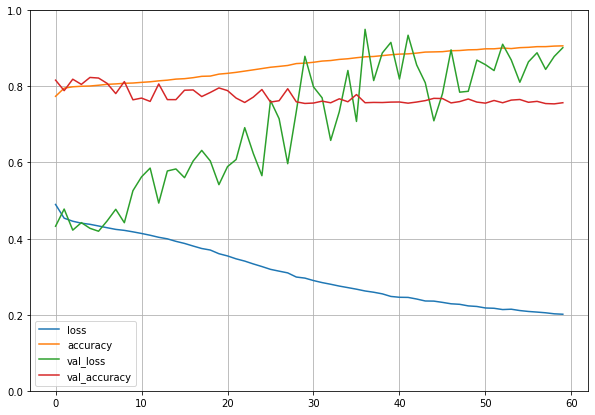

In [55]:
import matplotlib.pyplot as plt

pd.DataFrame(history_model.history).plot(figsize=(10, 7))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()